<a href="https://colab.research.google.com/github/Bellapzq/semantic-segmentation-autonomous-driving/blob/main/DualEncoderDeepLabV3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# To realize the model in the paper
**This part is from JJ, so we are same.**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

# Install the required library for segmentation models
!pip install segmentation_models_pytorch
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from PIL import Image
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms
import segmentation_models_pytorch as smp
from sklearn.model_selection import train_test_split
from tqdm import tqdm
import seaborn as sns
from sklearn.metrics import confusion_matrix

Mounted at /content/drive
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 5.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 68.5/68.5 kB 6.2 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64

# Get Datasets & DataLoaders using Pytorch
Main point of this part is to organise the csv and img, making it more easy for later training.

We set
- Resizing size: the H and W must can be divided by 32 (in paper, resize to 512*512)
- Batch size
- Number of training, validation and testing set

in this part

In [ ]:
# Define the dataset class
class WildScenes2dDataset(Dataset):
    def __init__(self, data_frame, root_dir, transform=None, label_transform=None):
        self.data_frame = data_frame
        self.root_dir = root_dir
        self.transform = transform
        self.label_transform = label_transform

    def __len__(self):
        return len(self.data_frame)

    def __getitem__(self, idx):
        img_path = os.path.join(self.root_dir, self.data_frame.iloc[idx, 1])
        label_path = os.path.join(self.root_dir, self.data_frame.iloc[idx, 2])

        # Load the images
        image = Image.open(img_path).convert("RGB")
        index_label = Image.open(label_path)

        # Apply transformations if any
        if self.transform:
            image = self.transform(image)

        if self.label_transform:
            index_label = self.label_transform(index_label)
            index_label = index_label - 1  # Subtract 1 to convert to 0-based indexing

        return image, index_label


####################
H, W = 512, 512 # must can be divided by 32 !!
####################

# Define the transformations
transform = transforms.Compose([
    transforms.Resize((H, W)),  # Resize to the given dimensions
    transforms.ToTensor()
])

label_transform = transforms.Compose([
    transforms.Resize((H, W), interpolation=Image.NEAREST),  # Resize with nearest neighbor interpolation to keep label values intact
    transforms.Lambda(lambda x: torch.from_numpy(np.array(x, dtype=np.int64)))  # Convert to tensor and keep as int64
])

####################
# Define paths
csv_train_path = '/content/drive/MyDrive/9517_project/splits/opt2d/train.csv'
data_root_dir = '/content/drive/MyDrive/9517_project/WildScenes'


# Variables to control the size of datasets
train_subset_size = 1400
val_subset_size = 300
test_subset_size = 300
####################

# Read the CSV file
data_frame = pd.read_csv(csv_train_path)

# Split the data into training and validation sets
train_df, val_df = train_test_split(data_frame, test_size=val_subset_size, random_state=42)

# Ensure the train subset size does not exceed the actual training data size
train_subset_size = min(train_subset_size, len(train_df))

# Sample the training data
train_df = train_df.sample(n=train_subset_size, random_state=42).reset_index(drop=True)

# Create datasets
train_dataset = WildScenes2dDataset(data_frame=train_df, root_dir=data_root_dir, transform=transform, label_transform=label_transform)
val_dataset = WildScenes2dDataset(data_frame=val_df, root_dir=data_root_dir, transform=transform, label_transform=label_transform)

####################
# Create dataloaders with adjusted batch size and workers
batch_size = 10
####################

n_cpu = os.cpu_count()

train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=n_cpu)
val_dataloader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=n_cpu)

# For test dataset
csv_test_path = '/content/drive/MyDrive/9517_project/splits/opt2d/pre/test.csv'
test_df = pd.read_csv(csv_test_path).sample(n=test_subset_size, random_state=42).reset_index(drop=True)
test_dataset = WildScenes2dDataset(data_frame=test_df, root_dir=data_root_dir, transform=transform, label_transform=label_transform)
test_dataloader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=n_cpu)


In [ ]:
# Example of iterating through the DataLoader
for images, labels in test_dataloader:
    print(images.shape)  # Should be [batch_size, 3, 512, 512]
    print(labels.shape)  # Should be [batch_size, 1, 512, 512]
    # Add your training code here
    break

torch.Size([10, 3, 512, 512])
torch.Size([10, 512, 512])


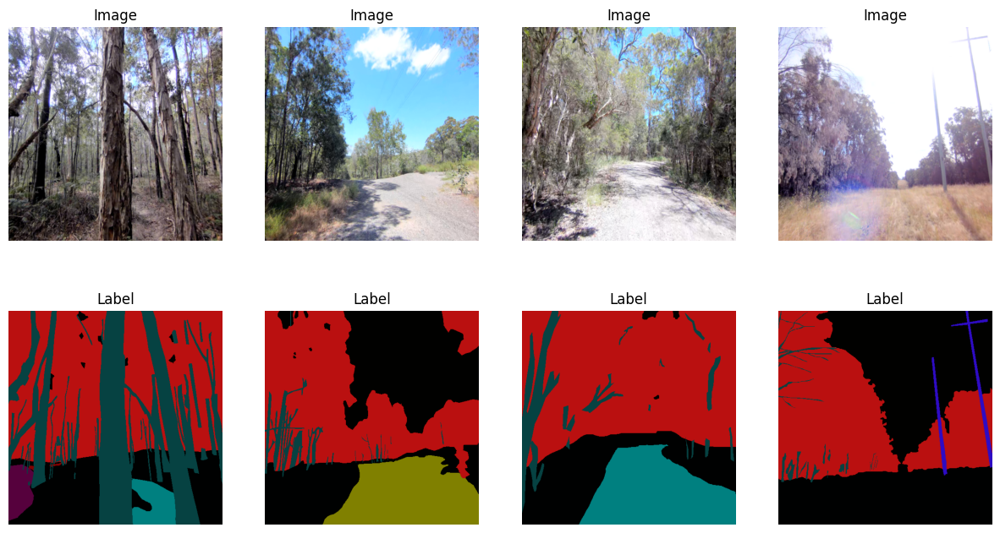

Batch size: 10
Image shape: (3, 512, 512)
Label shape: (512, 512)
Number of unique classes in first label: 7
Number of training samples: 1400
Number of validation samples: 300
Number of testing samples: 300


In [ ]:
# Custom color palette for labels (18 colors)
palette = [
    (60, 180, 75), (0, 128, 128), (128, 128, 128), (145, 30, 180),
    (128, 128, 0), (255, 225, 25), (250, 190, 190), (70, 240, 240),
    (170, 255, 195), (0, 0, 128), (170, 110, 40), (210, 245, 60),
    (240, 50, 230), (0, 130, 200), (128, 0, 0), (255, 0, 255),
    (255, 255, 0), (0, 255, 255)
]

# Create a colormap from the palette
cmap = mcolors.ListedColormap(palette)

# Function to decode the label tensor to a colored image
def decode_segmap(label_mask, colormap):
    label_colormap = np.zeros((label_mask.shape[0], label_mask.shape[1], 3), dtype=np.uint8)
    for label in range(0, len(colormap.colors)):
        label_colormap[label_mask == label] = np.array(colormap.colors[label]) * 255
    return label_colormap

# Debug function to show images and labels
def show_sample(dataloader):
    # Get a batch of samples
    images, labels = next(iter(dataloader))

    # Convert to numpy for display
    images = images.numpy()
    labels = labels.numpy()

    # Display the images and labels
    fig, axs = plt.subplots(2, 4, figsize=(15, 8))
    for i in range(4):
        axs[0, i].imshow(np.transpose(images[i], (1, 2, 0)))
        axs[0, i].set_title("Image")
        axs[0, i].axis('off')

        # Ensure the labels are displayed correctly by decoding the label
        label_img = decode_segmap(labels[i] if labels[i].ndim == 2 else labels[i][0], cmap)
        axs[1, i].imshow(label_img)
        axs[1, i].set_title("Label")
        axs[1, i].axis('off')
    plt.show()

    # Print additional information
    print(f"Batch size: {len(images)}")
    print(f"Image shape: {images[0].shape}")
    print(f"Label shape: {labels[0].shape}")
    print(f"Number of unique classes in first label: {len(np.unique(labels[0]))}")

# Show a sample from the training dataloader
show_sample(train_dataloader)

# Print the number of samples in each dataset
print(f"Number of training samples: {len(train_dataset)}")
print(f"Number of validation samples: {len(val_dataset)}")
print(f"Number of testing samples: {len(test_dataset)}")

# **Final success case: DualEncoderDeepLabV3**

# Method use: Deeplab V3 base, but used 2 different encoders (ResNet-101 and EfficientNet-B3).

First, we need to know how deeplab v3 work.
1. Pre-trained ResNet as encoder: ResNet is used as a feature extractor (encoder) to extract multi-scale features from the input image. These features will serve as the basis for subsequent processing.

2. Introducing dilated convolution: Certain layers of ResNet use dilated convolutions to expand the receptive field without increasing the number of parameters and computational complexity. This enhances the model's ability to capture long-range dependencies.

3. ASPP Module: The ASPP module captures contextual information at different scales through parallel multi-scale dilated convolutions. It applies several dilated convolutions with different dilation rates on the feature map and then fuses these features to enhance multi-scale feature representation.

4. Decoding and splitting headers: The feature map processed by the ASPP module is upsampled through the decoder and finally generates a segmentation map of the same size as the input image.


**Why I did this improve?**

In the first stap in deeplav v3, extract multi-scale features of the input image as the basis for subsequent processing can be catched. In order to capture richer multi-scale information and improve the performance of the model, I combine the features from different encoders.

**How I improve the Pre-trained part?**

I used two encoders (ResNet-101 and EfficientNet-B3) to extract image features respectively, concatenated these features in the channel dimension, and then passed them through a classification head to generate the final segmentation result.

**Why I chose ResNet and EfficientNet?**

There is a lot of encoder can be chosen to pre-train the natural image, such as ResNet, EfficientNet, MobileNet, DenseNet. Compared with ResNet and EfficientNet, the feature extraction capability may be slightly weaker, while DenseNet requires a large amount of memory during calculation.

Our task this time is to do segmentation for images of natural environments, which include a lot of complex details. ResNet has a depth of up to 152 layers that can be selected, which can capture very complex features. However, because its large number of parameters may lead to overfitting, I paid attention to the problem of overfitting in the process of training data.

Then, compared with other models, EfficientNet has fewer parameters and is more computationally efficient.

**The Problem I met when I combined two encoder:**

1. The running mean and variance shapes of the Batch Normalization layer do not match the shape of the input feature map. This usually happens when the channel numbers of the feature map are not properly adjusted in some processing.

  Solution: Verify the feature map shape at each step to ensure consistent output shapes in each section. Add debugging information in the forward method to print the shape of each feature map, ensuring they are correctly adjusted before feature fusion.

2. When using Batch Normalization, the number of channels in the input feature map does not match the expected number of channels in the BatchNorm layer.

  Solution: In the ASPP class: Use nn.Sequential in convs to create a combination of dilated convolutions, BatchNorm, and ReLU, ensuring each dilated convolution is followed by the correct BatchNorm and ReLU.

  In the DualEncoderDeepLabV3 class: Ensure the output channel number of the ASPP module is correct. Add debugging information after adjusting the channel number of the feature map to ensure the channel number adjustment is correct.

3. The sizes of the outputs and index_labels given to the loss function do not match.

  Solution: Ensure the sizes of the outputs and index_labels are consistent.

  In the DualEncoderDeepLabV3 class: Add an Upsample operation to ensure the spatial dimensions of the output match those of the input image.

4. The shapes of the outputs and the target index_labels do not match.

  Solution: Adjust the scale_factor in the Upsample operation in the DualEncoderDeepLabV3 class to ensure the output size matches the input image size.



In [ ]:
# Create dataloaders with adjusted batch size and workers

train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=n_cpu)
val_dataloader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=n_cpu)
test_dataloader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=n_cpu)


# Move model to GPU if available
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Define the ASPP Class
class ASPP(nn.Module):
    def __init__(self, in_channels, out_channels, atrous_rates, dropout_rate=0.5):
        super(ASPP, self).__init__()
        modules = []
        for rate in atrous_rates:
            modules.append(nn.Sequential(
                nn.Conv2d(in_channels, out_channels, kernel_size=3, stride=1, padding=rate, dilation=rate, bias=False),
                nn.BatchNorm2d(out_channels),
                nn.ReLU(inplace=True),
                nn.Dropout(p=dropout_rate)  # Add Dropout layer
            ))
        self.convs = nn.ModuleList(modules)

        self.project = nn.Sequential(
            nn.Conv2d(len(atrous_rates) * out_channels, out_channels, kernel_size=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Dropout(p=dropout_rate)  # Add Dropout layer
        )

    def forward(self, x):
        res = []
        for conv in self.convs:
            res.append(conv(x))
        res = torch.cat(res, dim=1)
        return self.project(res)

# Defining the DualEncoderDeepLabV3 class
class DualEncoderDeepLabV3(nn.Module):
    def __init__(self, encoder1, encoder2, aspp_out_channels=256, num_classes=18, dropout_rate=0.5):
        super(DualEncoderDeepLabV3, self).__init__()
        self.encoder1 = encoder1
        self.encoder2 = encoder2

        self.aspp1 = ASPP(
            in_channels=self.encoder1.out_channels[-1],
            out_channels=aspp_out_channels,
            atrous_rates=[12, 24, 36],
            dropout_rate=dropout_rate  # Pass dropout rate to ASPP
        )

        self.aspp2 = ASPP(
            in_channels=self.encoder2.out_channels[-1],
            out_channels=aspp_out_channels,
            atrous_rates=[12, 24, 36],
            dropout_rate=dropout_rate  # Pass dropout rate to ASPP
        )

        self.conv1 = nn.Conv2d(aspp_out_channels, aspp_out_channels, kernel_size=1)
        self.conv2 = nn.Conv2d(aspp_out_channels, aspp_out_channels, kernel_size=1)

        self.classifier = nn.Sequential(
            nn.Conv2d(aspp_out_channels * 2, num_classes, kernel_size=1)
        )

        self.upsample = nn.Upsample(scale_factor=32, mode='bilinear', align_corners=False)

    def forward(self, x):
        features1 = self.encoder1(x)
        features2 = self.encoder2(x)

        aspp_out1 = self.aspp1(features1[-1])
        aspp_out2 = self.aspp2(features2[-1])

        aspp_out1 = self.conv1(aspp_out1)
        aspp_out2 = self.conv2(aspp_out2)

        combined_features = torch.cat([aspp_out1, aspp_out2], dim=1)

        output = self.classifier(combined_features)
        output = self.upsample(output)

        return output


In [ ]:
# Select ResNet-101 and EfficientNet-B3 as encoders
encoder1 = smp.encoders.get_encoder("resnet101", in_channels=3, weights="imagenet")
encoder2 = smp.encoders.get_encoder("efficientnet-b3", in_channels=3, weights="imagenet")

# Creating a dual encoder model
model = DualEncoderDeepLabV3(encoder1, encoder2, aspp_out_channels=256, num_classes=18)

# If a GPU is available, move the model to the GPU
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = model.to(device)

Downloading: "https://download.pytorch.org/models/resnet101-5d3b4d8f.pth" to /root/.cache/torch/hub/checkpoints/resnet101-5d3b4d8f.pth
100%|██████████| 170M/170M [00:00<00:00, 180MB/s]
Downloading: "https://github.com/lukemelas/EfficientNet-PyTorch/releases/download/1.0/efficientnet-b3-5fb5a3c3.pth" to /root/.cache/torch/hub/checkpoints/efficientnet-b3-5fb5a3c3.pth
100%|██████████| 47.1M/47.1M [00:00<00:00, 454MB/s]


In [ ]:
num_epochs = 20
accumulation_steps = 4

# **About Loss function**

I tried four types of loss function totally, and chose Flocal Loss finally.

**1. First try: Cross-Entropy Loss**

  Advantages: Simple to use, easy to calculate, and performs well for classification tasks.

  Disadvantages: It does not work well for datasets with imbalanced categories. It has poor ability to distinguish small objects or details.

  Analyze: From its shortcomings, it is indeed not suitable for this case. Because in this case, the data of the natural environment is very unbalanced, for example, sometimes there are many trees but few roads. And the natural environment also contains a lot of details.

  Actual training results: When the amount of data is relatively small, the fitting effect and stability are good. However, as the amount of data increases, overfitting becomes obvious and the stability becomes worse. The trained images have fewer details, for example, the complete tree trunk cannot be recognized.

**2. Second try: Hybrid Loss (Cross-Entropy + Dice Loss)**

Advantages: It combines the advantages of two loss functions, and can handle both category imbalance and details and small targets. It improves the performance of the model in different aspects.

Disadvantages: High computational complexity.
Parameters need to be adjusted to balance the weights of different loss functions.

Analyze: This method seems to be very good because it combines the advantages of two loss functions, but it also combines the disadvantages of both.

Actual training results: When the amount of data increases, the training effect is very unstable, just like Cross-Entropy. And it still suffers from severe overfitting after adding measures to reduce overfitting.

**3. Dice Loss**

Advantages: Designed for segmentation tasks, it can handle the problem of class imbalance well. It has good ability to distinguish details and small objects.

Disadvantages: The computational complexity is high. For datasets with particularly unbalanced categories, the effect may not be as good as Focal Loss.

Actual training results: The stability of the loss function is also very poor. The curve of the validation set will fluctuate greatly, and will deviate greatly from the training set in the later stage. The average loss function value is around 0.2, which is higher than Focal Loss. Although the tree trunk can be seen in the trained images, the MIOU is around 0.27. Therefore, the overall effect is still not good.

**4. Focal Loss (I used this one)**

Advantages: Designed to handle class imbalance problems, it has good discrimination ability for small objects and difficult-to-classify samples. It can dynamically adjust the weights of different samples, focusing on difficult-to-classify samples.

Disadvantages: The selection of hyperparameters (α and γ) is sensitive and needs to be adjusted. The computational complexity is higher than Cross-Entropy Loss.

Actual training results:
At first, the effect was very average under the default values ​of alpha=1 and gamma=2. The effect of the validation set was very unstable and almost parallel to the curve of the training set. But its loss function value was very low, which shows that this loss function is very compatible with the method and dataset I used. Therefore, I am willing to try more parameters.

Here are some introductions to the parameters and my thoughts:

α (alpha): used to balance the importance of positive and negative samples. Usually used in cases of class imbalance. The value of α generally ranges from 0 to 1.

γ (gamma): used to adjust the weights of easy and difficult samples. The larger the value of γ, the more the model pays attention to difficult samples. The commonly used γ value ranges from 0 to 5.

My idea is to gradually increase the gamma value. Because this case has many difficult-to-classify samples, and the samples are very diverse. For the alpha value, I think it should be gradually reduced. Because the samples in this case are very diverse, and there are no samples that need special attention.

I tried a lot of values:
alpha=0.4, gamma=2 Mean IOU: 0.4014
alpha=0.3, gamma=3 Mean IOU: 0.4038
alpha=0.4, gamma=4 Mean IOU: 0.4030
alpha=0.3, gamma=4 Mean IOU: 0.4062
alpha=0.4, gamma=5 Mean IOU: 0.4055
alpha=0.2, gamma=4 Mean IOU: 0.4123 Best

In this process, I gradually increased the gamma value, and the details were gradually improved. However, when gamma was 5, there was an error in sample recognition, so I chose 4. Then I tried to adjust the alpha value, and the best effect was achieved when alpha was 0.2. It has good enough stability and no overfitting and best mean nIou.


In [ ]:
import torch.nn.functional as F

class FocalLoss(nn.Module):
    def __init__(self, alpha=0.2, gamma=4 , ignore_index=255):
        super(FocalLoss, self).__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.ignore_index = ignore_index

    def forward(self, inputs, targets):
        inputs = inputs.permute(0, 2, 3, 1).reshape(-1, inputs.size(1))
        targets = targets.view(-1)

        # Filter out ignored targets
        valid_mask = targets != self.ignore_index
        inputs = inputs[valid_mask]
        targets = targets[valid_mask]

        # Compute log probabilities
        logpt = F.log_softmax(inputs, dim=1)
        logpt = logpt.gather(1, targets.unsqueeze(1))
        logpt = logpt.view(-1)
        pt = logpt.exp()

        # Compute the focal loss
        loss = -1 * self.alpha * (1 - pt) ** self.gamma * logpt
        return loss.mean()


In [ ]:
# Instantiate the loss function
criterion = FocalLoss(alpha=0.2, gamma=4 , ignore_index=255)
# Defining the optimizer with L2 regularization
optimizer = optim.Adam(model.parameters(), lr=1e-4, weight_decay=1e-5)

# Defining a learning rate scheduler
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=1e-6)

**My measures to prevent overfitting and increase stability:**

use L2 regularization (in optimizer. weight_decay=1e-5)

set Dropout layer (in Define the ASPP Class and Defining the DualEncoderDeepLabV3 class part)

Epoch 1/20: 100%|██████████| 140/140 [02:42<00:00,  1.16s/batch, loss=0.144]


Epoch [1/20], Training Loss: 0.1441, Validation Loss: 0.0463


Epoch 2/20: 100%|██████████| 140/140 [00:41<00:00,  3.37batch/s, loss=0.0385]


Epoch [2/20], Training Loss: 0.0385, Validation Loss: 0.0303


Epoch 3/20: 100%|██████████| 140/140 [00:41<00:00,  3.36batch/s, loss=0.0279]


Epoch [3/20], Training Loss: 0.0279, Validation Loss: 0.0255


Epoch 4/20: 100%|██████████| 140/140 [00:41<00:00,  3.35batch/s, loss=0.0229]


Epoch [4/20], Training Loss: 0.0229, Validation Loss: 0.0237


Epoch 5/20: 100%|██████████| 140/140 [00:41<00:00,  3.35batch/s, loss=0.0195]


Epoch [5/20], Training Loss: 0.0195, Validation Loss: 0.0233


Epoch 6/20: 100%|██████████| 140/140 [00:41<00:00,  3.35batch/s, loss=0.0172]


Epoch [6/20], Training Loss: 0.0172, Validation Loss: 0.0225


Epoch 7/20: 100%|██████████| 140/140 [00:41<00:00,  3.36batch/s, loss=0.0153]


Epoch [7/20], Training Loss: 0.0153, Validation Loss: 0.0219


Epoch 8/20: 100%|██████████| 140/140 [00:41<00:00,  3.36batch/s, loss=0.0139]


Epoch [8/20], Training Loss: 0.0139, Validation Loss: 0.0223


Epoch 9/20: 100%|██████████| 140/140 [00:41<00:00,  3.36batch/s, loss=0.0128]


Epoch [9/20], Training Loss: 0.0128, Validation Loss: 0.0222


Epoch 10/20: 100%|██████████| 140/140 [00:41<00:00,  3.36batch/s, loss=0.012]


Epoch [10/20], Training Loss: 0.0120, Validation Loss: 0.0221


Epoch 11/20: 100%|██████████| 140/140 [00:42<00:00,  3.32batch/s, loss=0.0114]


Epoch [11/20], Training Loss: 0.0114, Validation Loss: 0.0220


Epoch 12/20: 100%|██████████| 140/140 [00:41<00:00,  3.36batch/s, loss=0.0108]


Epoch [12/20], Training Loss: 0.0108, Validation Loss: 0.0222


Epoch 13/20: 100%|██████████| 140/140 [00:41<00:00,  3.36batch/s, loss=0.0105]


Epoch [13/20], Training Loss: 0.0105, Validation Loss: 0.0226


Epoch 14/20: 100%|██████████| 140/140 [00:41<00:00,  3.35batch/s, loss=0.0102]


Epoch [14/20], Training Loss: 0.0102, Validation Loss: 0.0224


Epoch 15/20: 100%|██████████| 140/140 [00:41<00:00,  3.35batch/s, loss=0.00995]


Epoch [15/20], Training Loss: 0.0100, Validation Loss: 0.0225


Epoch 16/20: 100%|██████████| 140/140 [00:42<00:00,  3.33batch/s, loss=0.00973]


Epoch [16/20], Training Loss: 0.0097, Validation Loss: 0.0225


Epoch 17/20: 100%|██████████| 140/140 [00:42<00:00,  3.33batch/s, loss=0.00962]


Epoch [17/20], Training Loss: 0.0096, Validation Loss: 0.0229


Epoch 18/20: 100%|██████████| 140/140 [00:41<00:00,  3.34batch/s, loss=0.0095]


Epoch [18/20], Training Loss: 0.0095, Validation Loss: 0.0228


Epoch 19/20: 100%|██████████| 140/140 [00:41<00:00,  3.34batch/s, loss=0.00949]


Epoch [19/20], Training Loss: 0.0095, Validation Loss: 0.0228


Epoch 20/20: 100%|██████████| 140/140 [00:41<00:00,  3.34batch/s, loss=0.00945]


Epoch [20/20], Training Loss: 0.0095, Validation Loss: 0.0230
Training completed


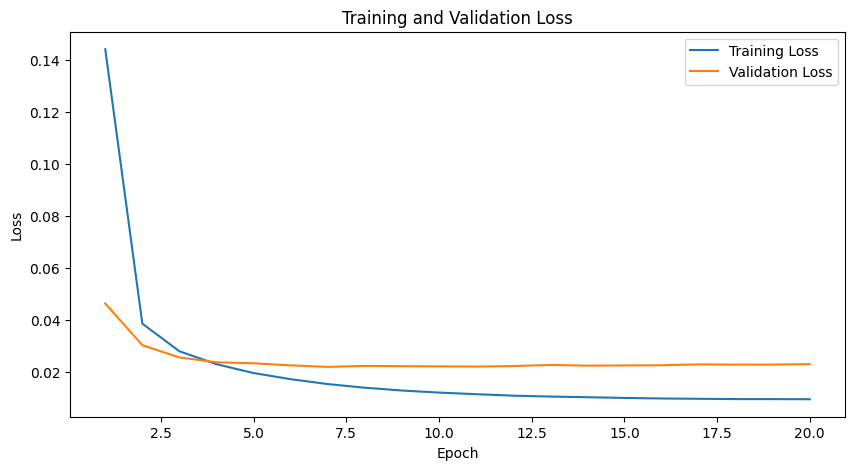

In [ ]:
# Define training and validation loops
def train_and_validate(model, train_dataloader, val_dataloader, criterion, optimizer, scheduler, num_epochs, accumulation_steps, device):
    train_losses = []
    val_losses = []
    best_val_loss = float('inf')
    best_model_wts = None

    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        optimizer.zero_grad()

        with tqdm(total=len(train_dataloader), desc=f"Epoch {epoch+1}/{num_epochs}", unit='batch') as pbar:
            for i, (images, index_labels) in enumerate(train_dataloader):
                images = images.to(device)
                index_labels = index_labels.to(device)

                # Forward Propagation
                outputs = model(images)
                loss = criterion(outputs, index_labels.long())
                loss.backward()

                # Gradient Accumulation
                if (i + 1) % accumulation_steps == 0:
                    optimizer.step()
                    optimizer.zero_grad()

                running_loss += loss.item()
                pbar.set_postfix({'loss': running_loss / (i + 1)})
                pbar.update(1)

        train_loss = running_loss / len(train_dataloader)
        train_losses.append(train_loss)

        # Validation
        model.eval()
        val_loss = 0.0
        with torch.no_grad():
            for images, index_labels in val_dataloader:
                images = images.to(device)
                index_labels = index_labels.to(device)

                outputs = model(images)
                loss = criterion(outputs, index_labels.long())
                val_loss += loss.item()

        val_loss /= len(val_dataloader)
        val_losses.append(val_loss)

        # Save the best model weights
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_model_wts = model.state_dict()

        print(f"Epoch [{epoch+1}/{num_epochs}], Training Loss: {train_loss:.4f}, Validation Loss: {val_loss:.4f}")
        scheduler.step()

    print("Training completed")

    # Plot the loss curves
    plt.figure(figsize=(10, 5))
    plt.plot(range(1, num_epochs + 1), train_losses, label='Training Loss')
    plt.plot(range(1, num_epochs + 1), val_losses, label='Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.title('Training and Validation Loss')
    plt.show()

    # Load the best model weights
    if best_model_wts is not None:
        model.load_state_dict(best_model_wts)

    return model

model = train_and_validate(model, train_dataloader, val_dataloader, criterion, optimizer, scheduler, num_epochs, accumulation_steps, device)

0: "asphalt",
1: "dirt",
2: "mud",
3: "water",
4: "gravel",
5: "other-terrain",
6: "tree-trunk",
7: "tree-foliage",
8: "bush",
9: "fence",
10: "structure",
11: "pole",
12: "vehicle",
13: "rock",
14: "log",
15: "other-object",
16: "sky",
17: "grass"

# miou detail
# good and terrible examples pic and analyse


In [ ]:
# Original class names and indices
original_class_names = ["asphalt", "dirt", "mud", "water", "gravel", "other-terrain", "tree-trunk",
                        "tree-foliage", "bush", "fence", "structure", "pole", "vehicle", "rock",
                        "log", "other-object", "sky", "grass"]

# Class names and indices for evaluation after merging and excluding
class_names = ["bush", "dirt", "fence", "grass", "gravel", "log", "mud",
               "other-object", "other-terrain", "rock", "sky", "structure",
               "tree-foliage", "tree-trunk", "water"]

# Corresponding indices for classes to evaluate after merging and excluding
classes_to_evaluate = [8, 1, 9, 17, 4, 14, 2, 15, 5, 13, 16, 10, 7, 6, 3]

# Function to remap labels for mIoU calculation
def remap_labels(preds, labels):
    remapped_preds = preds.copy()
    remapped_labels = labels.copy()

    remapped_preds[preds == 0] = 5  # Merge "asphalt" into "other-terrain"
    remapped_labels[labels == 0] = 5

    remapped_preds[preds == 11] = 15  # Merge "pole" into "other-object"
    remapped_labels[labels == 11] = 15

    return remapped_preds, remapped_labels

# Function to compute mIoU for specified classes and return individual class IoUs
def compute_miou(preds, labels, classes_to_evaluate):
    iou_list = []
    class_ious = {}

    preds, labels = remap_labels(preds, labels)

    for class_id in classes_to_evaluate:
        intersection = np.logical_and(preds == class_id, labels == class_id).sum()
        union = np.logical_or(preds == class_id, labels == class_id).sum()
        if union == 0:
            class_ious[class_id] = float('nan')  # Assign nan if there is no union
            continue
        iou = intersection / union
        iou_list.append(iou)
        class_ious[class_id] = iou

    if len(iou_list) == 0:
        return 0, class_ious
    miou = np.nanmean(iou_list)  # Use nanmean to ignore nan values
    return miou, class_ious

# Function to evaluate mIoU on the test set
def evaluate_miou(model, dataloader, device, classes_to_evaluate):
    model.eval()
    total_miou = 0
    class_ious = {class_id: [] for class_id in classes_to_evaluate}
    with torch.no_grad():
        for images, labels in dataloader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            preds = torch.argmax(outputs, dim=1).cpu().numpy()
            labels = labels.cpu().numpy()

            miou, class_iou = compute_miou(preds, labels, classes_to_evaluate)
            total_miou += miou
            for class_id, iou in class_iou.items():
                class_ious[class_id].append(iou)

    avg_class_ious = {class_id: np.nanmean(iou_list) for class_id, iou_list in class_ious.items()}
    return total_miou / len(dataloader), avg_class_ious

# Evaluate mIoU on the test dataset
miou, class_ious = evaluate_miou(model, test_dataloader, device, classes_to_evaluate)
print(f"Mean IOU: {miou:.4f}")
for class_id, iou in class_ious.items():
    class_name = class_names[classes_to_evaluate.index(class_id)]
    print(f"Class {class_name} IOU: {iou}")


Mean IOU: 0.4243
Class bush IOU: 0.20980108326886465
Class dirt IOU: 0.7775658406818583
Class fence IOU: nan
Class grass IOU: 0.629364703087697
Class gravel IOU: 0.0
Class log IOU: 0.2052393757408192
Class mud IOU: 0.0
Class other-object IOU: 0.04920136194654371
Class other-terrain IOU: nan
Class rock IOU: 0.19366093693394382
Class sky IOU: 0.6194662838755749
Class structure IOU: 0.0
Class tree-foliage IOU: 0.7744543951884062
Class tree-trunk IOU: 0.2892991351237902
Class water IOU: 0.5951014219891118


<ipython-input-12-4008adb324c0>:67: RuntimeWarning: Mean of empty slice
  avg_class_ious = {class_id: np.nanmean(iou_list) for class_id, iou_list in class_ious.items()}


Best Predictions:
-------- Best 1 --------
Each class mIoU:
    Class dirt IoU: 0.9011
    Class fence IoU: nan
    Class grass IoU: 0.6951
    Class bush IoU: 0.2175
    Class gravel IoU: nan
    Class log IoU: nan
    Class mud IoU: nan
    Class other-object IoU: nan
    Class other-terrain IoU: nan
    Class rock IoU: nan
    Class sky IoU: 0.7736
    Class structure IoU: nan
    Class tree-foliage IoU: 0.6890
    Class tree-trunk IoU: 0.4348
    Class water IoU: nan
-------- Best 2 --------
Each class mIoU:
    Class bush IoU: nan
    Class dirt IoU: 0.3426
    Class fence IoU: nan
    Class grass IoU: 0.9214
    Class gravel IoU: nan
    Class log IoU: nan
    Class mud IoU: nan
    Class other-object IoU: nan
    Class other-terrain IoU: nan
    Class rock IoU: nan
    Class sky IoU: 0.9465
    Class structure IoU: nan
    Class tree-foliage IoU: 0.8832
    Class tree-trunk IoU: 0.0072
    Class water IoU: nan
-------- Best 3 --------
Each class mIoU:
    Class bush IoU: nan
   

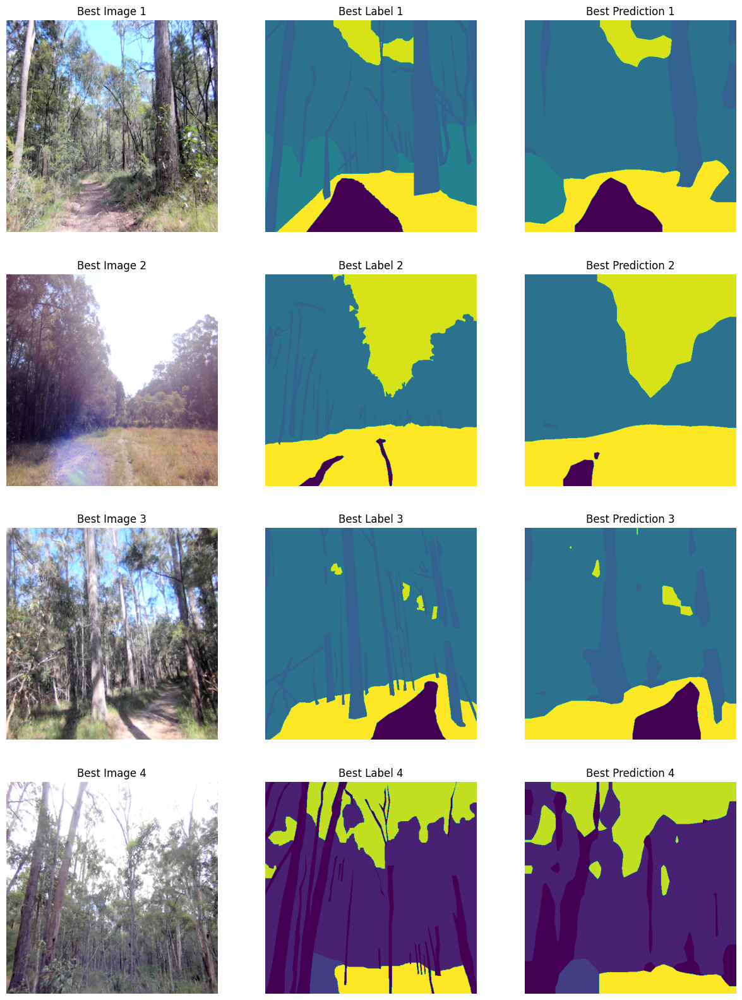

Worst Predictions:
-------- Worst 1 --------
Each class mIoU:
    Class bush IoU: 0.0000
    Class dirt IoU: 0.0000
    Class fence IoU: nan
    Class grass IoU: 0.5396
    Class gravel IoU: nan
    Class log IoU: 0.2120
    Class mud IoU: nan
    Class other-object IoU: nan
    Class other-terrain IoU: nan
    Class rock IoU: nan
    Class sky IoU: 0.0000
    Class structure IoU: nan
    Class tree-foliage IoU: 0.7016
    Class tree-trunk IoU: 0.1793
    Class water IoU: nan
-------- Worst 2 --------
Each class mIoU:
    Class dirt IoU: 0.5869
    Class fence IoU: nan
    Class gravel IoU: nan
    Class other-object IoU: nan
    Class other-terrain IoU: nan
    Class structure IoU: nan
    Class tree-foliage IoU: 0.6221
    Class water IoU: 0.5628
    Class sky IoU: 0.3368
    Class tree-trunk IoU: 0.2767
    Class rock IoU: 0.0814
    Class bush IoU: 0.0000
    Class grass IoU: 0.0000
    Class log IoU: 0.0000
    Class mud IoU: 0.0000
-------- Worst 3 --------
Each class mIoU:
    C

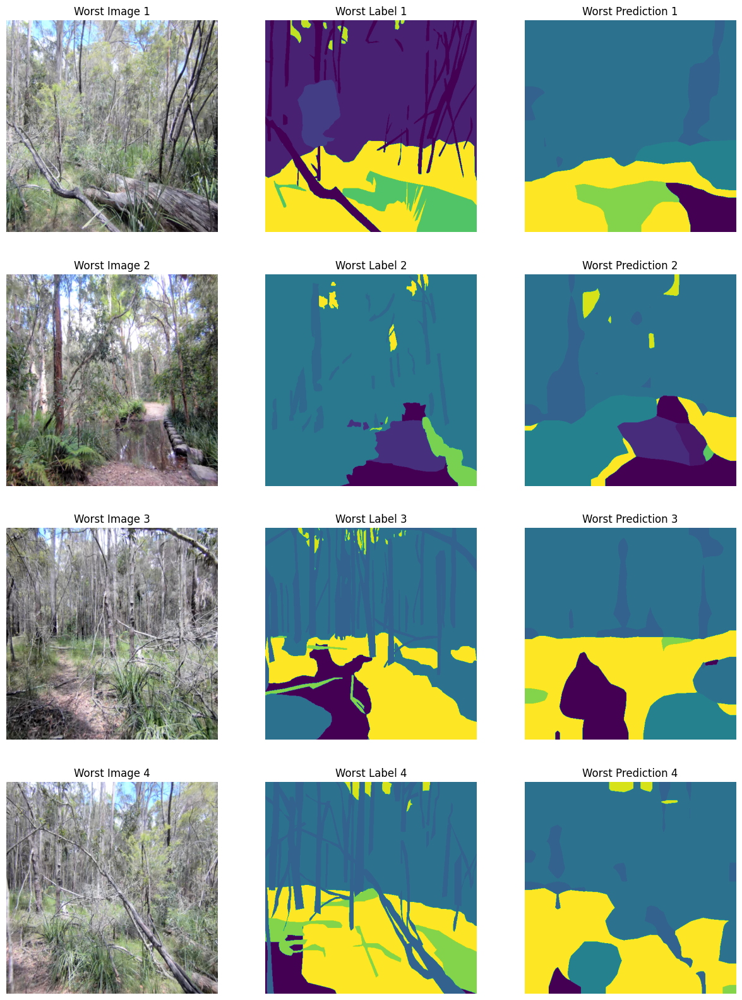

In [ ]:
# Function to get indices of best and worst images based on IoU
def get_best_worst_indices(preds, labels, num_images=4):
    iou_list = []
    image_class_ious = []
    for i in range(len(preds)):
        iou, class_iou = compute_miou(preds[i], labels[i], classes_to_evaluate)
        iou_list.append(iou)
        image_class_ious.append(class_iou)
    sorted_indices = np.argsort(iou_list)
    best_indices = sorted_indices[-num_images:]
    worst_indices = sorted_indices[:num_images]
    return best_indices, worst_indices, image_class_ious

# Visualization function with best and worst images
def visualize_predictions(model, dataloader, device, num_images=4):
    model.eval()
    images_batch, labels_batch, preds_batch, iou_batch = [], [], [], []

    with torch.no_grad():
        for images, labels in dataloader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            preds = torch.argmax(outputs, dim=1).cpu().numpy()
            labels = labels.cpu().numpy()
            images = images.cpu().numpy()

            for i in range(images.shape[0]):
                images_batch.append(images[i])
                labels_batch.append(labels[i])
                preds_batch.append(preds[i])

    best_indices, worst_indices, iou_batch = get_best_worst_indices(preds_batch, labels_batch, num_images)

    # Plot images, labels and predictions for best indices
    print("Best Predictions:")
    fig, axs = plt.subplots(num_images, 3, figsize=(15, 5 * num_images))
    for idx, i in enumerate(best_indices):
        img = np.transpose(images_batch[i], (1, 2, 0))
        label = labels_batch[i]
        pred = preds_batch[i]
        iou, class_iou = compute_miou(pred, label, classes_to_evaluate)

        axs[idx, 0].imshow(img)
        axs[idx, 0].set_title(f"Best Image {idx+1}")
        axs[idx, 0].axis('off')

        axs[idx, 1].imshow(label, cmap='viridis')
        axs[idx, 1].set_title(f"Best Label {idx+1}")
        axs[idx, 1].axis('off')

        axs[idx, 2].imshow(pred, cmap='viridis')
        axs[idx, 2].set_title(f"Best Prediction {idx+1}")
        axs[idx, 2].axis('off')

        # Print detailed information
        print(f"-------- Best {idx+1} --------")
        print("Each class mIoU:")
        sorted_class_iou = sorted(class_iou.items(), key=lambda x: x[1], reverse=True)
        for class_id, iou_value in sorted_class_iou:
            class_name = class_names[classes_to_evaluate.index(class_id)]
            print(f"    Class {class_name} IoU: {iou_value:.4f}")

    plt.show()

    # Plot images, labels and predictions for worst indices
    print("Worst Predictions:")
    fig, axs = plt.subplots(num_images, 3, figsize=(15, 5 * num_images))
    for idx, i in enumerate(worst_indices):
        img = np.transpose(images_batch[i], (1, 2, 0))
        label = labels_batch[i]
        pred = preds_batch[i]
        iou, class_iou = compute_miou(pred, label, classes_to_evaluate)

        axs[idx, 0].imshow(img)
        axs[idx, 0].set_title(f"Worst Image {idx+1}")
        axs[idx, 0].axis('off')

        axs[idx, 1].imshow(label, cmap='viridis')
        axs[idx, 1].set_title(f"Worst Label {idx+1}")
        axs[idx, 1].axis('off')

        axs[idx, 2].imshow(pred, cmap='viridis')
        axs[idx, 2].set_title(f"Worst Prediction {idx+1}")
        axs[idx, 2].axis('off')

        # Print detailed information
        print(f"-------- Worst {idx+1} --------")
        print("Each class mIoU:")
        sorted_class_iou = sorted(class_iou.items(), key=lambda x: x[1], reverse=True)
        for class_id, iou_value in sorted_class_iou:
            class_name = class_names[classes_to_evaluate.index(class_id)]
            print(f"    Class {class_name} IoU: {iou_value:.4f}")

    plt.show()

# Visualize predictions with best and worst images
visualize_predictions(model, test_dataloader, device)

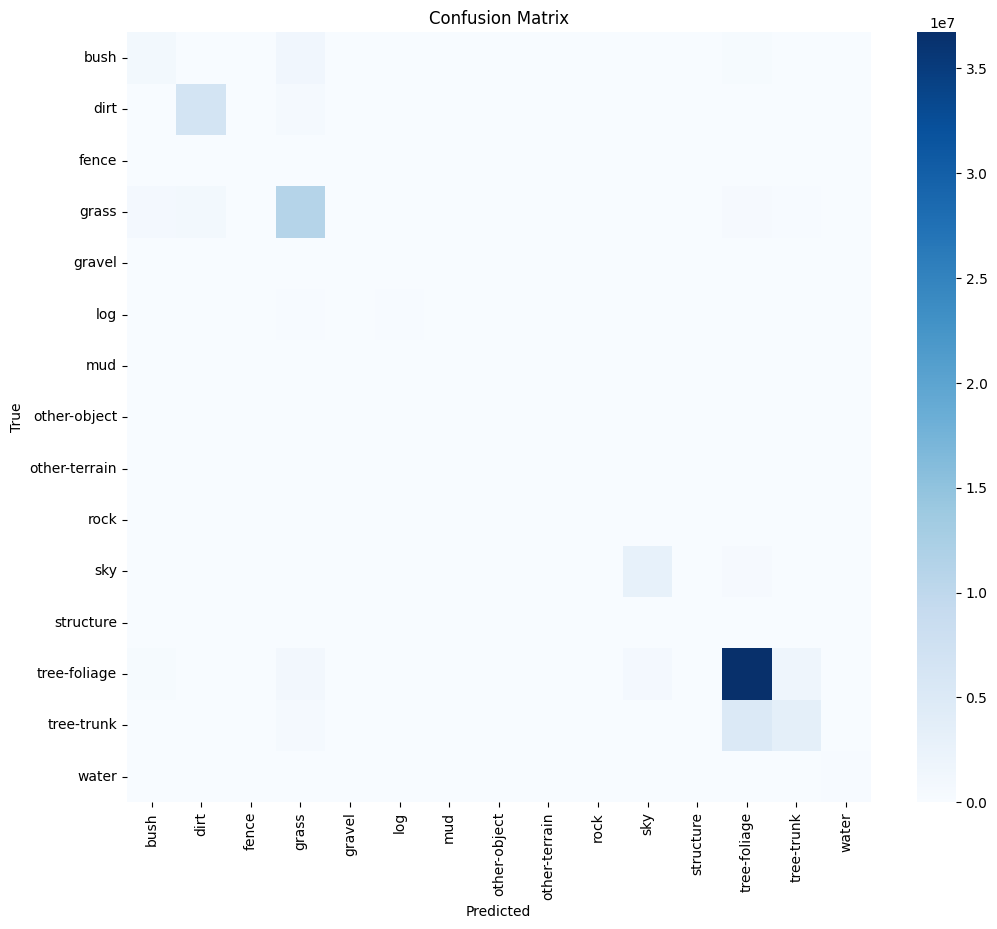

In [ ]:
# Generate and plot confusion matrix
def plot_confusion_matrix(preds, labels, class_names):
    preds, labels = remap_labels(preds, labels)  # Remap labels for confusion matrix
    conf_matrix = confusion_matrix(labels.flatten(), preds.flatten(), labels=classes_to_evaluate)
    plt.figure(figsize=(12, 10))
    sns.heatmap(conf_matrix, annot=False, cmap='Blues', xticklabels=class_names, yticklabels=class_names)  # Ignore the numbers
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title('Confusion Matrix')
    plt.show()

# Prepare data for confusion matrix
all_preds, all_labels = [], []
with torch.no_grad():
    for images, labels in test_dataloader:
        images = images.to(device)
        labels = labels.to(device)
        outputs = model(images)
        preds = torch.argmax(outputs, dim=1).cpu().numpy()
        labels = labels.cpu().numpy()

        all_preds.extend(preds)
        all_labels.extend(labels)

all_preds = np.concatenate(all_preds).flatten()
all_labels = np.concatenate(all_labels).flatten()

# Plot confusion matrix
plot_confusion_matrix(all_preds, all_labels, class_names)


In [ ]:
# Output mIoU chart in text format
def print_miou_chart(miou, class_ious, model_name):
    sorted_class_names = sorted(class_names)
    sorted_class_ious = [class_ious[classes_to_evaluate[class_names.index(name)]] for name in sorted_class_names]

    print(f'{model_name} \nmIoU: {miou:.2f}')
    for class_name, iou in zip(sorted_class_names, sorted_class_ious):
        print(f'{class_name}: {iou:.2f}')

# Print mIoU chart
print_miou_chart(miou, class_ious, 'Model')

Model 
mIoU: 0.42
bush: 0.21
dirt: 0.78
fence: nan
grass: 0.63
gravel: 0.00
log: 0.21
mud: 0.00
other-object: 0.05
other-terrain: nan
rock: 0.19
sky: 0.62
structure: 0.00
tree-foliage: 0.77
tree-trunk: 0.29
water: 0.60


# **Here is ResNet50 and EfficientNet-b0**

**You can use this example to prove why I use ResNet101 and EfficientNet-b3.**

The main reason is not deep enough. I use same loss function and also use dropout layer and L2 here. But it's mIou is lower then ResNet101 and EfficientNet-b3. Also, you can see the images in the result, which has less details.

In [ ]:
class ASPP(nn.Module):
    def __init__(self, in_channels, out_channels, atrous_rates):
        super(ASPP, self).__init__()
        modules = []
        for rate in atrous_rates:
            modules.append(nn.Sequential(
                nn.Conv2d(in_channels, out_channels, kernel_size=3, stride=1, padding=rate, dilation=rate, bias=False),
                nn.BatchNorm2d(out_channels),
                nn.ReLU(inplace=True),
                nn.Dropout(0.5)  # 添加Dropout层，设置dropout rate为0.5
            ))
        self.convs = nn.ModuleList(modules)
        self.project = nn.Sequential(
            nn.Conv2d(len(atrous_rates) * out_channels, out_channels, kernel_size=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        res = []
        for conv in self.convs:
            res.append(conv(x))
        res = torch.cat(res, dim=1)
        return self.project(res)

class DualEncoderDeepLabV3(nn.Module):
    def __init__(self, encoder1, encoder2, aspp_out_channels=256, num_classes=18):
        super(DualEncoderDeepLabV3, self).__init__()
        self.encoder1 = encoder1
        self.encoder2 = encoder2

        self.aspp1 = ASPP(
            in_channels=self.encoder1.out_channels[-1],
            out_channels=aspp_out_channels,
            atrous_rates=[12, 24, 36]
        )

        self.aspp2 = ASPP(
            in_channels=self.encoder2.out_channels[-1],
            out_channels=aspp_out_channels,
            atrous_rates=[12, 24, 36]
        )

        # Make sure the ASPP modules have the same number of output channels
        self.conv1 = nn.Conv2d(aspp_out_channels, aspp_out_channels, kernel_size=1)
        self.conv2 = nn.Conv2d(aspp_out_channels, aspp_out_channels, kernel_size=1)

        self.classifier = nn.Sequential(
            nn.Conv2d(aspp_out_channels * 2, num_classes, kernel_size=1)
        )

        self.upsample = nn.Upsample(scale_factor=32, mode='bilinear', align_corners=False)

    def forward(self, x):
        features1 = self.encoder1(x)
        features2 = self.encoder2(x)

        aspp_out1 = self.aspp1(features1[-1])
        aspp_out2 = self.aspp2(features2[-1])

        print(f"ASPP Output Shapes: {aspp_out1.shape}, {aspp_out2.shape}")

        # Adjust the number of channels
        aspp_out1 = self.conv1(aspp_out1)
        aspp_out2 = self.conv2(aspp_out2)

        print(f"Adjusted ASPP Output Shapes: {aspp_out1.shape}, {aspp_out2.shape}")

        combined_features = torch.cat([aspp_out1, aspp_out2], dim=1)
        print(f"Combined Features Shape: {combined_features.shape}")

        output = self.classifier(combined_features)
        output = self.upsample(output)

        return output


In [ ]:
# Initialize the encoder and load pre-trained weights
encoder1 = smp.encoders.get_encoder("resnet50", in_channels=3, weights="imagenet")
encoder2 = smp.encoders.get_encoder("efficientnet-b0", in_channels=3, weights="imagenet")

# Creating a dual encoder model
model = DualEncoderDeepLabV3(encoder1, encoder2, aspp_out_channels=256, num_classes=18)

# If a GPU is available, move the model to the GPU
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = model.to(device)

Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /root/.cache/torch/hub/checkpoints/resnet50-19c8e357.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 354MB/s]
Downloading: "https://github.com/lukemelas/EfficientNet-PyTorch/releases/download/1.0/efficientnet-b0-355c32eb.pth" to /root/.cache/torch/hub/checkpoints/efficientnet-b0-355c32eb.pth
100%|██████████| 20.4M/20.4M [00:00<00:00, 39.0MB/s]


In [ ]:
import torch.nn.functional as F

class FocalLoss(nn.Module):
    def __init__(self, alpha=0.2, gamma=4 , ignore_index=255):
        super(FocalLoss, self).__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.ignore_index = ignore_index

    def forward(self, inputs, targets):
        inputs = inputs.permute(0, 2, 3, 1).reshape(-1, inputs.size(1))
        targets = targets.view(-1)

        # Filter out ignored targets
        valid_mask = targets != self.ignore_index
        inputs = inputs[valid_mask]
        targets = targets[valid_mask]

        # Compute log probabilities
        logpt = F.log_softmax(inputs, dim=1)
        logpt = logpt.gather(1, targets.unsqueeze(1))
        logpt = logpt.view(-1)
        pt = logpt.exp()

        # Compute the focal loss
        loss = -1 * self.alpha * (1 - pt) ** self.gamma * logpt
        return loss.mean()

In [ ]:
# Instantiate the loss function
criterion = FocalLoss(alpha=0.2, gamma=4 , ignore_index=255)
# Defining the optimizer with L2 regularization
optimizer = optim.Adam(model.parameters(), lr=1e-4, weight_decay=1e-5)

# Defining a learning rate scheduler
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=1e-6)

Epoch 1/20:   0%|          | 0/140 [00:00<?, ?batch/s]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 1/20:   1%|▏         | 2/140 [00:03<03:33,  1.55s/batch, loss=0.462]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 1/20:   2%|▏         | 3/140 [00:03<02:07,  1.07batch/s, loss=0.46]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 1/20:   3%|▎         | 4/140 [00:04<01:27,  1.55batch/s, loss=0.461]

Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 1/20:   4%|▎         | 5/140 [00:04<01:05,  2.06batch/s, loss=0.448]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 1/20:   4%|▍         | 6/140 [00:04<00:52,  2.55batch/s, loss=0.44]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 1/20:   6%|▌         | 8/140 [00:04<00:38,  3.47batch/s, loss=0.43]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 1/20:   6%|▋         | 9/140 [00:05<00:34,  3.80batch/s, loss=0.421]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 1/20:   8%|▊         | 11/140 [00:05<00:29,  4.38batch/s, loss=0.407]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 1/20:   9%|▉         | 13/140 [00:05<00:28,  4.47batch/s, loss=0.396]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 1/20:  10%|█         | 14/140 [00:06<00:27,  4.60batch/s, loss=0.39]

Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 1/20:  11%|█▏        | 16/140 [00:06<00:25,  4.79batch/s, loss=0.379]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 1/20:  12%|█▏        | 17/140 [00:06<00:25,  4.80batch/s, loss=0.373]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 1/20:  14%|█▎        | 19/140 [00:07<00:24,  4.97batch/s, loss=0.361]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 1/20:  14%|█▍        | 20/140 [00:07<00:24,  4.85batch/s, loss=0.357]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])

Epoch 1/20:  15%|█▌        | 21/140 [00:07<00:24,  4.94batch/s, loss=0.352]


Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 1/20:  16%|█▋        | 23/140 [00:07<00:23,  4.91batch/s, loss=0.341]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 1/20:  17%|█▋        | 24/140 [00:08<00:24,  4.83batch/s, loss=0.337]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 1/20:  18%|█▊        | 25/140 [00:08<00:24,  4.76batch/s, loss=0.333]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 1/20:  19%|█▊        | 26/140 [00:08<00:24,  4.72batch/s, loss=0.328]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 1/20:  19%|█▉        | 27/140 [00:08<00:23,  4.81batch/s, loss=0.324]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 1/20:  21%|██        | 29/140 [00:09<00:22,  4.92batch/s, loss=0.315]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 1/20:  22%|██▏       | 31/140 [00:09<00:22,  4.92batch/s, loss=0.307]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 1/20:  24%|██▎       | 33/140 [00:09<00:21,  5.01batch/s, loss=0.299]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 1/20:  25%|██▌       | 35/140 [00:10<00:20,  5.09batch/s, loss=0.291]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 1/20:  26%|██▌       | 36/140 [00:10<00:20,  4.97batch/s, loss=0.288]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 1/20:  26%|██▋       | 37/140 [00:10<00:20,  4.93batch/s, loss=0.284]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 1/20:  28%|██▊       | 39/140 [00:11<00:20,  4.88batch/s, loss=0.277]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 1/20:  29%|██▊       | 40/140 [00:11<00:20,  4.87batch/s, loss=0.275]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 1/20:  29%|██▉       | 41/140 [00:11<00:20,  4.91batch/s, loss=0.272]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 1/20:  31%|███       | 43/140 [00:12<00:19,  4.99batch/s, loss=0.265]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 1/20:  32%|███▏      | 45/140 [00:12<00:18,  5.04batch/s, loss=0.26]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 1/20:  33%|███▎      | 46/140 [00:12<00:18,  4.97batch/s, loss=0.257]

Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 1/20:  34%|███▎      | 47/140 [00:12<00:18,  4.98batch/s, loss=0.255]

Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 1/20:  34%|███▍      | 48/140 [00:13<00:18,  4.91batch/s, loss=0.252]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 1/20:  35%|███▌      | 49/140 [00:13<00:19,  4.79batch/s, loss=0.249]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 1/20:  36%|███▋      | 51/140 [00:13<00:17,  4.94batch/s, loss=0.245]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 1/20:  38%|███▊      | 53/140 [00:14<00:17,  5.00batch/s, loss=0.24]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 1/20:  39%|███▉      | 55/140 [00:14<00:16,  5.07batch/s, loss=0.235]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 1/20:  40%|████      | 56/140 [00:14<00:16,  5.03batch/s, loss=0.233]

Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 1/20:  41%|████      | 57/140 [00:14<00:16,  5.03batch/s, loss=0.231]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 1/20:  41%|████▏     | 58/140 [00:15<00:16,  4.98batch/s, loss=0.229]

Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 1/20:  43%|████▎     | 60/140 [00:15<00:15,  5.00batch/s, loss=0.225]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 1/20:  44%|████▍     | 62/140 [00:15<00:15,  5.19batch/s, loss=0.221]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 1/20:  46%|████▌     | 64/140 [00:16<00:14,  5.11batch/s, loss=0.217]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])

Epoch 1/20:  46%|████▋     | 65/140 [00:16<00:14,  5.14batch/s, loss=0.214]


Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 1/20:  48%|████▊     | 67/140 [00:16<00:14,  5.13batch/s, loss=0.211]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 1/20:  49%|████▉     | 69/140 [00:17<00:13,  5.09batch/s, loss=0.207]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 1/20:  51%|█████     | 71/140 [00:17<00:13,  5.14batch/s, loss=0.204]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 1/20:  52%|█████▏    | 73/140 [00:17<00:13,  5.11batch/s, loss=0.2]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 1/20:  54%|█████▎    | 75/140 [00:18<00:12,  5.05batch/s, loss=0.197]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 1/20:  54%|█████▍    | 76/140 [00:18<00:12,  4.98batch/s, loss=0.195]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 1/20:  56%|█████▌    | 78/140 [00:19<00:14,  4.25batch/s, loss=0.192]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 1/20:  56%|█████▋    | 79/140 [00:19<00:13,  4.45batch/s, loss=0.19]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 1/20:  58%|█████▊    | 81/140 [00:19<00:12,  4.65batch/s, loss=0.188]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 1/20:  59%|█████▊    | 82/140 [00:19<00:12,  4.71batch/s, loss=0.186]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 1/20:  60%|██████    | 84/140 [00:20<00:11,  4.87batch/s, loss=0.184]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 1/20:  61%|██████    | 85/140 [00:20<00:11,  4.94batch/s, loss=0.182]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 1/20:  62%|██████▏   | 87/140 [00:20<00:10,  4.99batch/s, loss=0.179]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])

Epoch 1/20:  63%|██████▎   | 88/140 [00:21<00:10,  4.94batch/s, loss=0.178]


Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 1/20:  64%|██████▎   | 89/140 [00:21<00:10,  4.94batch/s, loss=0.177]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 1/20:  64%|██████▍   | 90/140 [00:21<00:10,  4.86batch/s, loss=0.176]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 1/20:  65%|██████▌   | 91/140 [00:21<00:10,  4.82batch/s, loss=0.175]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])

Epoch 1/20:  66%|██████▌   | 92/140 [00:21<00:09,  4.83batch/s, loss=0.173]


Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 1/20:  67%|██████▋   | 94/140 [00:22<00:09,  4.87batch/s, loss=0.171]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 1/20:  68%|██████▊   | 95/140 [00:22<00:09,  4.89batch/s, loss=0.17]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 1/20:  69%|██████▊   | 96/140 [00:22<00:09,  4.88batch/s, loss=0.168]

Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 1/20:  69%|██████▉   | 97/140 [00:22<00:08,  4.89batch/s, loss=0.167]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 1/20:  70%|███████   | 98/140 [00:23<00:08,  4.88batch/s, loss=0.166]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])

Epoch 1/20:  71%|███████   | 99/140 [00:23<00:08,  4.90batch/s, loss=0.165]


Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 1/20:  72%|███████▏  | 101/140 [00:23<00:07,  4.89batch/s, loss=0.163]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 1/20:  73%|███████▎  | 102/140 [00:24<00:07,  4.92batch/s, loss=0.162]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 1/20:  74%|███████▎  | 103/140 [00:24<00:07,  4.91batch/s, loss=0.161]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 1/20:  75%|███████▌  | 105/140 [00:24<00:07,  5.00batch/s, loss=0.159]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 1/20:  76%|███████▋  | 107/140 [00:24<00:06,  5.08batch/s, loss=0.157]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 1/20:  77%|███████▋  | 108/140 [00:25<00:06,  5.01batch/s, loss=0.156]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 1/20:  78%|███████▊  | 109/140 [00:25<00:06,  5.00batch/s, loss=0.156]

Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])

Epoch 1/20:  79%|███████▊  | 110/140 [00:25<00:06,  4.98batch/s, loss=0.155]


Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 1/20:  79%|███████▉  | 111/140 [00:25<00:05,  4.96batch/s, loss=0.154]

Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 1/20:  81%|████████  | 113/140 [00:26<00:05,  5.03batch/s, loss=0.153]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 1/20:  82%|████████▏ | 115/140 [00:26<00:04,  5.08batch/s, loss=0.151]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 1/20:  83%|████████▎ | 116/140 [00:26<00:04,  4.99batch/s, loss=0.15]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 1/20:  84%|████████▍ | 118/140 [00:27<00:04,  5.07batch/s, loss=0.149]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 1/20:  86%|████████▌ | 120/140 [00:27<00:03,  5.34batch/s, loss=0.147]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 1/20:  87%|████████▋ | 122/140 [00:27<00:03,  5.52batch/s, loss=0.146]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 1/20:  89%|████████▊ | 124/140 [00:28<00:02,  5.61batch/s, loss=0.144]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 1/20:  90%|█████████ | 126/140 [00:28<00:02,  5.71batch/s, loss=0.143]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 1/20:  91%|█████████▏| 128/140 [00:28<00:02,  5.71batch/s, loss=0.141]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 1/20:  93%|█████████▎| 130/140 [00:29<00:01,  5.75batch/s, loss=0.14]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 1/20:  94%|█████████▍| 132/140 [00:29<00:01,  5.73batch/s, loss=0.139]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 1/20:  96%|█████████▌| 134/140 [00:29<00:01,  5.76batch/s, loss=0.137]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 1/20:  97%|█████████▋| 136/140 [00:30<00:00,  5.74batch/s, loss=0.136]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 1/20:  99%|█████████▊| 138/140 [00:30<00:00,  5.76batch/s, loss=0.135]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 1/20: 100%|██████████| 140/140 [00:31<00:00,  5.72batch/s, loss=0.134]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 1/20: 100%|██████████| 140/140 [00:31<00:00,  4.49batch/s, loss=0.134]


ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP O

Epoch 2/20:   1%|          | 1/140 [00:03<07:32,  3.25s/batch, loss=0.0366]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 2/20:   1%|▏         | 2/140 [00:03<03:21,  1.46s/batch, loss=0.0389]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 2/20:   2%|▏         | 3/140 [00:03<02:02,  1.12batch/s, loss=0.0401]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 2/20:   4%|▎         | 5/140 [00:04<01:02,  2.15batch/s, loss=0.0455]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 2/20:   5%|▌         | 7/140 [00:04<00:42,  3.12batch/s, loss=0.0421]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])

Epoch 2/20:   6%|▌         | 8/140 [00:04<00:37,  3.54batch/s, loss=0.0432]


Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 2/20:   7%|▋         | 10/140 [00:05<00:32,  4.02batch/s, loss=0.0433]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 2/20:   9%|▊         | 12/140 [00:05<00:28,  4.48batch/s, loss=0.0441]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 2/20:   9%|▉         | 13/140 [00:05<00:28,  4.48batch/s, loss=0.0436]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 2/20:  10%|█         | 14/140 [00:05<00:27,  4.64batch/s, loss=0.0435]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 2/20:  11%|█▏        | 16/140 [00:06<00:25,  4.79batch/s, loss=0.0426]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 2/20:  13%|█▎        | 18/140 [00:06<00:24,  4.93batch/s, loss=0.0442]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 2/20:  14%|█▎        | 19/140 [00:06<00:24,  4.93batch/s, loss=0.0439]

Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 2/20:  15%|█▌        | 21/140 [00:07<00:23,  4.97batch/s, loss=0.0448]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 2/20:  16%|█▋        | 23/140 [00:07<00:23,  4.96batch/s, loss=0.0444]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 2/20:  18%|█▊        | 25/140 [00:08<00:23,  4.88batch/s, loss=0.0452]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 2/20:  19%|█▉        | 27/140 [00:08<00:23,  4.88batch/s, loss=0.0444]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 2/20:  21%|██        | 29/140 [00:08<00:22,  5.01batch/s, loss=0.044]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 2/20:  22%|██▏       | 31/140 [00:09<00:21,  5.15batch/s, loss=0.0437]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 2/20:  24%|██▎       | 33/140 [00:09<00:20,  5.14batch/s, loss=0.044]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 2/20:  25%|██▌       | 35/140 [00:10<00:20,  5.08batch/s, loss=0.0436]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 2/20:  26%|██▌       | 36/140 [00:10<00:20,  4.99batch/s, loss=0.0436]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 2/20:  26%|██▋       | 37/140 [00:10<00:20,  5.00batch/s, loss=0.0433]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 2/20:  28%|██▊       | 39/140 [00:10<00:20,  4.99batch/s, loss=0.0429]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 2/20:  29%|██▉       | 41/140 [00:11<00:19,  5.03batch/s, loss=0.0425]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 2/20:  30%|███       | 42/140 [00:11<00:19,  5.00batch/s, loss=0.0423]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 2/20:  31%|███▏      | 44/140 [00:11<00:19,  5.04batch/s, loss=0.0424]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 2/20:  32%|███▏      | 45/140 [00:12<00:19,  4.97batch/s, loss=0.0426]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 2/20:  33%|███▎      | 46/140 [00:12<00:19,  4.91batch/s, loss=0.0426]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 2/20:  34%|███▎      | 47/140 [00:12<00:18,  4.93batch/s, loss=0.0423]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 2/20:  35%|███▌      | 49/140 [00:12<00:18,  4.95batch/s, loss=0.0423]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 2/20:  36%|███▋      | 51/140 [00:13<00:17,  4.97batch/s, loss=0.0423]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 2/20:  38%|███▊      | 53/140 [00:13<00:17,  5.03batch/s, loss=0.0425]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 2/20:  39%|███▉      | 55/140 [00:14<00:16,  5.02batch/s, loss=0.0421]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])

Epoch 2/20:  40%|████      | 56/140 [00:14<00:16,  4.96batch/s, loss=0.042]


Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 2/20:  41%|████      | 57/140 [00:14<00:16,  4.96batch/s, loss=0.0419]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 2/20:  41%|████▏     | 58/140 [00:14<00:16,  4.86batch/s, loss=0.0418]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 2/20:  43%|████▎     | 60/140 [00:15<00:17,  4.65batch/s, loss=0.0416]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 2/20:  44%|████▎     | 61/140 [00:15<00:16,  4.69batch/s, loss=0.0414]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 2/20:  45%|████▌     | 63/140 [00:15<00:15,  4.89batch/s, loss=0.0416]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 2/20:  46%|████▌     | 64/140 [00:15<00:15,  4.86batch/s, loss=0.0414]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 2/20:  47%|████▋     | 66/140 [00:16<00:14,  4.98batch/s, loss=0.0412]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 2/20:  48%|████▊     | 67/140 [00:16<00:14,  4.94batch/s, loss=0.0414]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 2/20:  49%|████▉     | 69/140 [00:16<00:14,  5.00batch/s, loss=0.0411]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 2/20:  51%|█████     | 71/140 [00:17<00:13,  4.99batch/s, loss=0.0409]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 2/20:  52%|█████▏    | 73/140 [00:17<00:13,  5.02batch/s, loss=0.0406]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 2/20:  54%|█████▎    | 75/140 [00:18<00:12,  5.11batch/s, loss=0.0403]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 2/20:  55%|█████▌    | 77/140 [00:18<00:12,  5.02batch/s, loss=0.0402]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 2/20:  56%|█████▋    | 79/140 [00:18<00:12,  5.05batch/s, loss=0.04]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 2/20:  58%|█████▊    | 81/140 [00:19<00:11,  5.02batch/s, loss=0.0398]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 2/20:  59%|█████▉    | 83/140 [00:19<00:11,  5.06batch/s, loss=0.0398]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 2/20:  61%|██████    | 85/140 [00:20<00:10,  5.08batch/s, loss=0.0397]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 2/20:  62%|██████▏   | 87/140 [00:20<00:10,  5.07batch/s, loss=0.0395]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 2/20:  64%|██████▎   | 89/140 [00:20<00:09,  5.11batch/s, loss=0.0394]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 2/20:  65%|██████▌   | 91/140 [00:21<00:09,  5.14batch/s, loss=0.0393]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 2/20:  66%|██████▋   | 93/140 [00:21<00:09,  5.17batch/s, loss=0.0393]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 2/20:  68%|██████▊   | 95/140 [00:22<00:08,  5.12batch/s, loss=0.0392]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 2/20:  69%|██████▉   | 97/140 [00:22<00:08,  5.12batch/s, loss=0.039]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 2/20:  71%|███████   | 99/140 [00:22<00:08,  5.08batch/s, loss=0.039]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 2/20:  71%|███████▏  | 100/140 [00:23<00:07,  5.02batch/s, loss=0.0392]

Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 2/20:  72%|███████▏  | 101/140 [00:23<00:07,  4.97batch/s, loss=0.039]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 2/20:  73%|███████▎  | 102/140 [00:23<00:07,  4.96batch/s, loss=0.039]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 2/20:  74%|███████▍  | 104/140 [00:23<00:07,  5.13batch/s, loss=0.0387]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 2/20:  75%|███████▌  | 105/140 [00:24<00:06,  5.09batch/s, loss=0.0389]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 2/20:  76%|███████▌  | 106/140 [00:24<00:06,  5.00batch/s, loss=0.0388]

Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 2/20:  77%|███████▋  | 108/140 [00:24<00:06,  4.93batch/s, loss=0.0389]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 2/20:  79%|███████▊  | 110/140 [00:25<00:05,  5.01batch/s, loss=0.0386]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 2/20:  80%|████████  | 112/140 [00:25<00:05,  5.07batch/s, loss=0.0385]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 2/20:  81%|████████  | 113/140 [00:25<00:05,  5.03batch/s, loss=0.0385]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 2/20:  81%|████████▏ | 114/140 [00:25<00:05,  5.00batch/s, loss=0.0385]

Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 2/20:  82%|████████▏ | 115/140 [00:26<00:05,  4.99batch/s, loss=0.0385]

Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 2/20:  84%|████████▎ | 117/140 [00:26<00:04,  5.00batch/s, loss=0.0384]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 2/20:  85%|████████▌ | 119/140 [00:26<00:04,  5.13batch/s, loss=0.0383]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 2/20:  86%|████████▋ | 121/140 [00:27<00:03,  5.31batch/s, loss=0.0381]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 2/20:  88%|████████▊ | 123/140 [00:27<00:03,  5.43batch/s, loss=0.038]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 2/20:  89%|████████▉ | 125/140 [00:27<00:02,  5.59batch/s, loss=0.0379]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 2/20:  91%|█████████ | 127/140 [00:28<00:02,  5.65batch/s, loss=0.0378]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 2/20:  92%|█████████▏| 129/140 [00:28<00:01,  5.65batch/s, loss=0.0377]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 2/20:  94%|█████████▎| 131/140 [00:28<00:01,  5.68batch/s, loss=0.0377]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 2/20:  95%|█████████▌| 133/140 [00:29<00:01,  5.71batch/s, loss=0.0375]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 2/20:  96%|█████████▋| 135/140 [00:29<00:00,  5.72batch/s, loss=0.0373]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 2/20:  98%|█████████▊| 137/140 [00:30<00:00,  5.71batch/s, loss=0.0372]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 2/20:  99%|█████████▉| 139/140 [00:30<00:00,  5.73batch/s, loss=0.0372]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 2/20: 100%|██████████| 140/140 [00:30<00:00,  4.56batch/s, loss=0.037]


ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP O

Epoch 3/20:   1%|          | 1/140 [00:02<06:37,  2.86s/batch, loss=0.0489]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 3/20:   1%|▏         | 2/140 [00:03<03:01,  1.32s/batch, loss=0.0374]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 3/20:   3%|▎         | 4/140 [00:03<01:17,  1.76batch/s, loss=0.0351]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 3/20:   4%|▎         | 5/140 [00:03<00:58,  2.29batch/s, loss=0.0345]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 3/20:   5%|▌         | 7/140 [00:04<00:40,  3.26batch/s, loss=0.0339]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 3/20:   6%|▌         | 8/140 [00:04<00:37,  3.56batch/s, loss=0.034]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 3/20:   6%|▋         | 9/140 [00:04<00:34,  3.79batch/s, loss=0.033]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 3/20:   8%|▊         | 11/140 [00:04<00:30,  4.30batch/s, loss=0.0312]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 3/20:   9%|▊         | 12/140 [00:05<00:30,  4.16batch/s, loss=0.0317]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 3/20:   9%|▉         | 13/140 [00:05<00:29,  4.32batch/s, loss=0.0308]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 3/20:  10%|█         | 14/140 [00:05<00:28,  4.48batch/s, loss=0.0302]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 3/20:  11%|█         | 15/140 [00:05<00:27,  4.58batch/s, loss=0.0307]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 3/20:  11%|█▏        | 16/140 [00:06<00:26,  4.60batch/s, loss=0.0302]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 3/20:  12%|█▏        | 17/140 [00:06<00:27,  4.55batch/s, loss=0.0299]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])

Epoch 3/20:  13%|█▎        | 18/140 [00:06<00:26,  4.64batch/s, loss=0.0295]


Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 3/20:  14%|█▎        | 19/140 [00:06<00:25,  4.66batch/s, loss=0.0291]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 3/20:  15%|█▌        | 21/140 [00:07<00:24,  4.85batch/s, loss=0.0294]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 3/20:  16%|█▌        | 22/140 [00:07<00:24,  4.75batch/s, loss=0.0294]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 3/20:  16%|█▋        | 23/140 [00:07<00:24,  4.76batch/s, loss=0.0293]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 3/20:  18%|█▊        | 25/140 [00:07<00:23,  4.92batch/s, loss=0.0295]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 3/20:  19%|█▊        | 26/140 [00:08<00:23,  4.92batch/s, loss=0.0294]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 3/20:  20%|██        | 28/140 [00:08<00:22,  4.90batch/s, loss=0.0298]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 3/20:  21%|██        | 29/140 [00:08<00:22,  4.84batch/s, loss=0.0297]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 3/20:  22%|██▏       | 31/140 [00:09<00:22,  4.95batch/s, loss=0.0297]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 3/20:  24%|██▎       | 33/140 [00:09<00:21,  4.97batch/s, loss=0.0295]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 3/20:  25%|██▌       | 35/140 [00:09<00:20,  5.01batch/s, loss=0.0292]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 3/20:  26%|██▌       | 36/140 [00:10<00:21,  4.90batch/s, loss=0.029]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 3/20:  27%|██▋       | 38/140 [00:10<00:20,  4.92batch/s, loss=0.029]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 3/20:  28%|██▊       | 39/140 [00:10<00:20,  4.88batch/s, loss=0.029]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 3/20:  29%|██▊       | 40/140 [00:10<00:20,  4.89batch/s, loss=0.0291]

Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 3/20:  29%|██▉       | 41/140 [00:11<00:20,  4.84batch/s, loss=0.029]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])

Epoch 3/20:  30%|███       | 42/140 [00:11<00:20,  4.88batch/s, loss=0.0289]


Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 3/20:  31%|███       | 43/140 [00:11<00:19,  4.89batch/s, loss=0.0289]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 3/20:  32%|███▏      | 45/140 [00:11<00:18,  5.03batch/s, loss=0.0287]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 3/20:  33%|███▎      | 46/140 [00:12<00:18,  4.99batch/s, loss=0.029]

Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 3/20:  34%|███▍      | 48/140 [00:12<00:18,  4.87batch/s, loss=0.0291]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 3/20:  35%|███▌      | 49/140 [00:12<00:18,  4.81batch/s, loss=0.0291]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 3/20:  36%|███▋      | 51/140 [00:13<00:18,  4.86batch/s, loss=0.0293]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 3/20:  37%|███▋      | 52/140 [00:13<00:18,  4.81batch/s, loss=0.0293]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 3/20:  38%|███▊      | 53/140 [00:13<00:17,  4.89batch/s, loss=0.0294]

Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 3/20:  39%|███▉      | 55/140 [00:14<00:17,  4.91batch/s, loss=0.0293]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 3/20:  41%|████      | 57/140 [00:14<00:16,  4.93batch/s, loss=0.0293]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 3/20:  41%|████▏     | 58/140 [00:14<00:16,  4.89batch/s, loss=0.0293]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])

Epoch 3/20:  42%|████▏     | 59/140 [00:14<00:16,  4.91batch/s, loss=0.0293]


Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 3/20:  43%|████▎     | 60/140 [00:15<00:16,  4.79batch/s, loss=0.0292]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 3/20:  44%|████▎     | 61/140 [00:15<00:16,  4.77batch/s, loss=0.0291]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 3/20:  44%|████▍     | 62/140 [00:15<00:16,  4.76batch/s, loss=0.0291]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 3/20:  45%|████▌     | 63/140 [00:15<00:16,  4.68batch/s, loss=0.029]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 3/20:  46%|████▋     | 65/140 [00:16<00:15,  4.81batch/s, loss=0.029]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 3/20:  48%|████▊     | 67/140 [00:16<00:14,  4.89batch/s, loss=0.0291]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 3/20:  49%|████▉     | 69/140 [00:16<00:14,  4.94batch/s, loss=0.029]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 3/20:  50%|█████     | 70/140 [00:17<00:14,  4.92batch/s, loss=0.0289]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 3/20:  51%|█████▏    | 72/140 [00:17<00:13,  4.97batch/s, loss=0.0288]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 3/20:  52%|█████▏    | 73/140 [00:17<00:13,  4.96batch/s, loss=0.0289]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 3/20:  54%|█████▎    | 75/140 [00:18<00:13,  4.99batch/s, loss=0.0289]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 3/20:  55%|█████▌    | 77/140 [00:18<00:12,  5.03batch/s, loss=0.0288]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 3/20:  56%|█████▋    | 79/140 [00:18<00:11,  5.13batch/s, loss=0.0289]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 3/20:  58%|█████▊    | 81/140 [00:19<00:11,  5.07batch/s, loss=0.0288]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 3/20:  59%|█████▉    | 83/140 [00:19<00:11,  5.10batch/s, loss=0.0288]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 3/20:  61%|██████    | 85/140 [00:20<00:10,  5.05batch/s, loss=0.0286]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 3/20:  61%|██████▏   | 86/140 [00:20<00:10,  4.96batch/s, loss=0.0285]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 3/20:  63%|██████▎   | 88/140 [00:20<00:10,  4.99batch/s, loss=0.0285]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 3/20:  64%|██████▎   | 89/140 [00:20<00:10,  5.04batch/s, loss=0.0285]

Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 3/20:  65%|██████▌   | 91/140 [00:21<00:09,  5.04batch/s, loss=0.0288]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 3/20:  66%|██████▋   | 93/140 [00:21<00:09,  4.85batch/s, loss=0.0287]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 3/20:  68%|██████▊   | 95/140 [00:22<00:09,  4.99batch/s, loss=0.0286]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])

Epoch 3/20:  69%|██████▊   | 96/140 [00:22<00:08,  4.92batch/s, loss=0.0287]


ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 3/20:  69%|██████▉   | 97/140 [00:22<00:08,  4.98batch/s, loss=0.0287]

Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 3/20:  71%|███████   | 99/140 [00:22<00:08,  5.02batch/s, loss=0.0287]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 3/20:  72%|███████▏  | 101/140 [00:23<00:07,  4.98batch/s, loss=0.0286]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 3/20:  74%|███████▎  | 103/140 [00:23<00:07,  4.90batch/s, loss=0.0285]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 3/20:  75%|███████▌  | 105/140 [00:24<00:07,  4.84batch/s, loss=0.0286]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 3/20:  76%|███████▌  | 106/140 [00:24<00:07,  4.82batch/s, loss=0.0286]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 3/20:  76%|███████▋  | 107/140 [00:24<00:06,  4.85batch/s, loss=0.0286]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 3/20:  78%|███████▊  | 109/140 [00:24<00:06,  4.89batch/s, loss=0.0286]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 3/20:  79%|███████▊  | 110/140 [00:25<00:06,  4.85batch/s, loss=0.0286]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 3/20:  79%|███████▉  | 111/140 [00:25<00:05,  4.86batch/s, loss=0.0287]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 3/20:  80%|████████  | 112/140 [00:25<00:05,  4.79batch/s, loss=0.0286]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 3/20:  81%|████████  | 113/140 [00:25<00:05,  4.81batch/s, loss=0.0285]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 3/20:  82%|████████▏ | 115/140 [00:26<00:05,  4.88batch/s, loss=0.0284]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 3/20:  84%|████████▎ | 117/140 [00:26<00:04,  4.98batch/s, loss=0.0284]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 3/20:  85%|████████▌ | 119/140 [00:26<00:04,  5.15batch/s, loss=0.0283]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 3/20:  86%|████████▋ | 121/140 [00:27<00:03,  5.32batch/s, loss=0.0283]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 3/20:  88%|████████▊ | 123/140 [00:27<00:03,  5.51batch/s, loss=0.0281]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 3/20:  89%|████████▉ | 125/140 [00:28<00:02,  5.61batch/s, loss=0.0281]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 3/20:  91%|█████████ | 127/140 [00:28<00:02,  5.66batch/s, loss=0.028]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 3/20:  92%|█████████▏| 129/140 [00:28<00:01,  5.72batch/s, loss=0.0279]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 3/20:  94%|█████████▎| 131/140 [00:29<00:01,  5.75batch/s, loss=0.0278]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 3/20:  95%|█████████▌| 133/140 [00:29<00:01,  5.74batch/s, loss=0.0278]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 3/20:  96%|█████████▋| 135/140 [00:29<00:00,  5.75batch/s, loss=0.0277]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 3/20:  98%|█████████▊| 137/140 [00:30<00:00,  5.74batch/s, loss=0.0277]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 3/20:  99%|█████████▉| 139/140 [00:30<00:00,  5.72batch/s, loss=0.0277]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 3/20: 100%|██████████| 140/140 [00:30<00:00,  4.54batch/s, loss=0.0276]


ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP O

Epoch 4/20:   1%|          | 1/140 [00:02<06:43,  2.90s/batch, loss=0.0211]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:   1%|▏         | 2/140 [00:03<03:02,  1.33s/batch, loss=0.022]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:   2%|▏         | 3/140 [00:03<01:51,  1.22batch/s, loss=0.0231]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 4/20:   3%|▎         | 4/140 [00:03<01:18,  1.74batch/s, loss=0.0269]

Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:   4%|▎         | 5/140 [00:03<00:59,  2.26batch/s, loss=0.0269]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:   4%|▍         | 6/140 [00:03<00:48,  2.77batch/s, loss=0.0286]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:   6%|▌         | 8/140 [00:04<00:36,  3.60batch/s, loss=0.0262]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])

Epoch 4/20:   6%|▋         | 9/140 [00:04<00:33,  3.95batch/s, loss=0.0257]


Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:   8%|▊         | 11/140 [00:04<00:29,  4.40batch/s, loss=0.0252]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:   9%|▊         | 12/140 [00:05<00:28,  4.52batch/s, loss=0.025]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:   9%|▉         | 13/140 [00:05<00:27,  4.64batch/s, loss=0.0248]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:  10%|█         | 14/140 [00:05<00:27,  4.66batch/s, loss=0.0246]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:  11%|█         | 15/140 [00:05<00:26,  4.64batch/s, loss=0.0244]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:  11%|█▏        | 16/140 [00:06<00:26,  4.64batch/s, loss=0.0241]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:  12%|█▏        | 17/140 [00:06<00:26,  4.68batch/s, loss=0.0238]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:  14%|█▎        | 19/140 [00:06<00:25,  4.79batch/s, loss=0.0244]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:  14%|█▍        | 20/140 [00:06<00:25,  4.76batch/s, loss=0.0242]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 4/20:  15%|█▌        | 21/140 [00:07<00:24,  4.84batch/s, loss=0.024]

Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:  16%|█▌        | 22/140 [00:07<00:25,  4.58batch/s, loss=0.0238]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:  16%|█▋        | 23/140 [00:07<00:25,  4.50batch/s, loss=0.0236]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:  17%|█▋        | 24/140 [00:07<00:25,  4.64batch/s, loss=0.0234]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:  18%|█▊        | 25/140 [00:07<00:24,  4.65batch/s, loss=0.0233]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:  19%|█▊        | 26/140 [00:08<00:24,  4.56batch/s, loss=0.0233]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:  19%|█▉        | 27/140 [00:08<00:24,  4.54batch/s, loss=0.0233]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:  20%|██        | 28/140 [00:08<00:24,  4.63batch/s, loss=0.0231]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:  21%|██        | 29/140 [00:08<00:23,  4.66batch/s, loss=0.0232]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:  21%|██▏       | 30/140 [00:09<00:23,  4.75batch/s, loss=0.0234]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:  22%|██▏       | 31/140 [00:09<00:23,  4.72batch/s, loss=0.0235]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:  23%|██▎       | 32/140 [00:09<00:22,  4.76batch/s, loss=0.0236]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:  24%|██▎       | 33/140 [00:09<00:22,  4.83batch/s, loss=0.0234]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:  25%|██▌       | 35/140 [00:10<00:21,  4.96batch/s, loss=0.0233]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:  26%|██▋       | 37/140 [00:10<00:20,  4.95batch/s, loss=0.0233]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:  27%|██▋       | 38/140 [00:10<00:20,  4.88batch/s, loss=0.0233]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:  28%|██▊       | 39/140 [00:10<00:20,  4.88batch/s, loss=0.0232]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:  29%|██▊       | 40/140 [00:11<00:20,  4.86batch/s, loss=0.0232]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:  29%|██▉       | 41/140 [00:11<00:20,  4.88batch/s, loss=0.0231]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:  31%|███       | 43/140 [00:11<00:20,  4.82batch/s, loss=0.0233]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:  31%|███▏      | 44/140 [00:11<00:20,  4.77batch/s, loss=0.0231]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:  32%|███▏      | 45/140 [00:12<00:19,  4.80batch/s, loss=0.0231]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:  33%|███▎      | 46/140 [00:12<00:19,  4.76batch/s, loss=0.023]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 4/20:  34%|███▎      | 47/140 [00:12<00:19,  4.77batch/s, loss=0.0229]

Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:  34%|███▍      | 48/140 [00:12<00:19,  4.73batch/s, loss=0.0228]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:  35%|███▌      | 49/140 [00:12<00:19,  4.77batch/s, loss=0.0228]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:  36%|███▋      | 51/140 [00:13<00:18,  4.75batch/s, loss=0.0229]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:  37%|███▋      | 52/140 [00:13<00:18,  4.75batch/s, loss=0.0228]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:  38%|███▊      | 53/140 [00:13<00:18,  4.75batch/s, loss=0.0228]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:  39%|███▊      | 54/140 [00:13<00:17,  4.80batch/s, loss=0.0228]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:  40%|████      | 56/140 [00:14<00:17,  4.90batch/s, loss=0.0227]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:  41%|████      | 57/140 [00:14<00:16,  4.90batch/s, loss=0.0227]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 4/20:  41%|████▏     | 58/140 [00:14<00:16,  4.90batch/s, loss=0.0226]

Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:  43%|████▎     | 60/140 [00:15<00:16,  4.91batch/s, loss=0.0226]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:  44%|████▎     | 61/140 [00:15<00:16,  4.94batch/s, loss=0.0226]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:  45%|████▌     | 63/140 [00:15<00:15,  4.96batch/s, loss=0.0224]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 4/20:  46%|████▌     | 64/140 [00:15<00:15,  4.97batch/s, loss=0.0224]

Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:  47%|████▋     | 66/140 [00:16<00:14,  5.06batch/s, loss=0.0223]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:  49%|████▊     | 68/140 [00:16<00:14,  5.05batch/s, loss=0.0222]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:  49%|████▉     | 69/140 [00:16<00:14,  5.04batch/s, loss=0.0222]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:  51%|█████     | 71/140 [00:17<00:13,  5.05batch/s, loss=0.0222]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:  52%|█████▏    | 73/140 [00:17<00:13,  5.04batch/s, loss=0.0223]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 4/20:  53%|█████▎    | 74/140 [00:17<00:13,  5.00batch/s, loss=0.0223]

Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:  54%|█████▍    | 76/140 [00:18<00:12,  4.99batch/s, loss=0.0223]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])

Epoch 4/20:  55%|█████▌    | 77/140 [00:18<00:12,  5.02batch/s, loss=0.0223]


Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:  56%|█████▋    | 79/140 [00:18<00:12,  4.97batch/s, loss=0.0223]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:  57%|█████▋    | 80/140 [00:19<00:12,  4.98batch/s, loss=0.0224]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:  58%|█████▊    | 81/140 [00:19<00:11,  4.95batch/s, loss=0.0223]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:  59%|█████▊    | 82/140 [00:19<00:12,  4.81batch/s, loss=0.0223]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:  59%|█████▉    | 83/140 [00:19<00:11,  4.85batch/s, loss=0.0223]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:  60%|██████    | 84/140 [00:20<00:11,  4.75batch/s, loss=0.0223]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:  61%|██████    | 85/140 [00:20<00:11,  4.84batch/s, loss=0.0222]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:  61%|██████▏   | 86/140 [00:20<00:11,  4.76batch/s, loss=0.0222]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:  63%|██████▎   | 88/140 [00:20<00:10,  4.87batch/s, loss=0.0222]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:  64%|██████▎   | 89/140 [00:21<00:10,  4.89batch/s, loss=0.0221]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:  64%|██████▍   | 90/140 [00:21<00:10,  4.86batch/s, loss=0.0221]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 4/20:  65%|██████▌   | 91/140 [00:21<00:10,  4.90batch/s, loss=0.0221]

Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:  66%|██████▋   | 93/140 [00:21<00:09,  4.90batch/s, loss=0.0221]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:  68%|██████▊   | 95/140 [00:22<00:09,  4.93batch/s, loss=0.0221]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])

Epoch 4/20:  69%|██████▊   | 96/140 [00:22<00:08,  4.92batch/s, loss=0.0221]


Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:  69%|██████▉   | 97/140 [00:22<00:08,  4.95batch/s, loss=0.022]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:  71%|███████   | 99/140 [00:23<00:08,  4.81batch/s, loss=0.0221]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:  71%|███████▏  | 100/140 [00:23<00:08,  4.78batch/s, loss=0.022]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:  72%|███████▏  | 101/140 [00:23<00:08,  4.72batch/s, loss=0.022]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:  74%|███████▎  | 103/140 [00:23<00:07,  4.78batch/s, loss=0.022]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:  74%|███████▍  | 104/140 [00:24<00:07,  4.66batch/s, loss=0.022]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:  75%|███████▌  | 105/140 [00:24<00:07,  4.72batch/s, loss=0.022]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:  76%|███████▋  | 107/140 [00:24<00:06,  4.84batch/s, loss=0.022]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:  78%|███████▊  | 109/140 [00:25<00:06,  4.96batch/s, loss=0.022]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:  79%|███████▉  | 111/140 [00:25<00:05,  5.12batch/s, loss=0.022]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 4/20:  80%|████████  | 112/140 [00:25<00:05,  4.96batch/s, loss=0.022]

Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:  81%|████████  | 113/140 [00:25<00:05,  5.02batch/s, loss=0.0219]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 4/20:  81%|████████▏ | 114/140 [00:26<00:05,  5.01batch/s, loss=0.0219]

Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:  83%|████████▎ | 116/140 [00:26<00:04,  5.11batch/s, loss=0.022]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:  84%|████████▍ | 118/140 [00:26<00:04,  5.11batch/s, loss=0.0219]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:  85%|████████▌ | 119/140 [00:27<00:04,  5.05batch/s, loss=0.022]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:  86%|████████▋ | 121/140 [00:27<00:03,  5.19batch/s, loss=0.022]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:  88%|████████▊ | 123/140 [00:27<00:03,  5.44batch/s, loss=0.022]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:  89%|████████▉ | 125/140 [00:28<00:02,  5.57batch/s, loss=0.022]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:  91%|█████████ | 127/140 [00:28<00:02,  5.66batch/s, loss=0.022]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:  92%|█████████▏| 129/140 [00:28<00:01,  5.67batch/s, loss=0.022]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:  94%|█████████▎| 131/140 [00:29<00:01,  5.70batch/s, loss=0.022]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:  95%|█████████▌| 133/140 [00:29<00:01,  5.52batch/s, loss=0.0219]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:  96%|█████████▋| 135/140 [00:30<00:00,  5.62batch/s, loss=0.0219]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:  98%|█████████▊| 137/140 [00:30<00:00,  5.67batch/s, loss=0.0219]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20:  99%|█████████▉| 139/140 [00:30<00:00,  5.72batch/s, loss=0.0219]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 4/20: 100%|██████████| 140/140 [00:31<00:00,  4.51batch/s, loss=0.022]


ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP O

Epoch 5/20:   1%|          | 1/140 [00:02<06:42,  2.90s/batch, loss=0.0192]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 5/20:   1%|▏         | 2/140 [00:03<03:02,  1.33s/batch, loss=0.0177]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 5/20:   3%|▎         | 4/140 [00:03<01:17,  1.75batch/s, loss=0.0185]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 5/20:   4%|▍         | 6/140 [00:03<00:47,  2.83batch/s, loss=0.018]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 5/20:   6%|▌         | 8/140 [00:04<00:35,  3.69batch/s, loss=0.0181]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 5/20:   6%|▋         | 9/140 [00:04<00:33,  3.87batch/s, loss=0.0188]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 5/20:   7%|▋         | 10/140 [00:04<00:31,  4.18batch/s, loss=0.0185]

Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])

Epoch 5/20:   8%|▊         | 11/140 [00:04<00:29,  4.38batch/s, loss=0.0185]


Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 5/20:   9%|▊         | 12/140 [00:05<00:28,  4.49batch/s, loss=0.0188]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 5/20:   9%|▉         | 13/140 [00:05<00:28,  4.49batch/s, loss=0.0196]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 5/20:  11%|█         | 15/140 [00:05<00:26,  4.67batch/s, loss=0.0192]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 5/20:  12%|█▏        | 17/140 [00:06<00:25,  4.85batch/s, loss=0.0194]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 5/20:  14%|█▎        | 19/140 [00:06<00:24,  4.93batch/s, loss=0.0195]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 5/20:  14%|█▍        | 20/140 [00:06<00:24,  4.85batch/s, loss=0.0194]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 5/20:  15%|█▌        | 21/140 [00:07<00:24,  4.88batch/s, loss=0.0193]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 5/20:  16%|█▋        | 23/140 [00:07<00:24,  4.82batch/s, loss=0.0192]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 5/20:  17%|█▋        | 24/140 [00:07<00:24,  4.75batch/s, loss=0.0192]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 5/20:  18%|█▊        | 25/140 [00:07<00:24,  4.78batch/s, loss=0.0192]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 5/20:  19%|█▉        | 27/140 [00:08<00:23,  4.85batch/s, loss=0.0193]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 5/20:  21%|██        | 29/140 [00:08<00:22,  4.97batch/s, loss=0.0193]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 5/20:  21%|██▏       | 30/140 [00:08<00:22,  4.85batch/s, loss=0.0193]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 5/20:  22%|██▏       | 31/140 [00:09<00:22,  4.85batch/s, loss=0.0193]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 5/20:  23%|██▎       | 32/140 [00:09<00:22,  4.88batch/s, loss=0.0193]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 5/20:  24%|██▍       | 34/140 [00:09<00:21,  5.04batch/s, loss=0.0192]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 5/20:  25%|██▌       | 35/140 [00:09<00:21,  4.99batch/s, loss=0.0191]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 5/20:  26%|██▋       | 37/140 [00:10<00:21,  4.86batch/s, loss=0.019]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 5/20:  28%|██▊       | 39/140 [00:10<00:20,  4.82batch/s, loss=0.019]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 5/20:  29%|██▊       | 40/140 [00:10<00:20,  4.81batch/s, loss=0.0189]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 5/20:  29%|██▉       | 41/140 [00:11<00:20,  4.89batch/s, loss=0.0189]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 5/20:  31%|███       | 43/140 [00:11<00:19,  4.98batch/s, loss=0.0188]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 5/20:  31%|███▏      | 44/140 [00:11<00:19,  4.92batch/s, loss=0.0188]

Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 5/20:  32%|███▏      | 45/140 [00:11<00:19,  4.98batch/s, loss=0.0188]

Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 5/20:  34%|███▎      | 47/140 [00:12<00:18,  5.00batch/s, loss=0.0188]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 5/20:  34%|███▍      | 48/140 [00:12<00:18,  4.87batch/s, loss=0.0189]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 5/20:  35%|███▌      | 49/140 [00:12<00:18,  4.90batch/s, loss=0.019]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 5/20:  36%|███▌      | 50/140 [00:12<00:19,  4.73batch/s, loss=0.0191]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 5/20:  36%|███▋      | 51/140 [00:13<00:18,  4.77batch/s, loss=0.0192]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 5/20:  37%|███▋      | 52/140 [00:13<00:18,  4.76batch/s, loss=0.0192]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 5/20:  39%|███▊      | 54/140 [00:13<00:17,  4.91batch/s, loss=0.0191]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 5/20:  40%|████      | 56/140 [00:14<00:17,  4.89batch/s, loss=0.0191]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 5/20:  41%|████      | 57/140 [00:14<00:16,  4.90batch/s, loss=0.0191]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 5/20:  41%|████▏     | 58/140 [00:14<00:16,  4.83batch/s, loss=0.0191]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 5/20:  42%|████▏     | 59/140 [00:14<00:16,  4.84batch/s, loss=0.0191]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])

Epoch 5/20:  43%|████▎     | 60/140 [00:14<00:16,  4.85batch/s, loss=0.0191]


Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 5/20:  44%|████▍     | 62/140 [00:15<00:15,  4.92batch/s, loss=0.019]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])

Epoch 5/20:  45%|████▌     | 63/140 [00:15<00:15,  4.89batch/s, loss=0.019]


Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])

Epoch 5/20:  46%|████▌     | 64/140 [00:15<00:15,  4.86batch/s, loss=0.0191]

Epoch 5/20:  46%|████▋     | 65/140 [00:16<00:15,  4.87batch/s, loss=0.019]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 5/20:  48%|████▊     | 67/140 [00:16<00:15,  4.83batch/s, loss=0.019]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 5/20:  49%|████▊     | 68/140 [00:16<00:15,  4.71batch/s, loss=0.019]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 5/20:  49%|████▉     | 69/140 [00:16<00:14,  4.83batch/s, loss=0.019]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 5/20:  51%|█████     | 71/140 [00:17<00:14,  4.83batch/s, loss=0.019]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 5/20:  52%|█████▏    | 73/140 [00:17<00:13,  5.04batch/s, loss=0.019]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 5/20:  53%|█████▎    | 74/140 [00:17<00:13,  5.02batch/s, loss=0.0189]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 5/20:  54%|█████▍    | 76/140 [00:18<00:12,  5.04batch/s, loss=0.0189]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 5/20:  56%|█████▌    | 78/140 [00:18<00:12,  5.10batch/s, loss=0.0189]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 5/20:  57%|█████▋    | 80/140 [00:19<00:11,  5.04batch/s, loss=0.0189]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 5/20:  58%|█████▊    | 81/140 [00:19<00:11,  4.98batch/s, loss=0.0189]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 5/20:  59%|█████▉    | 83/140 [00:19<00:11,  4.98batch/s, loss=0.0188]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 5/20:  61%|██████    | 85/140 [00:20<00:10,  5.03batch/s, loss=0.0189]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 5/20:  61%|██████▏   | 86/140 [00:20<00:10,  5.00batch/s, loss=0.0189]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 5/20:  63%|██████▎   | 88/140 [00:20<00:10,  4.93batch/s, loss=0.0188]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 5/20:  64%|██████▍   | 90/140 [00:21<00:09,  5.05batch/s, loss=0.0188]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 5/20:  66%|██████▌   | 92/140 [00:21<00:09,  5.09batch/s, loss=0.0188]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 5/20:  66%|██████▋   | 93/140 [00:21<00:09,  5.01batch/s, loss=0.0188]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 5/20:  68%|██████▊   | 95/140 [00:21<00:08,  5.12batch/s, loss=0.0188]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 5/20:  69%|██████▉   | 97/140 [00:22<00:08,  5.14batch/s, loss=0.0187]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 5/20:  71%|███████   | 99/140 [00:22<00:08,  5.09batch/s, loss=0.0187]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 5/20:  71%|███████▏  | 100/140 [00:23<00:08,  4.90batch/s, loss=0.0187]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 5/20:  72%|███████▏  | 101/140 [00:23<00:07,  4.95batch/s, loss=0.0187]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 5/20:  74%|███████▎  | 103/140 [00:23<00:07,  4.92batch/s, loss=0.0187]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 5/20:  74%|███████▍  | 104/140 [00:23<00:07,  4.93batch/s, loss=0.0186]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 5/20:  75%|███████▌  | 105/140 [00:24<00:07,  4.98batch/s, loss=0.0187]

Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 5/20:  76%|███████▋  | 107/140 [00:24<00:06,  5.00batch/s, loss=0.0186]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 5/20:  78%|███████▊  | 109/140 [00:24<00:06,  5.17batch/s, loss=0.0186]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 5/20:  79%|███████▉  | 111/140 [00:25<00:05,  5.09batch/s, loss=0.0185]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 5/20:  81%|████████  | 113/140 [00:25<00:05,  5.17batch/s, loss=0.0186]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 5/20:  82%|████████▏ | 115/140 [00:25<00:04,  5.15batch/s, loss=0.0186]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 5/20:  84%|████████▎ | 117/140 [00:26<00:04,  5.08batch/s, loss=0.0186]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 5/20:  85%|████████▌ | 119/140 [00:26<00:04,  5.11batch/s, loss=0.0185]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 5/20:  86%|████████▋ | 121/140 [00:27<00:03,  5.29batch/s, loss=0.0186]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 5/20:  88%|████████▊ | 123/140 [00:27<00:03,  5.39batch/s, loss=0.0185]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 5/20:  89%|████████▉ | 125/140 [00:27<00:02,  5.56batch/s, loss=0.0186]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 5/20:  91%|█████████ | 127/140 [00:28<00:02,  5.64batch/s, loss=0.0185]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 5/20:  92%|█████████▏| 129/140 [00:28<00:01,  5.69batch/s, loss=0.0186]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 5/20:  94%|█████████▎| 131/140 [00:28<00:01,  5.68batch/s, loss=0.0185]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 5/20:  95%|█████████▌| 133/140 [00:29<00:01,  5.70batch/s, loss=0.0185]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 5/20:  96%|█████████▋| 135/140 [00:29<00:00,  5.72batch/s, loss=0.0185]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 5/20:  98%|█████████▊| 137/140 [00:29<00:00,  5.64batch/s, loss=0.0185]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 5/20:  99%|█████████▉| 139/140 [00:30<00:00,  5.70batch/s, loss=0.0186]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 5/20: 100%|██████████| 140/140 [00:30<00:00,  4.57batch/s, loss=0.0186]


ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP O

Epoch 6/20:   1%|          | 1/140 [00:02<06:24,  2.77s/batch, loss=0.016]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 6/20:   1%|▏         | 2/140 [00:02<02:56,  1.28s/batch, loss=0.0188]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 6/20:   2%|▏         | 3/140 [00:03<01:47,  1.27batch/s, loss=0.0178]

Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 6/20:   4%|▎         | 5/140 [00:03<00:57,  2.35batch/s, loss=0.017]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])

Epoch 6/20:   4%|▍         | 6/140 [00:03<00:46,  2.85batch/s, loss=0.0179]


Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 6/20:   5%|▌         | 7/140 [00:04<00:40,  3.28batch/s, loss=0.0178]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 6/20:   6%|▋         | 9/140 [00:04<00:33,  3.86batch/s, loss=0.017]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 6/20:   7%|▋         | 10/140 [00:04<00:32,  4.06batch/s, loss=0.0166]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 6/20:   8%|▊         | 11/140 [00:04<00:30,  4.21batch/s, loss=0.0165]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 6/20:   9%|▊         | 12/140 [00:05<00:29,  4.29batch/s, loss=0.0167]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 6/20:   9%|▉         | 13/140 [00:05<00:29,  4.36batch/s, loss=0.0165]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 6/20:  10%|█         | 14/140 [00:05<00:28,  4.37batch/s, loss=0.0165]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 6/20:  11%|█         | 15/140 [00:05<00:27,  4.53batch/s, loss=0.0166]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 6/20:  12%|█▏        | 17/140 [00:06<00:25,  4.78batch/s, loss=0.0166]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 6/20:  13%|█▎        | 18/140 [00:06<00:26,  4.62batch/s, loss=0.0167]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 6/20:  14%|█▎        | 19/140 [00:06<00:25,  4.66batch/s, loss=0.0167]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 6/20:  14%|█▍        | 20/140 [00:06<00:25,  4.67batch/s, loss=0.0168]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 6/20:  15%|█▌        | 21/140 [00:07<00:25,  4.65batch/s, loss=0.0169]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 6/20:  16%|█▌        | 22/140 [00:07<00:25,  4.64batch/s, loss=0.0171]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 6/20:  17%|█▋        | 24/140 [00:07<00:24,  4.82batch/s, loss=0.0171]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 6/20:  18%|█▊        | 25/140 [00:07<00:24,  4.70batch/s, loss=0.017]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 6/20:  19%|█▊        | 26/140 [00:08<00:24,  4.65batch/s, loss=0.017]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 6/20:  19%|█▉        | 27/140 [00:08<00:24,  4.65batch/s, loss=0.017]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 6/20:  20%|██        | 28/140 [00:08<00:24,  4.66batch/s, loss=0.0171]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 6/20:  21%|██▏       | 30/140 [00:08<00:22,  4.85batch/s, loss=0.017]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 6/20:  22%|██▏       | 31/140 [00:09<00:22,  4.75batch/s, loss=0.017]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 6/20:  23%|██▎       | 32/140 [00:09<00:23,  4.69batch/s, loss=0.0169]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 6/20:  24%|██▎       | 33/140 [00:09<00:22,  4.77batch/s, loss=0.0168]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 6/20:  25%|██▌       | 35/140 [00:09<00:21,  4.87batch/s, loss=0.0167]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])

Epoch 6/20:  26%|██▌       | 36/140 [00:10<00:21,  4.82batch/s, loss=0.0166]


Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 6/20:  26%|██▋       | 37/140 [00:10<00:21,  4.77batch/s, loss=0.0166]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 6/20:  27%|██▋       | 38/140 [00:10<00:21,  4.72batch/s, loss=0.0166]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 6/20:  29%|██▊       | 40/140 [00:11<00:20,  4.84batch/s, loss=0.0166]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 6/20:  30%|███       | 42/140 [00:11<00:19,  4.99batch/s, loss=0.0165]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 6/20:  31%|███       | 43/140 [00:11<00:19,  4.94batch/s, loss=0.0164]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 6/20:  32%|███▏      | 45/140 [00:12<00:19,  4.94batch/s, loss=0.0164]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 6/20:  34%|███▎      | 47/140 [00:12<00:19,  4.89batch/s, loss=0.0164]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 6/20:  34%|███▍      | 48/140 [00:12<00:18,  4.89batch/s, loss=0.0164]

Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 6/20:  35%|███▌      | 49/140 [00:12<00:19,  4.77batch/s, loss=0.0164]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 6/20:  36%|███▌      | 50/140 [00:13<00:18,  4.75batch/s, loss=0.0164]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 6/20:  36%|███▋      | 51/140 [00:13<00:18,  4.76batch/s, loss=0.0164]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 6/20:  37%|███▋      | 52/140 [00:13<00:18,  4.71batch/s, loss=0.0165]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 6/20:  38%|███▊      | 53/140 [00:13<00:18,  4.77batch/s, loss=0.0165]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 6/20:  39%|███▉      | 55/140 [00:14<00:17,  4.81batch/s, loss=0.0165]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])

Epoch 6/20:  40%|████      | 56/140 [00:14<00:17,  4.85batch/s, loss=0.0165]


Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 6/20:  41%|████▏     | 58/140 [00:14<00:17,  4.77batch/s, loss=0.0166]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 6/20:  42%|████▏     | 59/140 [00:14<00:16,  4.84batch/s, loss=0.0165]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 6/20:  44%|████▎     | 61/140 [00:15<00:16,  4.90batch/s, loss=0.0164]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 6/20:  44%|████▍     | 62/140 [00:15<00:16,  4.83batch/s, loss=0.0164]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])

Epoch 6/20:  45%|████▌     | 63/140 [00:15<00:16,  4.81batch/s, loss=0.0164]


Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 6/20:  46%|████▌     | 64/140 [00:16<00:16,  4.49batch/s, loss=0.0164]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 6/20:  46%|████▋     | 65/140 [00:16<00:16,  4.63batch/s, loss=0.0163]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 6/20:  48%|████▊     | 67/140 [00:16<00:15,  4.77batch/s, loss=0.0164]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 6/20:  49%|████▉     | 69/140 [00:17<00:14,  4.82batch/s, loss=0.0163]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 6/20:  51%|█████     | 71/140 [00:17<00:14,  4.91batch/s, loss=0.0162]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 6/20:  52%|█████▏    | 73/140 [00:17<00:13,  4.97batch/s, loss=0.0164]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 6/20:  53%|█████▎    | 74/140 [00:18<00:13,  4.96batch/s, loss=0.0164]

Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 6/20:  54%|█████▎    | 75/140 [00:18<00:13,  4.87batch/s, loss=0.0163]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 6/20:  54%|█████▍    | 76/140 [00:18<00:13,  4.91batch/s, loss=0.0163]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 6/20:  56%|█████▌    | 78/140 [00:18<00:12,  5.07batch/s, loss=0.0163]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 6/20:  57%|█████▋    | 80/140 [00:19<00:11,  5.02batch/s, loss=0.0163]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 6/20:  58%|█████▊    | 81/140 [00:19<00:11,  5.03batch/s, loss=0.0163]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 6/20:  59%|█████▉    | 83/140 [00:19<00:11,  5.05batch/s, loss=0.0163]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 6/20:  60%|██████    | 84/140 [00:20<00:11,  5.02batch/s, loss=0.0164]

Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 6/20:  61%|██████▏   | 86/140 [00:20<00:10,  5.06batch/s, loss=0.0163]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 6/20:  62%|██████▏   | 87/140 [00:20<00:10,  5.00batch/s, loss=0.0164]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 6/20:  63%|██████▎   | 88/140 [00:20<00:10,  4.93batch/s, loss=0.0163]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 6/20:  64%|██████▍   | 90/140 [00:21<00:09,  5.02batch/s, loss=0.0163]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 6/20:  66%|██████▌   | 92/140 [00:21<00:09,  5.03batch/s, loss=0.0163]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 6/20:  66%|██████▋   | 93/140 [00:21<00:09,  5.00batch/s, loss=0.0163]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 6/20:  67%|██████▋   | 94/140 [00:22<00:09,  4.80batch/s, loss=0.0162]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 6/20:  69%|██████▊   | 96/140 [00:22<00:09,  4.88batch/s, loss=0.0163]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 6/20:  70%|███████   | 98/140 [00:22<00:08,  4.97batch/s, loss=0.0164]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 6/20:  71%|███████   | 99/140 [00:23<00:08,  4.98batch/s, loss=0.0164]

Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 6/20:  72%|███████▏  | 101/140 [00:23<00:07,  5.02batch/s, loss=0.0164]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 6/20:  74%|███████▎  | 103/140 [00:23<00:07,  5.06batch/s, loss=0.0164]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 6/20:  74%|███████▍  | 104/140 [00:24<00:07,  4.88batch/s, loss=0.0164]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 6/20:  75%|███████▌  | 105/140 [00:24<00:07,  4.91batch/s, loss=0.0164]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])

Epoch 6/20:  76%|███████▌  | 106/140 [00:24<00:06,  4.88batch/s, loss=0.0164]


Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])

Epoch 6/20:  76%|███████▋  | 107/140 [00:24<00:06,  4.94batch/s, loss=0.0164]


Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 6/20:  78%|███████▊  | 109/140 [00:25<00:06,  4.89batch/s, loss=0.0164]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 6/20:  79%|███████▊  | 110/140 [00:25<00:06,  4.71batch/s, loss=0.0164]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 6/20:  79%|███████▉  | 111/140 [00:25<00:06,  4.75batch/s, loss=0.0164]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 6/20:  80%|████████  | 112/140 [00:25<00:05,  4.72batch/s, loss=0.0164]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 6/20:  81%|████████  | 113/140 [00:25<00:05,  4.75batch/s, loss=0.0164]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 6/20:  81%|████████▏ | 114/140 [00:26<00:05,  4.80batch/s, loss=0.0164]

Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 6/20:  82%|████████▏ | 115/140 [00:26<00:05,  4.84batch/s, loss=0.0164]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 6/20:  84%|████████▎ | 117/140 [00:26<00:04,  4.86batch/s, loss=0.0163]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 6/20:  85%|████████▌ | 119/140 [00:27<00:04,  5.04batch/s, loss=0.0164]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 6/20:  86%|████████▋ | 121/140 [00:27<00:03,  5.25batch/s, loss=0.0164]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 6/20:  88%|████████▊ | 123/140 [00:27<00:03,  5.48batch/s, loss=0.0164]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 6/20:  89%|████████▉ | 125/140 [00:28<00:02,  5.61batch/s, loss=0.0164]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 6/20:  91%|█████████ | 127/140 [00:28<00:02,  5.67batch/s, loss=0.0164]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 6/20:  92%|█████████▏| 129/140 [00:28<00:01,  5.69batch/s, loss=0.0163]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 6/20:  94%|█████████▎| 131/140 [00:29<00:01,  5.71batch/s, loss=0.0163]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 6/20:  95%|█████████▌| 133/140 [00:29<00:01,  5.72batch/s, loss=0.0163]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 6/20:  96%|█████████▋| 135/140 [00:29<00:00,  5.66batch/s, loss=0.0163]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 6/20:  98%|█████████▊| 137/140 [00:30<00:00,  5.65batch/s, loss=0.0162]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 6/20:  99%|█████████▉| 139/140 [00:30<00:00,  5.69batch/s, loss=0.0162]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 6/20: 100%|██████████| 140/140 [00:30<00:00,  4.52batch/s, loss=0.0162]


ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP O

Epoch 7/20:   1%|          | 1/140 [00:02<06:39,  2.88s/batch, loss=0.0133]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 7/20:   1%|▏         | 2/140 [00:03<03:00,  1.31s/batch, loss=0.0153]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 7/20:   2%|▏         | 3/140 [00:03<01:50,  1.24batch/s, loss=0.0146]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 7/20:   3%|▎         | 4/140 [00:03<01:17,  1.76batch/s, loss=0.0141]

Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 7/20:   4%|▍         | 6/140 [00:03<00:48,  2.79batch/s, loss=0.0148]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 7/20:   5%|▌         | 7/140 [00:04<00:41,  3.23batch/s, loss=0.0144]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 7/20:   6%|▋         | 9/140 [00:04<00:32,  4.03batch/s, loss=0.0141]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 7/20:   7%|▋         | 10/140 [00:04<00:30,  4.28batch/s, loss=0.0143]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 7/20:   9%|▊         | 12/140 [00:05<00:28,  4.52batch/s, loss=0.014]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 7/20:   9%|▉         | 13/140 [00:05<00:28,  4.50batch/s, loss=0.0144]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 7/20:  11%|█         | 15/140 [00:05<00:26,  4.65batch/s, loss=0.0144]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 7/20:  11%|█▏        | 16/140 [00:05<00:26,  4.65batch/s, loss=0.0146]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 7/20:  12%|█▏        | 17/140 [00:06<00:26,  4.72batch/s, loss=0.0146]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 7/20:  14%|█▎        | 19/140 [00:06<00:24,  4.88batch/s, loss=0.0146]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])

Epoch 7/20:  14%|█▍        | 20/140 [00:06<00:24,  4.88batch/s, loss=0.0145]


Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 7/20:  15%|█▌        | 21/140 [00:06<00:24,  4.84batch/s, loss=0.0145]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 7/20:  16%|█▌        | 22/140 [00:07<00:25,  4.69batch/s, loss=0.0146]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 7/20:  16%|█▋        | 23/140 [00:07<00:24,  4.85batch/s, loss=0.0146]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 7/20:  18%|█▊        | 25/140 [00:07<00:24,  4.66batch/s, loss=0.0148]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 7/20:  19%|█▊        | 26/140 [00:08<00:24,  4.74batch/s, loss=0.0148]

Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 7/20:  20%|██        | 28/140 [00:08<00:23,  4.84batch/s, loss=0.0147]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 7/20:  21%|██▏       | 30/140 [00:08<00:22,  4.97batch/s, loss=0.0145]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 7/20:  22%|██▏       | 31/140 [00:09<00:22,  4.80batch/s, loss=0.0145]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])

Epoch 7/20:  23%|██▎       | 32/140 [00:09<00:22,  4.84batch/s, loss=0.0145]


Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 7/20:  24%|██▎       | 33/140 [00:09<00:22,  4.80batch/s, loss=0.0145]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 7/20:  25%|██▌       | 35/140 [00:09<00:21,  4.90batch/s, loss=0.0148]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 7/20:  26%|██▋       | 37/140 [00:10<00:21,  4.74batch/s, loss=0.0148]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 7/20:  28%|██▊       | 39/140 [00:10<00:20,  4.88batch/s, loss=0.0149]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 7/20:  29%|██▉       | 41/140 [00:11<00:19,  4.96batch/s, loss=0.0149]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 7/20:  30%|███       | 42/140 [00:11<00:19,  4.92batch/s, loss=0.0148]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])

Epoch 7/20:  31%|███       | 43/140 [00:11<00:19,  4.90batch/s, loss=0.0148]


Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 7/20:  31%|███▏      | 44/140 [00:11<00:19,  4.83batch/s, loss=0.0148]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])

Epoch 7/20:  32%|███▏      | 45/140 [00:11<00:19,  4.90batch/s, loss=0.0147]


Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 7/20:  34%|███▎      | 47/140 [00:12<00:18,  4.99batch/s, loss=0.0147]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 7/20:  35%|███▌      | 49/140 [00:12<00:18,  4.93batch/s, loss=0.0147]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 7/20:  36%|███▋      | 51/140 [00:13<00:17,  5.05batch/s, loss=0.0146]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 7/20:  37%|███▋      | 52/140 [00:13<00:17,  4.98batch/s, loss=0.0146]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 7/20:  38%|███▊      | 53/140 [00:13<00:17,  4.91batch/s, loss=0.0147]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 7/20:  39%|███▉      | 55/140 [00:13<00:17,  4.87batch/s, loss=0.0147]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 7/20:  40%|████      | 56/140 [00:14<00:17,  4.88batch/s, loss=0.0147]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 7/20:  41%|████▏     | 58/140 [00:14<00:16,  4.94batch/s, loss=0.0148]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 7/20:  42%|████▏     | 59/140 [00:14<00:16,  4.83batch/s, loss=0.0148]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])

Epoch 7/20:  43%|████▎     | 60/140 [00:14<00:16,  4.83batch/s, loss=0.0148]


Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 7/20:  44%|████▎     | 61/140 [00:15<00:16,  4.73batch/s, loss=0.0148]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])

Epoch 7/20:  44%|████▍     | 62/140 [00:15<00:16,  4.79batch/s, loss=0.0147]


Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 7/20:  46%|████▌     | 64/140 [00:15<00:15,  4.99batch/s, loss=0.0147]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 7/20:  47%|████▋     | 66/140 [00:16<00:14,  4.98batch/s, loss=0.0147]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 7/20:  49%|████▊     | 68/140 [00:16<00:14,  5.08batch/s, loss=0.0146]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 7/20:  49%|████▉     | 69/140 [00:16<00:14,  5.06batch/s, loss=0.0146]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 7/20:  50%|█████     | 70/140 [00:16<00:14,  4.88batch/s, loss=0.0146]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 7/20:  51%|█████▏    | 72/140 [00:17<00:14,  4.76batch/s, loss=0.0145]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 7/20:  52%|█████▏    | 73/140 [00:17<00:14,  4.72batch/s, loss=0.0145]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 7/20:  53%|█████▎    | 74/140 [00:17<00:13,  4.75batch/s, loss=0.0145]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 7/20:  54%|█████▎    | 75/140 [00:18<00:13,  4.77batch/s, loss=0.0145]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 7/20:  55%|█████▌    | 77/140 [00:18<00:12,  4.89batch/s, loss=0.0145]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 7/20:  56%|█████▋    | 79/140 [00:18<00:12,  4.95batch/s, loss=0.0145]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 7/20:  57%|█████▋    | 80/140 [00:19<00:12,  4.89batch/s, loss=0.0145]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 7/20:  58%|█████▊    | 81/140 [00:19<00:11,  4.92batch/s, loss=0.0146]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 7/20:  59%|█████▉    | 83/140 [00:19<00:11,  4.99batch/s, loss=0.0145]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 7/20:  60%|██████    | 84/140 [00:19<00:11,  4.87batch/s, loss=0.0145]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 7/20:  61%|██████    | 85/140 [00:20<00:11,  4.84batch/s, loss=0.0145]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 7/20:  62%|██████▏   | 87/140 [00:20<00:10,  4.85batch/s, loss=0.0145]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 7/20:  63%|██████▎   | 88/140 [00:20<00:10,  4.90batch/s, loss=0.0145]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])

Epoch 7/20:  64%|██████▎   | 89/140 [00:20<00:10,  4.97batch/s, loss=0.0145]


ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 7/20:  65%|██████▌   | 91/140 [00:21<00:09,  4.96batch/s, loss=0.0145]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 7/20:  66%|██████▌   | 92/140 [00:21<00:09,  4.83batch/s, loss=0.0145]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 7/20:  66%|██████▋   | 93/140 [00:21<00:09,  4.88batch/s, loss=0.0144]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 7/20:  67%|██████▋   | 94/140 [00:21<00:09,  4.90batch/s, loss=0.0144]

Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 7/20:  68%|██████▊   | 95/140 [00:22<00:09,  4.84batch/s, loss=0.0144]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 7/20:  69%|██████▊   | 96/140 [00:22<00:09,  4.85batch/s, loss=0.0144]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 7/20:  70%|███████   | 98/140 [00:22<00:08,  4.99batch/s, loss=0.0144]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 7/20:  71%|███████▏  | 100/140 [00:23<00:08,  5.00batch/s, loss=0.0144]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 7/20:  73%|███████▎  | 102/140 [00:23<00:07,  5.07batch/s, loss=0.0144]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 7/20:  74%|███████▍  | 104/140 [00:23<00:07,  5.07batch/s, loss=0.0144]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 7/20:  75%|███████▌  | 105/140 [00:24<00:06,  5.06batch/s, loss=0.0144]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 7/20:  76%|███████▋  | 107/140 [00:24<00:06,  5.01batch/s, loss=0.0144]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 7/20:  78%|███████▊  | 109/140 [00:24<00:06,  5.06batch/s, loss=0.0144]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 7/20:  79%|███████▉  | 111/140 [00:25<00:05,  5.06batch/s, loss=0.0144]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 7/20:  81%|████████  | 113/140 [00:25<00:05,  5.13batch/s, loss=0.0144]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 7/20:  81%|████████▏ | 114/140 [00:25<00:05,  5.01batch/s, loss=0.0145]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 7/20:  83%|████████▎ | 116/140 [00:26<00:04,  5.00batch/s, loss=0.0146]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 7/20:  84%|████████▍ | 118/140 [00:26<00:04,  5.14batch/s, loss=0.0146]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 7/20:  86%|████████▌ | 120/140 [00:27<00:03,  5.34batch/s, loss=0.0146]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 7/20:  87%|████████▋ | 122/140 [00:27<00:03,  5.52batch/s, loss=0.0147]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 7/20:  89%|████████▊ | 124/140 [00:27<00:02,  5.60batch/s, loss=0.0148]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 7/20:  90%|█████████ | 126/140 [00:28<00:02,  5.70batch/s, loss=0.0147]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 7/20:  91%|█████████▏| 128/140 [00:28<00:02,  5.70batch/s, loss=0.0147]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 7/20:  93%|█████████▎| 130/140 [00:28<00:01,  5.75batch/s, loss=0.0147]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 7/20:  94%|█████████▍| 132/140 [00:29<00:01,  5.71batch/s, loss=0.0148]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 7/20:  96%|█████████▌| 134/140 [00:29<00:01,  5.75batch/s, loss=0.0147]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 7/20:  97%|█████████▋| 136/140 [00:29<00:00,  5.73batch/s, loss=0.0147]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 7/20:  99%|█████████▊| 138/140 [00:30<00:00,  5.71batch/s, loss=0.0147]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 7/20: 100%|██████████| 140/140 [00:30<00:00,  5.67batch/s, loss=0.0147]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 7/20: 100%|██████████| 140/140 [00:30<00:00,  4.56batch/s, loss=0.0147]


ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP O

Epoch 8/20:   1%|          | 1/140 [00:02<06:17,  2.72s/batch, loss=0.0137]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 8/20:   1%|▏         | 2/140 [00:02<02:52,  1.25s/batch, loss=0.0138]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 8/20:   3%|▎         | 4/140 [00:03<01:14,  1.82batch/s, loss=0.0142]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 8/20:   4%|▎         | 5/140 [00:03<00:57,  2.35batch/s, loss=0.0144]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 8/20:   4%|▍         | 6/140 [00:03<00:46,  2.86batch/s, loss=0.014]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 8/20:   5%|▌         | 7/140 [00:03<00:40,  3.26batch/s, loss=0.0139]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 8/20:   6%|▌         | 8/140 [00:04<00:36,  3.63batch/s, loss=0.0137]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 8/20:   6%|▋         | 9/140 [00:04<00:33,  3.89batch/s, loss=0.0136]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 8/20:   7%|▋         | 10/140 [00:04<00:31,  4.14batch/s, loss=0.0136]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 8/20:   8%|▊         | 11/140 [00:04<00:29,  4.32batch/s, loss=0.0135]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 8/20:   9%|▉         | 13/140 [00:05<00:27,  4.62batch/s, loss=0.0136]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 8/20:  11%|█         | 15/140 [00:05<00:26,  4.70batch/s, loss=0.0134]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 8/20:  12%|█▏        | 17/140 [00:06<00:25,  4.78batch/s, loss=0.0135]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 8/20:  14%|█▎        | 19/140 [00:06<00:24,  4.92batch/s, loss=0.0138]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 8/20:  14%|█▍        | 20/140 [00:06<00:24,  4.85batch/s, loss=0.0138]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 8/20:  15%|█▌        | 21/140 [00:06<00:24,  4.86batch/s, loss=0.0139]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 8/20:  16%|█▌        | 22/140 [00:07<00:24,  4.81batch/s, loss=0.0138]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 8/20:  17%|█▋        | 24/140 [00:07<00:23,  4.84batch/s, loss=0.0138]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 8/20:  18%|█▊        | 25/140 [00:07<00:23,  4.85batch/s, loss=0.0138]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 8/20:  19%|█▉        | 27/140 [00:08<00:22,  4.98batch/s, loss=0.0137]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 8/20:  21%|██        | 29/140 [00:08<00:22,  4.90batch/s, loss=0.0137]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 8/20:  21%|██▏       | 30/140 [00:08<00:22,  4.92batch/s, loss=0.0138]

Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 8/20:  23%|██▎       | 32/140 [00:09<00:21,  5.05batch/s, loss=0.0138]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 8/20:  24%|██▍       | 34/140 [00:09<00:21,  4.96batch/s, loss=0.0137]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 8/20:  25%|██▌       | 35/140 [00:09<00:21,  4.93batch/s, loss=0.0137]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 8/20:  26%|██▌       | 36/140 [00:09<00:21,  4.88batch/s, loss=0.0137]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 8/20:  26%|██▋       | 37/140 [00:10<00:21,  4.84batch/s, loss=0.0138]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 8/20:  28%|██▊       | 39/140 [00:10<00:20,  4.86batch/s, loss=0.0137]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 8/20:  29%|██▊       | 40/140 [00:10<00:20,  4.87batch/s, loss=0.0138]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 8/20:  29%|██▉       | 41/140 [00:10<00:20,  4.85batch/s, loss=0.0138]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 8/20:  30%|███       | 42/140 [00:11<00:20,  4.87batch/s, loss=0.0137]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 8/20:  31%|███       | 43/140 [00:11<00:20,  4.75batch/s, loss=0.0138]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 8/20:  32%|███▏      | 45/140 [00:11<00:19,  4.84batch/s, loss=0.0138]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 8/20:  33%|███▎      | 46/140 [00:11<00:19,  4.75batch/s, loss=0.0138]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 8/20:  34%|███▎      | 47/140 [00:12<00:19,  4.79batch/s, loss=0.0138]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 8/20:  34%|███▍      | 48/140 [00:12<00:19,  4.62batch/s, loss=0.0138]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 8/20:  35%|███▌      | 49/140 [00:12<00:19,  4.71batch/s, loss=0.0138]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 8/20:  36%|███▋      | 51/140 [00:13<00:18,  4.71batch/s, loss=0.0137]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 8/20:  37%|███▋      | 52/140 [00:13<00:18,  4.70batch/s, loss=0.0137]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 8/20:  38%|███▊      | 53/140 [00:13<00:18,  4.74batch/s, loss=0.0136]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 8/20:  39%|███▉      | 55/140 [00:13<00:17,  4.84batch/s, loss=0.0136]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 8/20:  40%|████      | 56/140 [00:14<00:17,  4.78batch/s, loss=0.0135]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 8/20:  41%|████      | 57/140 [00:14<00:17,  4.87batch/s, loss=0.0135]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 8/20:  41%|████▏     | 58/140 [00:14<00:17,  4.76batch/s, loss=0.0136]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])

Epoch 8/20:  42%|████▏     | 59/140 [00:14<00:16,  4.83batch/s, loss=0.0137]

Epoch 8/20:  43%|████▎     | 60/140 [00:14<00:16,  4.78batch/s, loss=0.0137]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 8/20:  44%|████▎     | 61/140 [00:15<00:16,  4.83batch/s, loss=0.0137]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 8/20:  44%|████▍     | 62/140 [00:15<00:16,  4.75batch/s, loss=0.0137]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 8/20:  45%|████▌     | 63/140 [00:15<00:16,  4.55batch/s, loss=0.0137]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 8/20:  46%|████▌     | 64/140 [00:15<00:16,  4.63batch/s, loss=0.0137]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 8/20:  46%|████▋     | 65/140 [00:15<00:15,  4.74batch/s, loss=0.0136]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 8/20:  48%|████▊     | 67/140 [00:16<00:14,  4.90batch/s, loss=0.0136]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 8/20:  49%|████▉     | 69/140 [00:16<00:14,  4.99batch/s, loss=0.0136]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 8/20:  50%|█████     | 70/140 [00:16<00:14,  4.88batch/s, loss=0.0136]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 8/20:  51%|█████▏    | 72/140 [00:17<00:13,  4.96batch/s, loss=0.0136]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 8/20:  52%|█████▏    | 73/140 [00:17<00:13,  4.98batch/s, loss=0.0137]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 8/20:  53%|█████▎    | 74/140 [00:17<00:13,  4.95batch/s, loss=0.0137]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 8/20:  54%|█████▍    | 76/140 [00:18<00:12,  4.95batch/s, loss=0.0137]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 8/20:  56%|█████▌    | 78/140 [00:18<00:12,  5.03batch/s, loss=0.0137]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 8/20:  57%|█████▋    | 80/140 [00:18<00:12,  5.00batch/s, loss=0.0137]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 8/20:  58%|█████▊    | 81/140 [00:19<00:11,  4.97batch/s, loss=0.0136]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 8/20:  59%|█████▉    | 83/140 [00:19<00:11,  5.12batch/s, loss=0.0137]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 8/20:  61%|██████    | 85/140 [00:19<00:10,  5.07batch/s, loss=0.0136]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 8/20:  62%|██████▏   | 87/140 [00:20<00:10,  5.04batch/s, loss=0.0137]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 8/20:  63%|██████▎   | 88/140 [00:20<00:10,  4.94batch/s, loss=0.0137]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 8/20:  64%|██████▎   | 89/140 [00:20<00:10,  4.98batch/s, loss=0.0137]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 8/20:  65%|██████▌   | 91/140 [00:21<00:09,  5.00batch/s, loss=0.0136]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 8/20:  66%|██████▋   | 93/140 [00:21<00:09,  5.01batch/s, loss=0.0136]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 8/20:  67%|██████▋   | 94/140 [00:21<00:09,  5.01batch/s, loss=0.0136]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 8/20:  69%|██████▊   | 96/140 [00:22<00:08,  4.94batch/s, loss=0.0136]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 8/20:  69%|██████▉   | 97/140 [00:22<00:08,  4.96batch/s, loss=0.0137]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 8/20:  71%|███████   | 99/140 [00:22<00:08,  5.05batch/s, loss=0.0137]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 8/20:  72%|███████▏  | 101/140 [00:23<00:07,  5.05batch/s, loss=0.0136]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 8/20:  74%|███████▎  | 103/140 [00:23<00:07,  5.08batch/s, loss=0.0136]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 8/20:  74%|███████▍  | 104/140 [00:23<00:07,  4.95batch/s, loss=0.0136]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])

Epoch 8/20:  75%|███████▌  | 105/140 [00:23<00:07,  4.98batch/s, loss=0.0136]


Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 8/20:  76%|███████▋  | 107/140 [00:24<00:06,  5.03batch/s, loss=0.0135]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 8/20:  77%|███████▋  | 108/140 [00:24<00:06,  4.96batch/s, loss=0.0135]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 8/20:  78%|███████▊  | 109/140 [00:24<00:06,  4.99batch/s, loss=0.0135]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 8/20:  79%|███████▊  | 110/140 [00:24<00:06,  4.97batch/s, loss=0.0134]

Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])

Epoch 8/20:  79%|███████▉  | 111/140 [00:25<00:05,  4.97batch/s, loss=0.0134]


Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 8/20:  81%|████████  | 113/140 [00:25<00:05,  5.09batch/s, loss=0.0134]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 8/20:  82%|████████▏ | 115/140 [00:25<00:04,  5.10batch/s, loss=0.0135]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 8/20:  84%|████████▎ | 117/140 [00:26<00:04,  5.07batch/s, loss=0.0135]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 8/20:  85%|████████▌ | 119/140 [00:26<00:04,  5.08batch/s, loss=0.0134]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 8/20:  86%|████████▋ | 121/140 [00:27<00:03,  5.22batch/s, loss=0.0134]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 8/20:  88%|████████▊ | 123/140 [00:27<00:03,  5.26batch/s, loss=0.0134]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 8/20:  89%|████████▉ | 125/140 [00:27<00:02,  5.50batch/s, loss=0.0134]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 8/20:  91%|█████████ | 127/140 [00:28<00:02,  5.60batch/s, loss=0.0134]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 8/20:  92%|█████████▏| 129/140 [00:28<00:01,  5.63batch/s, loss=0.0134]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 8/20:  94%|█████████▎| 131/140 [00:28<00:01,  5.66batch/s, loss=0.0134]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 8/20:  95%|█████████▌| 133/140 [00:29<00:01,  5.69batch/s, loss=0.0134]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 8/20:  96%|█████████▋| 135/140 [00:29<00:00,  5.64batch/s, loss=0.0133]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 8/20:  98%|█████████▊| 137/140 [00:29<00:00,  5.64batch/s, loss=0.0133]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 8/20:  99%|█████████▉| 139/140 [00:30<00:00,  5.58batch/s, loss=0.0133]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 8/20: 100%|██████████| 140/140 [00:30<00:00,  4.56batch/s, loss=0.0133]


ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP O

Epoch 9/20:   1%|          | 1/140 [00:02<06:29,  2.80s/batch, loss=0.0142]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 9/20:   1%|▏         | 2/140 [00:03<02:56,  1.28s/batch, loss=0.0126]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 9/20:   2%|▏         | 3/140 [00:03<01:47,  1.27batch/s, loss=0.0127]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 9/20:   3%|▎         | 4/140 [00:03<01:15,  1.79batch/s, loss=0.0122]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 9/20:   4%|▎         | 5/140 [00:03<00:58,  2.30batch/s, loss=0.0119]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 9/20:   5%|▌         | 7/140 [00:04<00:40,  3.27batch/s, loss=0.012]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 9/20:   6%|▌         | 8/140 [00:04<00:36,  3.63batch/s, loss=0.0122]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 9/20:   6%|▋         | 9/140 [00:04<00:33,  3.91batch/s, loss=0.0121]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 9/20:   7%|▋         | 10/140 [00:04<00:31,  4.15batch/s, loss=0.0119]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 9/20:   8%|▊         | 11/140 [00:04<00:30,  4.28batch/s, loss=0.012]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 9/20:   9%|▊         | 12/140 [00:05<00:29,  4.30batch/s, loss=0.0119]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 9/20:   9%|▉         | 13/140 [00:05<00:28,  4.44batch/s, loss=0.0117]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 9/20:  10%|█         | 14/140 [00:05<00:27,  4.53batch/s, loss=0.0119]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])

Epoch 9/20:  11%|█         | 15/140 [00:05<00:27,  4.59batch/s, loss=0.0118]


Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 9/20:  12%|█▏        | 17/140 [00:06<00:25,  4.78batch/s, loss=0.012]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 9/20:  14%|█▎        | 19/140 [00:06<00:24,  4.97batch/s, loss=0.012]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 9/20:  14%|█▍        | 20/140 [00:06<00:24,  4.92batch/s, loss=0.0122]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 9/20:  15%|█▌        | 21/140 [00:06<00:24,  4.83batch/s, loss=0.0122]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 9/20:  16%|█▌        | 22/140 [00:07<00:24,  4.75batch/s, loss=0.0123]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])

Epoch 9/20:  16%|█▋        | 23/140 [00:07<00:24,  4.76batch/s, loss=0.0123]

Epoch 9/20:  17%|█▋        | 24/140 [00:07<00:24,  4.76batch/s, loss=0.0123]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 9/20:  18%|█▊        | 25/140 [00:07<00:24,  4.62batch/s, loss=0.0124]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 9/20:  19%|█▊        | 26/140 [00:08<00:24,  4.65batch/s, loss=0.0124]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 9/20:  20%|██        | 28/140 [00:08<00:24,  4.63batch/s, loss=0.0124]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])

Epoch 9/20:  21%|██        | 29/140 [00:08<00:23,  4.75batch/s, loss=0.0124]


Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 9/20:  22%|██▏       | 31/140 [00:09<00:22,  4.90batch/s, loss=0.0123]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 9/20:  23%|██▎       | 32/140 [00:09<00:22,  4.80batch/s, loss=0.0122]

Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 9/20:  24%|██▎       | 33/140 [00:09<00:21,  4.90batch/s, loss=0.0123]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 9/20:  25%|██▌       | 35/140 [00:09<00:21,  4.94batch/s, loss=0.0123]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 9/20:  26%|██▌       | 36/140 [00:10<00:21,  4.84batch/s, loss=0.0123]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 9/20:  26%|██▋       | 37/140 [00:10<00:21,  4.80batch/s, loss=0.0123]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 9/20:  27%|██▋       | 38/140 [00:10<00:21,  4.68batch/s, loss=0.0123]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 9/20:  28%|██▊       | 39/140 [00:10<00:21,  4.70batch/s, loss=0.0123]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 9/20:  29%|██▉       | 41/140 [00:11<00:20,  4.76batch/s, loss=0.0123]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 9/20:  30%|███       | 42/140 [00:11<00:20,  4.77batch/s, loss=0.0123]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 9/20:  31%|███▏      | 44/140 [00:11<00:19,  4.83batch/s, loss=0.0123]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 9/20:  32%|███▏      | 45/140 [00:11<00:19,  4.90batch/s, loss=0.0122]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 9/20:  34%|███▎      | 47/140 [00:12<00:18,  4.95batch/s, loss=0.0122]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 9/20:  35%|███▌      | 49/140 [00:12<00:18,  4.89batch/s, loss=0.0122]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 9/20:  36%|███▌      | 50/140 [00:13<00:18,  4.85batch/s, loss=0.0122]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 9/20:  37%|███▋      | 52/140 [00:13<00:17,  4.94batch/s, loss=0.0122]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])

Epoch 9/20:  38%|███▊      | 53/140 [00:13<00:17,  4.99batch/s, loss=0.0123]


Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 9/20:  39%|███▉      | 55/140 [00:14<00:17,  4.91batch/s, loss=0.0123]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 9/20:  41%|████      | 57/140 [00:14<00:16,  5.05batch/s, loss=0.0123]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 9/20:  41%|████▏     | 58/140 [00:14<00:16,  4.84batch/s, loss=0.0123]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 9/20:  42%|████▏     | 59/140 [00:14<00:16,  4.89batch/s, loss=0.0123]

Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 9/20:  43%|████▎     | 60/140 [00:15<00:16,  4.87batch/s, loss=0.0123]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 9/20:  44%|████▎     | 61/140 [00:15<00:16,  4.80batch/s, loss=0.0123]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 9/20:  44%|████▍     | 62/140 [00:15<00:16,  4.73batch/s, loss=0.0122]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 9/20:  46%|████▌     | 64/140 [00:15<00:15,  4.84batch/s, loss=0.0122]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 9/20:  46%|████▋     | 65/140 [00:16<00:15,  4.88batch/s, loss=0.0122]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 9/20:  48%|████▊     | 67/140 [00:16<00:14,  4.99batch/s, loss=0.0123]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 9/20:  49%|████▊     | 68/140 [00:16<00:14,  4.99batch/s, loss=0.0123]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 9/20:  50%|█████     | 70/140 [00:17<00:14,  4.91batch/s, loss=0.0123]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 9/20:  51%|█████     | 71/140 [00:17<00:14,  4.84batch/s, loss=0.0123]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 9/20:  52%|█████▏    | 73/140 [00:17<00:13,  5.05batch/s, loss=0.0123]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 9/20:  53%|█████▎    | 74/140 [00:17<00:13,  4.79batch/s, loss=0.0123]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 9/20:  54%|█████▍    | 76/140 [00:18<00:13,  4.91batch/s, loss=0.0122]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 9/20:  55%|█████▌    | 77/140 [00:18<00:12,  4.89batch/s, loss=0.0123]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])

Epoch 9/20:  56%|█████▌    | 78/140 [00:18<00:12,  4.90batch/s, loss=0.0122]


Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 9/20:  57%|█████▋    | 80/140 [00:19<00:12,  4.97batch/s, loss=0.0123]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 9/20:  58%|█████▊    | 81/140 [00:19<00:11,  4.99batch/s, loss=0.0122]

Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 9/20:  59%|█████▉    | 83/140 [00:19<00:11,  4.89batch/s, loss=0.0123]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 9/20:  60%|██████    | 84/140 [00:19<00:11,  4.89batch/s, loss=0.0122]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 9/20:  61%|██████▏   | 86/140 [00:20<00:10,  4.94batch/s, loss=0.0122]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 9/20:  62%|██████▏   | 87/140 [00:20<00:10,  4.93batch/s, loss=0.0122]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 9/20:  64%|██████▎   | 89/140 [00:20<00:10,  5.04batch/s, loss=0.0122]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 9/20:  64%|██████▍   | 90/140 [00:21<00:09,  5.01batch/s, loss=0.0123]

Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 9/20:  66%|██████▌   | 92/140 [00:21<00:09,  4.99batch/s, loss=0.0122]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 9/20:  66%|██████▋   | 93/140 [00:21<00:09,  5.00batch/s, loss=0.0122]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 9/20:  68%|██████▊   | 95/140 [00:22<00:09,  4.83batch/s, loss=0.0122]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 9/20:  69%|██████▉   | 97/140 [00:22<00:08,  4.84batch/s, loss=0.0123]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])

Epoch 9/20:  70%|███████   | 98/140 [00:22<00:08,  4.88batch/s, loss=0.0123]


Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 9/20:  71%|███████▏  | 100/140 [00:23<00:08,  4.85batch/s, loss=0.0123]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 9/20:  72%|███████▏  | 101/140 [00:23<00:08,  4.77batch/s, loss=0.0123]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 9/20:  73%|███████▎  | 102/140 [00:23<00:07,  4.87batch/s, loss=0.0123]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 9/20:  74%|███████▍  | 104/140 [00:24<00:07,  4.76batch/s, loss=0.0123]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 9/20:  75%|███████▌  | 105/140 [00:24<00:07,  4.84batch/s, loss=0.0123]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 9/20:  76%|███████▋  | 107/140 [00:24<00:06,  4.96batch/s, loss=0.0124]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 9/20:  77%|███████▋  | 108/140 [00:24<00:06,  4.91batch/s, loss=0.0124]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 9/20:  78%|███████▊  | 109/140 [00:25<00:06,  4.90batch/s, loss=0.0124]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])

Epoch 9/20:  79%|███████▊  | 110/140 [00:25<00:06,  4.90batch/s, loss=0.0123]


Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 9/20:  79%|███████▉  | 111/140 [00:25<00:05,  4.88batch/s, loss=0.0124]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 9/20:  81%|████████  | 113/140 [00:25<00:05,  4.93batch/s, loss=0.0123]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 9/20:  81%|████████▏ | 114/140 [00:26<00:05,  4.89batch/s, loss=0.0123]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 9/20:  83%|████████▎ | 116/140 [00:26<00:04,  4.94batch/s, loss=0.0123]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 9/20:  84%|████████▎ | 117/140 [00:26<00:05,  4.51batch/s, loss=0.0123]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 9/20:  84%|████████▍ | 118/140 [00:26<00:04,  4.68batch/s, loss=0.0123]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 9/20:  85%|████████▌ | 119/140 [00:27<00:04,  4.75batch/s, loss=0.0123]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 9/20:  86%|████████▋ | 121/140 [00:27<00:03,  5.05batch/s, loss=0.0123]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 9/20:  88%|████████▊ | 123/140 [00:27<00:03,  5.35batch/s, loss=0.0123]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 9/20:  89%|████████▉ | 125/140 [00:28<00:02,  5.52batch/s, loss=0.0123]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 9/20:  91%|█████████ | 127/140 [00:28<00:02,  5.62batch/s, loss=0.0122]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 9/20:  92%|█████████▏| 129/140 [00:28<00:01,  5.61batch/s, loss=0.0122]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 9/20:  94%|█████████▎| 131/140 [00:29<00:01,  5.64batch/s, loss=0.0122]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 9/20:  95%|█████████▌| 133/140 [00:29<00:01,  5.62batch/s, loss=0.0122]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 9/20:  96%|█████████▋| 135/140 [00:29<00:00,  5.66batch/s, loss=0.0122]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 9/20:  98%|█████████▊| 137/140 [00:30<00:00,  5.68batch/s, loss=0.0122]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 9/20:  99%|█████████▉| 139/140 [00:30<00:00,  5.72batch/s, loss=0.0122]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 9/20: 100%|██████████| 140/140 [00:31<00:00,  4.52batch/s, loss=0.0123]


ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP O

Epoch 10/20:   1%|          | 1/140 [00:02<06:44,  2.91s/batch, loss=0.0104]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 10/20:   1%|▏         | 2/140 [00:03<03:06,  1.35s/batch, loss=0.0107]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 10/20:   2%|▏         | 3/140 [00:03<01:53,  1.21batch/s, loss=0.0115]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 10/20:   4%|▎         | 5/140 [00:03<00:59,  2.27batch/s, loss=0.0114]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 10/20:   4%|▍         | 6/140 [00:03<00:48,  2.74batch/s, loss=0.0115]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 10/20:   6%|▌         | 8/140 [00:04<00:36,  3.62batch/s, loss=0.0113]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 10/20:   6%|▋         | 9/140 [00:04<00:33,  3.92batch/s, loss=0.0114]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 10/20:   8%|▊         | 11/140 [00:05<00:29,  4.35batch/s, loss=0.0114]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 10/20:   9%|▊         | 12/140 [00:05<00:28,  4.46batch/s, loss=0.0114]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 10/20:   9%|▉         | 13/140 [00:05<00:27,  4.56batch/s, loss=0.0114]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 10/20:  10%|█         | 14/140 [00:05<00:27,  4.63batch/s, loss=0.0116]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 10/20:  11%|█         | 15/140 [00:05<00:27,  4.59batch/s, loss=0.0118]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 10/20:  11%|█▏        | 16/140 [00:06<00:26,  4.63batch/s, loss=0.0118]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 10/20:  13%|█▎        | 18/140 [00:06<00:25,  4.84batch/s, loss=0.0119]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 10/20:  14%|█▎        | 19/140 [00:06<00:24,  4.86batch/s, loss=0.0118]

Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 10/20:  14%|█▍        | 20/140 [00:06<00:25,  4.79batch/s, loss=0.0117]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 10/20:  15%|█▌        | 21/140 [00:07<00:24,  4.81batch/s, loss=0.0116]

Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])

Epoch 10/20:  16%|█▌        | 22/140 [00:07<00:24,  4.88batch/s, loss=0.0117]


Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])

Epoch 10/20:  16%|█▋        | 23/140 [00:07<00:23,  4.90batch/s, loss=0.0118]


Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])

Epoch 10/20:  17%|█▋        | 24/140 [00:07<00:23,  4.88batch/s, loss=0.0118]


Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 10/20:  18%|█▊        | 25/140 [00:07<00:23,  4.83batch/s, loss=0.0117]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 10/20:  19%|█▉        | 27/140 [00:08<00:23,  4.85batch/s, loss=0.0118]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 10/20:  20%|██        | 28/140 [00:08<00:23,  4.80batch/s, loss=0.0117]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 10/20:  21%|██▏       | 30/140 [00:08<00:22,  4.97batch/s, loss=0.0117]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 10/20:  23%|██▎       | 32/140 [00:09<00:22,  4.86batch/s, loss=0.0117]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 10/20:  24%|██▎       | 33/140 [00:09<00:22,  4.85batch/s, loss=0.0117]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 10/20:  24%|██▍       | 34/140 [00:09<00:21,  4.93batch/s, loss=0.0117]

Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 10/20:  25%|██▌       | 35/140 [00:09<00:21,  4.85batch/s, loss=0.0117]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 10/20:  26%|██▌       | 36/140 [00:10<00:21,  4.87batch/s, loss=0.0117]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 10/20:  26%|██▋       | 37/140 [00:10<00:21,  4.82batch/s, loss=0.0117]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 10/20:  27%|██▋       | 38/140 [00:10<00:21,  4.78batch/s, loss=0.0117]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 10/20:  28%|██▊       | 39/140 [00:10<00:21,  4.79batch/s, loss=0.0116]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 10/20:  29%|██▊       | 40/140 [00:10<00:21,  4.72batch/s, loss=0.0116]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 10/20:  29%|██▉       | 41/140 [00:11<00:20,  4.81batch/s, loss=0.0116]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 10/20:  31%|███       | 43/140 [00:11<00:20,  4.76batch/s, loss=0.0116]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 10/20:  31%|███▏      | 44/140 [00:11<00:19,  4.81batch/s, loss=0.0116]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 10/20:  32%|███▏      | 45/140 [00:12<00:19,  4.80batch/s, loss=0.0117]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 10/20:  34%|███▎      | 47/140 [00:12<00:18,  4.90batch/s, loss=0.0117]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])

Epoch 10/20:  34%|███▍      | 48/140 [00:12<00:18,  4.86batch/s, loss=0.0117]


Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 10/20:  35%|███▌      | 49/140 [00:12<00:18,  4.79batch/s, loss=0.0117]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 10/20:  36%|███▌      | 50/140 [00:13<00:18,  4.77batch/s, loss=0.0117]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 10/20:  36%|███▋      | 51/140 [00:13<00:18,  4.81batch/s, loss=0.0117]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 10/20:  37%|███▋      | 52/140 [00:13<00:18,  4.84batch/s, loss=0.0117]

Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 10/20:  38%|███▊      | 53/140 [00:13<00:17,  4.84batch/s, loss=0.0117]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 10/20:  39%|███▉      | 55/140 [00:14<00:17,  4.95batch/s, loss=0.0117]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 10/20:  40%|████      | 56/140 [00:14<00:17,  4.92batch/s, loss=0.0117]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 10/20:  41%|████      | 57/140 [00:14<00:16,  4.95batch/s, loss=0.0116]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 10/20:  41%|████▏     | 58/140 [00:14<00:16,  4.85batch/s, loss=0.0117]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 10/20:  43%|████▎     | 60/140 [00:15<00:16,  4.85batch/s, loss=0.0117]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 10/20:  44%|████▎     | 61/140 [00:15<00:16,  4.65batch/s, loss=0.0117]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 10/20:  44%|████▍     | 62/140 [00:15<00:16,  4.68batch/s, loss=0.0116]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 10/20:  46%|████▌     | 64/140 [00:15<00:15,  4.80batch/s, loss=0.0116]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 10/20:  47%|████▋     | 66/140 [00:16<00:14,  5.05batch/s, loss=0.0116]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 10/20:  49%|████▊     | 68/140 [00:16<00:14,  4.93batch/s, loss=0.0116]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 10/20:  49%|████▉     | 69/140 [00:16<00:14,  4.99batch/s, loss=0.0116]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 10/20:  50%|█████     | 70/140 [00:17<00:14,  4.89batch/s, loss=0.0116]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 10/20:  51%|█████     | 71/140 [00:17<00:14,  4.92batch/s, loss=0.0116]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 10/20:  51%|█████▏    | 72/140 [00:17<00:14,  4.84batch/s, loss=0.0116]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 10/20:  52%|█████▏    | 73/140 [00:17<00:13,  4.81batch/s, loss=0.0116]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 10/20:  54%|█████▎    | 75/140 [00:18<00:13,  4.93batch/s, loss=0.0116]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 10/20:  55%|█████▌    | 77/140 [00:18<00:12,  4.97batch/s, loss=0.0116]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 10/20:  56%|█████▌    | 78/140 [00:18<00:12,  4.86batch/s, loss=0.0115]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 10/20:  56%|█████▋    | 79/140 [00:19<00:12,  4.76batch/s, loss=0.0115]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 10/20:  58%|█████▊    | 81/140 [00:19<00:11,  4.92batch/s, loss=0.0115]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 10/20:  59%|█████▊    | 82/140 [00:19<00:11,  4.90batch/s, loss=0.0115]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])

Epoch 10/20:  59%|█████▉    | 83/140 [00:19<00:11,  4.92batch/s, loss=0.0115]


Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 10/20:  60%|██████    | 84/140 [00:20<00:11,  4.92batch/s, loss=0.0115]

Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 10/20:  61%|██████    | 85/140 [00:20<00:11,  4.90batch/s, loss=0.0114]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 10/20:  61%|██████▏   | 86/140 [00:20<00:11,  4.79batch/s, loss=0.0114]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 10/20:  62%|██████▏   | 87/140 [00:20<00:11,  4.78batch/s, loss=0.0114]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 10/20:  63%|██████▎   | 88/140 [00:20<00:11,  4.71batch/s, loss=0.0114]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 10/20:  64%|██████▎   | 89/140 [00:21<00:10,  4.78batch/s, loss=0.0114]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 10/20:  65%|██████▌   | 91/140 [00:21<00:09,  4.96batch/s, loss=0.0114]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 10/20:  66%|██████▋   | 93/140 [00:21<00:09,  4.91batch/s, loss=0.0114]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 10/20:  68%|██████▊   | 95/140 [00:22<00:09,  4.97batch/s, loss=0.0114]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 10/20:  69%|██████▉   | 97/140 [00:22<00:08,  5.03batch/s, loss=0.0114]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 10/20:  71%|███████   | 99/140 [00:23<00:08,  4.92batch/s, loss=0.0114]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 10/20:  71%|███████▏  | 100/140 [00:23<00:08,  4.77batch/s, loss=0.0114]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 10/20:  72%|███████▏  | 101/140 [00:23<00:08,  4.72batch/s, loss=0.0114]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 10/20:  73%|███████▎  | 102/140 [00:23<00:07,  4.81batch/s, loss=0.0114]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 10/20:  74%|███████▍  | 104/140 [00:24<00:07,  4.95batch/s, loss=0.0114]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 10/20:  75%|███████▌  | 105/140 [00:24<00:07,  4.88batch/s, loss=0.0114]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 10/20:  76%|███████▋  | 107/140 [00:24<00:06,  4.95batch/s, loss=0.0114]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 10/20:  77%|███████▋  | 108/140 [00:24<00:06,  4.89batch/s, loss=0.0114]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 10/20:  79%|███████▊  | 110/140 [00:25<00:05,  5.03batch/s, loss=0.0114]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 10/20:  80%|████████  | 112/140 [00:25<00:05,  5.06batch/s, loss=0.0115]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 10/20:  81%|████████  | 113/140 [00:25<00:05,  5.07batch/s, loss=0.0115]

Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 10/20:  82%|████████▏ | 115/140 [00:26<00:04,  5.07batch/s, loss=0.0115]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])

Epoch 10/20:  83%|████████▎ | 116/140 [00:26<00:04,  5.03batch/s, loss=0.0115]


ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 10/20:  84%|████████▍ | 118/140 [00:26<00:04,  5.07batch/s, loss=0.0115]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 10/20:  86%|████████▌ | 120/140 [00:27<00:03,  5.18batch/s, loss=0.0115]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 10/20:  87%|████████▋ | 122/140 [00:27<00:03,  5.36batch/s, loss=0.0115]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 10/20:  89%|████████▊ | 124/140 [00:27<00:02,  5.50batch/s, loss=0.0115]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 10/20:  90%|█████████ | 126/140 [00:28<00:02,  5.62batch/s, loss=0.0115]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 10/20:  91%|█████████▏| 128/140 [00:28<00:02,  5.64batch/s, loss=0.0115]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 10/20:  93%|█████████▎| 130/140 [00:29<00:01,  5.69batch/s, loss=0.0115]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 10/20:  94%|█████████▍| 132/140 [00:29<00:01,  5.64batch/s, loss=0.0115]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 10/20:  96%|█████████▌| 134/140 [00:29<00:01,  5.63batch/s, loss=0.0115]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 10/20:  97%|█████████▋| 136/140 [00:30<00:00,  5.65batch/s, loss=0.0115]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 10/20:  99%|█████████▊| 138/140 [00:30<00:00,  5.71batch/s, loss=0.0115]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 10/20: 100%|██████████| 140/140 [00:30<00:00,  5.67batch/s, loss=0.0115]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 10/20: 100%|██████████| 140/140 [00:30<00:00,  4.52batch/s, loss=0.0115]


ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP O

Epoch 11/20:   1%|          | 1/140 [00:02<06:19,  2.73s/batch, loss=0.00933]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:   1%|▏         | 2/140 [00:02<02:53,  1.25s/batch, loss=0.0107]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:   2%|▏         | 3/140 [00:03<01:46,  1.29batch/s, loss=0.0106]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 11/20:   3%|▎         | 4/140 [00:03<01:14,  1.82batch/s, loss=0.0115]

Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:   4%|▎         | 5/140 [00:03<00:57,  2.35batch/s, loss=0.0115]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:   5%|▌         | 7/140 [00:03<00:39,  3.33batch/s, loss=0.0117]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:   6%|▋         | 9/140 [00:04<00:32,  4.05batch/s, loss=0.0114]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:   8%|▊         | 11/140 [00:04<00:28,  4.57batch/s, loss=0.0113]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:   9%|▊         | 12/140 [00:04<00:27,  4.63batch/s, loss=0.0112]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:   9%|▉         | 13/140 [00:05<00:27,  4.65batch/s, loss=0.0111]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:  10%|█         | 14/140 [00:05<00:27,  4.60batch/s, loss=0.0113]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:  11%|█▏        | 16/140 [00:05<00:25,  4.87batch/s, loss=0.0112]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:  12%|█▏        | 17/140 [00:05<00:25,  4.84batch/s, loss=0.0111]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:  13%|█▎        | 18/140 [00:06<00:25,  4.88batch/s, loss=0.0111]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 11/20:  14%|█▎        | 19/140 [00:06<00:24,  4.90batch/s, loss=0.0111]

Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:  14%|█▍        | 20/140 [00:06<00:25,  4.78batch/s, loss=0.0112]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:  15%|█▌        | 21/140 [00:06<00:24,  4.85batch/s, loss=0.0113]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:  16%|█▋        | 23/140 [00:07<00:24,  4.85batch/s, loss=0.0112]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:  17%|█▋        | 24/140 [00:07<00:24,  4.82batch/s, loss=0.0111]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:  18%|█▊        | 25/140 [00:07<00:23,  4.85batch/s, loss=0.0111]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:  19%|█▊        | 26/140 [00:07<00:23,  4.81batch/s, loss=0.011]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:  20%|██        | 28/140 [00:08<00:23,  4.81batch/s, loss=0.011]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:  21%|██        | 29/140 [00:08<00:23,  4.70batch/s, loss=0.0112]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:  22%|██▏       | 31/140 [00:08<00:22,  4.85batch/s, loss=0.0112]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:  23%|██▎       | 32/140 [00:09<00:22,  4.81batch/s, loss=0.0112]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:  24%|██▎       | 33/140 [00:09<00:22,  4.86batch/s, loss=0.0112]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:  24%|██▍       | 34/140 [00:09<00:22,  4.80batch/s, loss=0.0112]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 11/20:  25%|██▌       | 35/140 [00:09<00:21,  4.81batch/s, loss=0.0112]

Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:  26%|██▌       | 36/140 [00:09<00:21,  4.81batch/s, loss=0.0112]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:  26%|██▋       | 37/140 [00:10<00:21,  4.84batch/s, loss=0.0111]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:  27%|██▋       | 38/140 [00:10<00:21,  4.72batch/s, loss=0.0111]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:  28%|██▊       | 39/140 [00:10<00:21,  4.70batch/s, loss=0.011]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:  29%|██▊       | 40/140 [00:10<00:20,  4.77batch/s, loss=0.011]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:  29%|██▉       | 41/140 [00:11<00:20,  4.74batch/s, loss=0.011]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:  30%|███       | 42/140 [00:11<00:20,  4.75batch/s, loss=0.0111]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:  31%|███       | 43/140 [00:11<00:20,  4.74batch/s, loss=0.0111]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:  32%|███▏      | 45/140 [00:11<00:19,  4.88batch/s, loss=0.0111]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:  34%|███▎      | 47/140 [00:12<00:18,  4.96batch/s, loss=0.0109]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:  35%|███▌      | 49/140 [00:12<00:18,  4.89batch/s, loss=0.011]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])

Epoch 11/20:  36%|███▌      | 50/140 [00:12<00:18,  4.92batch/s, loss=0.011]


Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:  37%|███▋      | 52/140 [00:13<00:18,  4.68batch/s, loss=0.011]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:  38%|███▊      | 53/140 [00:13<00:18,  4.78batch/s, loss=0.0109]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:  39%|███▊      | 54/140 [00:13<00:18,  4.73batch/s, loss=0.0109]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:  39%|███▉      | 55/140 [00:13<00:18,  4.69batch/s, loss=0.0109]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:  40%|████      | 56/140 [00:14<00:17,  4.76batch/s, loss=0.0109]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 11/20:  41%|████      | 57/140 [00:14<00:17,  4.86batch/s, loss=0.0109]

Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:  42%|████▏     | 59/140 [00:14<00:16,  4.86batch/s, loss=0.0109]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:  43%|████▎     | 60/140 [00:14<00:16,  4.84batch/s, loss=0.0109]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:  44%|████▎     | 61/140 [00:15<00:16,  4.84batch/s, loss=0.0109]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:  44%|████▍     | 62/140 [00:15<00:16,  4.82batch/s, loss=0.0109]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])

Epoch 11/20:  45%|████▌     | 63/140 [00:15<00:15,  4.87batch/s, loss=0.011]


Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:  46%|████▋     | 65/140 [00:15<00:15,  4.85batch/s, loss=0.011]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:  47%|████▋     | 66/140 [00:16<00:15,  4.81batch/s, loss=0.011]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:  48%|████▊     | 67/140 [00:16<00:15,  4.81batch/s, loss=0.011]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 11/20:  49%|████▊     | 68/140 [00:16<00:14,  4.82batch/s, loss=0.011]

Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:  49%|████▉     | 69/140 [00:16<00:15,  4.71batch/s, loss=0.011]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:  50%|█████     | 70/140 [00:16<00:14,  4.79batch/s, loss=0.0109]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:  51%|█████     | 71/140 [00:17<00:14,  4.82batch/s, loss=0.0109]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:  51%|█████▏    | 72/140 [00:17<00:14,  4.77batch/s, loss=0.0109]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:  52%|█████▏    | 73/140 [00:17<00:14,  4.77batch/s, loss=0.0109]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:  53%|█████▎    | 74/140 [00:17<00:13,  4.77batch/s, loss=0.0109]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:  54%|█████▎    | 75/140 [00:18<00:13,  4.76batch/s, loss=0.0109]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:  54%|█████▍    | 76/140 [00:18<00:13,  4.76batch/s, loss=0.0109]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:  55%|█████▌    | 77/140 [00:18<00:13,  4.79batch/s, loss=0.0109]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:  56%|█████▋    | 79/140 [00:18<00:12,  4.98batch/s, loss=0.0109]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:  57%|█████▋    | 80/140 [00:19<00:12,  4.91batch/s, loss=0.0109]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 11/20:  58%|█████▊    | 81/140 [00:19<00:11,  4.96batch/s, loss=0.0109]

Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:  59%|█████▉    | 83/140 [00:19<00:11,  5.03batch/s, loss=0.0109]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:  61%|██████    | 85/140 [00:20<00:10,  5.11batch/s, loss=0.0109]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:  62%|██████▏   | 87/140 [00:20<00:10,  5.02batch/s, loss=0.0109]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:  64%|██████▎   | 89/140 [00:20<00:10,  5.03batch/s, loss=0.0109]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:  65%|██████▌   | 91/140 [00:21<00:09,  5.07batch/s, loss=0.0109]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 11/20:  66%|██████▌   | 92/140 [00:21<00:09,  5.03batch/s, loss=0.0109]

Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:  66%|██████▋   | 93/140 [00:21<00:09,  5.03batch/s, loss=0.0109]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:  68%|██████▊   | 95/140 [00:22<00:08,  5.06batch/s, loss=0.0109]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:  69%|██████▊   | 96/140 [00:22<00:08,  4.89batch/s, loss=0.0109]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 11/20:  69%|██████▉   | 97/140 [00:22<00:08,  4.96batch/s, loss=0.0109]

Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:  71%|███████   | 99/140 [00:22<00:08,  5.07batch/s, loss=0.011]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:  71%|███████▏  | 100/140 [00:23<00:08,  4.97batch/s, loss=0.011]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:  72%|███████▏  | 101/140 [00:23<00:07,  4.96batch/s, loss=0.011]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:  74%|███████▎  | 103/140 [00:23<00:07,  5.03batch/s, loss=0.011]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:  74%|███████▍  | 104/140 [00:23<00:07,  4.98batch/s, loss=0.0111]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:  75%|███████▌  | 105/140 [00:24<00:06,  5.01batch/s, loss=0.011]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:  76%|███████▋  | 107/140 [00:24<00:06,  5.02batch/s, loss=0.0111]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:  77%|███████▋  | 108/140 [00:24<00:06,  4.98batch/s, loss=0.0111]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:  78%|███████▊  | 109/140 [00:24<00:06,  5.00batch/s, loss=0.011]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:  79%|███████▉  | 111/140 [00:25<00:05,  4.99batch/s, loss=0.011]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:  80%|████████  | 112/140 [00:25<00:05,  4.89batch/s, loss=0.011]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:  81%|████████▏ | 114/140 [00:25<00:05,  4.98batch/s, loss=0.011]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:  82%|████████▏ | 115/140 [00:26<00:05,  4.96batch/s, loss=0.011]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:  84%|████████▎ | 117/140 [00:26<00:04,  5.08batch/s, loss=0.011]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:  85%|████████▌ | 119/140 [00:26<00:04,  5.17batch/s, loss=0.011]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:  86%|████████▋ | 121/140 [00:27<00:03,  5.37batch/s, loss=0.011]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:  88%|████████▊ | 123/140 [00:27<00:03,  5.48batch/s, loss=0.011]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:  89%|████████▉ | 125/140 [00:27<00:02,  5.56batch/s, loss=0.011]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:  91%|█████████ | 127/140 [00:28<00:02,  5.64batch/s, loss=0.011]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:  92%|█████████▏| 129/140 [00:28<00:01,  5.63batch/s, loss=0.011]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:  94%|█████████▎| 131/140 [00:28<00:01,  5.68batch/s, loss=0.011]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:  95%|█████████▌| 133/140 [00:29<00:01,  5.64batch/s, loss=0.011]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:  96%|█████████▋| 135/140 [00:29<00:00,  5.68batch/s, loss=0.011]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:  98%|█████████▊| 137/140 [00:30<00:00,  5.68batch/s, loss=0.011]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20:  99%|█████████▉| 139/140 [00:30<00:00,  5.69batch/s, loss=0.011]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 11/20: 100%|██████████| 140/140 [00:30<00:00,  4.56batch/s, loss=0.011]


ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP O

Epoch 12/20:   1%|          | 1/140 [00:02<06:20,  2.74s/batch, loss=0.00924]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20:   1%|▏         | 2/140 [00:02<02:52,  1.25s/batch, loss=0.00979]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20:   2%|▏         | 3/140 [00:03<01:46,  1.28batch/s, loss=0.0109]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20:   3%|▎         | 4/140 [00:03<01:15,  1.80batch/s, loss=0.0106]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20:   4%|▍         | 6/140 [00:03<00:46,  2.89batch/s, loss=0.0103]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20:   6%|▌         | 8/140 [00:04<00:35,  3.68batch/s, loss=0.00986]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20:   6%|▋         | 9/140 [00:04<00:33,  3.92batch/s, loss=0.0102]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20:   7%|▋         | 10/140 [00:04<00:31,  4.07batch/s, loss=0.0102]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20:   8%|▊         | 11/140 [00:04<00:30,  4.16batch/s, loss=0.0111]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20:   9%|▊         | 12/140 [00:05<00:29,  4.38batch/s, loss=0.0113]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20:   9%|▉         | 13/140 [00:05<00:28,  4.47batch/s, loss=0.0112]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20:  11%|█         | 15/140 [00:05<00:27,  4.62batch/s, loss=0.011]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])

Epoch 12/20:  11%|█▏        | 16/140 [00:05<00:26,  4.66batch/s, loss=0.0109]


Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20:  12%|█▏        | 17/140 [00:06<00:26,  4.69batch/s, loss=0.0108]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20:  13%|█▎        | 18/140 [00:06<00:26,  4.66batch/s, loss=0.0107]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20:  14%|█▎        | 19/140 [00:06<00:25,  4.70batch/s, loss=0.0107]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20:  14%|█▍        | 20/140 [00:06<00:25,  4.77batch/s, loss=0.0107]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20:  15%|█▌        | 21/140 [00:06<00:25,  4.71batch/s, loss=0.0107]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20:  16%|█▌        | 22/140 [00:07<00:25,  4.70batch/s, loss=0.0107]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])

Epoch 12/20:  16%|█▋        | 23/140 [00:07<00:24,  4.77batch/s, loss=0.0106]


Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20:  18%|█▊        | 25/140 [00:07<00:24,  4.78batch/s, loss=0.0106]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20:  19%|█▊        | 26/140 [00:07<00:23,  4.76batch/s, loss=0.0106]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20:  19%|█▉        | 27/140 [00:08<00:24,  4.61batch/s, loss=0.0107]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])

Epoch 12/20:  20%|██        | 28/140 [00:08<00:24,  4.65batch/s, loss=0.0106]

Epoch 12/20:  21%|██        | 29/140 [00:08<00:23,  4.79batch/s, loss=0.0106]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20:  21%|██▏       | 30/140 [00:08<00:22,  4.81batch/s, loss=0.0106]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20:  22%|██▏       | 31/140 [00:09<00:22,  4.78batch/s, loss=0.0106]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20:  23%|██▎       | 32/140 [00:09<00:22,  4.80batch/s, loss=0.0106]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20:  24%|██▎       | 33/140 [00:09<00:22,  4.83batch/s, loss=0.0106]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20:  25%|██▌       | 35/140 [00:09<00:21,  4.85batch/s, loss=0.0106]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20:  26%|██▋       | 37/140 [00:10<00:21,  4.88batch/s, loss=0.0106]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20:  28%|██▊       | 39/140 [00:10<00:21,  4.64batch/s, loss=0.0105]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20:  29%|██▉       | 41/140 [00:11<00:20,  4.77batch/s, loss=0.0105]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20:  31%|███       | 43/140 [00:11<00:20,  4.84batch/s, loss=0.0105]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20:  31%|███▏      | 44/140 [00:11<00:19,  4.85batch/s, loss=0.0106]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 12/20:  32%|███▏      | 45/140 [00:11<00:19,  4.89batch/s, loss=0.0106]

Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20:  33%|███▎      | 46/140 [00:12<00:19,  4.92batch/s, loss=0.0106]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20:  34%|███▍      | 48/140 [00:12<00:18,  4.85batch/s, loss=0.0105]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20:  35%|███▌      | 49/140 [00:12<00:18,  4.90batch/s, loss=0.0105]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20:  36%|███▌      | 50/140 [00:12<00:18,  4.84batch/s, loss=0.0105]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20:  36%|███▋      | 51/140 [00:13<00:18,  4.74batch/s, loss=0.0105]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20:  38%|███▊      | 53/140 [00:13<00:17,  4.87batch/s, loss=0.0106]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20:  39%|███▊      | 54/140 [00:13<00:17,  4.91batch/s, loss=0.0105]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20:  39%|███▉      | 55/140 [00:14<00:17,  4.83batch/s, loss=0.0105]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20:  40%|████      | 56/140 [00:14<00:17,  4.74batch/s, loss=0.0105]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20:  41%|████      | 57/140 [00:14<00:17,  4.67batch/s, loss=0.0105]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20:  41%|████▏     | 58/140 [00:14<00:17,  4.77batch/s, loss=0.0105]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20:  42%|████▏     | 59/140 [00:14<00:16,  4.80batch/s, loss=0.0105]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20:  43%|████▎     | 60/140 [00:15<00:16,  4.75batch/s, loss=0.0106]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20:  44%|████▎     | 61/140 [00:15<00:16,  4.75batch/s, loss=0.0105]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 12/20:  44%|████▍     | 62/140 [00:15<00:16,  4.78batch/s, loss=0.0105]

Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20:  45%|████▌     | 63/140 [00:15<00:16,  4.78batch/s, loss=0.0105]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20:  46%|████▌     | 64/140 [00:15<00:16,  4.71batch/s, loss=0.0105]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20:  46%|████▋     | 65/140 [00:16<00:15,  4.75batch/s, loss=0.0105]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20:  47%|████▋     | 66/140 [00:16<00:15,  4.81batch/s, loss=0.0105]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20:  49%|████▊     | 68/140 [00:16<00:14,  4.98batch/s, loss=0.0106]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20:  50%|█████     | 70/140 [00:17<00:13,  5.08batch/s, loss=0.0106]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])

Epoch 12/20:  51%|█████     | 71/140 [00:17<00:13,  5.04batch/s, loss=0.0106]


Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20:  51%|█████▏    | 72/140 [00:17<00:13,  4.90batch/s, loss=0.0106]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20:  52%|█████▏    | 73/140 [00:17<00:13,  4.93batch/s, loss=0.0106]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20:  54%|█████▎    | 75/140 [00:18<00:12,  5.00batch/s, loss=0.0106]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20:  55%|█████▌    | 77/140 [00:18<00:12,  5.03batch/s, loss=0.0106]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20:  56%|█████▋    | 79/140 [00:18<00:11,  5.09batch/s, loss=0.0106]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20:  58%|█████▊    | 81/140 [00:19<00:11,  5.09batch/s, loss=0.0106]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20:  59%|█████▉    | 83/140 [00:19<00:11,  5.06batch/s, loss=0.0106]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 12/20:  60%|██████    | 84/140 [00:19<00:11,  5.01batch/s, loss=0.0106]

Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20:  61%|██████    | 85/140 [00:20<00:10,  5.01batch/s, loss=0.0106]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20:  62%|██████▏   | 87/140 [00:20<00:10,  4.98batch/s, loss=0.0106]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20:  63%|██████▎   | 88/140 [00:20<00:10,  4.97batch/s, loss=0.0106]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20:  64%|██████▍   | 90/140 [00:21<00:09,  5.04batch/s, loss=0.0106]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20:  66%|██████▌   | 92/140 [00:21<00:09,  5.02batch/s, loss=0.0106]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20:  66%|██████▋   | 93/140 [00:21<00:09,  4.97batch/s, loss=0.0106]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])

Epoch 12/20:  67%|██████▋   | 94/140 [00:21<00:09,  4.97batch/s, loss=0.0106]


ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 12/20:  68%|██████▊   | 95/140 [00:22<00:09,  4.95batch/s, loss=0.0106]

Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20:  69%|██████▉   | 97/140 [00:22<00:09,  4.78batch/s, loss=0.0106]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20:  70%|███████   | 98/140 [00:22<00:08,  4.85batch/s, loss=0.0106]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])

Epoch 12/20:  71%|███████   | 99/140 [00:22<00:08,  4.84batch/s, loss=0.0106]


Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20:  71%|███████▏  | 100/140 [00:23<00:08,  4.87batch/s, loss=0.0106]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20:  73%|███████▎  | 102/140 [00:23<00:07,  4.81batch/s, loss=0.0106]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20:  74%|███████▎  | 103/140 [00:23<00:07,  4.74batch/s, loss=0.0106]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20:  74%|███████▍  | 104/140 [00:23<00:07,  4.82batch/s, loss=0.0106]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20:  75%|███████▌  | 105/140 [00:24<00:07,  4.77batch/s, loss=0.0106]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20:  76%|███████▌  | 106/140 [00:24<00:07,  4.84batch/s, loss=0.0106]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20:  76%|███████▋  | 107/140 [00:24<00:06,  4.85batch/s, loss=0.0106]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20:  77%|███████▋  | 108/140 [00:24<00:06,  4.83batch/s, loss=0.0106]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20:  78%|███████▊  | 109/140 [00:24<00:06,  4.78batch/s, loss=0.0106]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20:  79%|███████▊  | 110/140 [00:25<00:06,  4.85batch/s, loss=0.0106]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20:  80%|████████  | 112/140 [00:25<00:05,  4.84batch/s, loss=0.0106]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20:  81%|████████  | 113/140 [00:25<00:05,  4.79batch/s, loss=0.0106]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 12/20:  81%|████████▏ | 114/140 [00:26<00:05,  4.85batch/s, loss=0.0107]

Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20:  82%|████████▏ | 115/140 [00:26<00:05,  4.70batch/s, loss=0.0107]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20:  84%|████████▎ | 117/140 [00:26<00:04,  4.75batch/s, loss=0.0107]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])

Epoch 12/20:  84%|████████▍ | 118/140 [00:26<00:04,  4.82batch/s, loss=0.0107]


ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 12/20:  85%|████████▌ | 119/140 [00:27<00:04,  4.85batch/s, loss=0.0107]

Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20:  86%|████████▋ | 121/140 [00:27<00:03,  5.09batch/s, loss=0.0107]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20:  88%|████████▊ | 123/140 [00:27<00:03,  5.38batch/s, loss=0.0106]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20:  89%|████████▉ | 125/140 [00:28<00:02,  5.50batch/s, loss=0.0106]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20:  91%|█████████ | 127/140 [00:28<00:02,  5.55batch/s, loss=0.0106]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20:  92%|█████████▏| 129/140 [00:28<00:01,  5.63batch/s, loss=0.0107]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20:  94%|█████████▎| 131/140 [00:29<00:01,  5.69batch/s, loss=0.0106]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20:  95%|█████████▌| 133/140 [00:29<00:01,  5.69batch/s, loss=0.0107]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20:  96%|█████████▋| 135/140 [00:29<00:00,  5.65batch/s, loss=0.0106]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20:  98%|█████████▊| 137/140 [00:30<00:00,  5.59batch/s, loss=0.0106]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20:  99%|█████████▉| 139/140 [00:30<00:00,  5.57batch/s, loss=0.0106]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 12/20: 100%|██████████| 140/140 [00:30<00:00,  4.52batch/s, loss=0.0106]


ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP O

Epoch 13/20:   1%|          | 1/140 [00:03<06:59,  3.02s/batch, loss=0.0113]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:   1%|▏         | 2/140 [00:03<03:11,  1.39s/batch, loss=0.00957]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:   2%|▏         | 3/140 [00:03<01:55,  1.18batch/s, loss=0.00951]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:   3%|▎         | 4/140 [00:03<01:21,  1.68batch/s, loss=0.0094]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:   4%|▎         | 5/140 [00:03<01:02,  2.18batch/s, loss=0.00959]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:   5%|▌         | 7/140 [00:04<00:43,  3.05batch/s, loss=0.00968]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:   6%|▌         | 8/140 [00:04<00:38,  3.46batch/s, loss=0.00955]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:   6%|▋         | 9/140 [00:04<00:34,  3.82batch/s, loss=0.00959]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:   8%|▊         | 11/140 [00:05<00:30,  4.29batch/s, loss=0.00962]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:   9%|▊         | 12/140 [00:05<00:28,  4.42batch/s, loss=0.00951]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:   9%|▉         | 13/140 [00:05<00:30,  4.22batch/s, loss=0.00952]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:  10%|█         | 14/140 [00:05<00:28,  4.41batch/s, loss=0.00971]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:  11%|█         | 15/140 [00:06<00:27,  4.55batch/s, loss=0.00964]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:  12%|█▏        | 17/140 [00:06<00:26,  4.61batch/s, loss=0.0096]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:  13%|█▎        | 18/140 [00:06<00:26,  4.64batch/s, loss=0.00985]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:  14%|█▎        | 19/140 [00:06<00:26,  4.60batch/s, loss=0.00985]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:  14%|█▍        | 20/140 [00:07<00:25,  4.62batch/s, loss=0.00979]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:  15%|█▌        | 21/140 [00:07<00:25,  4.67batch/s, loss=0.00985]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:  16%|█▋        | 23/140 [00:07<00:24,  4.87batch/s, loss=0.00988]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])

Epoch 13/20:  17%|█▋        | 24/140 [00:07<00:23,  4.88batch/s, loss=0.00989]


Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:  18%|█▊        | 25/140 [00:08<00:24,  4.73batch/s, loss=0.00995]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 13/20:  19%|█▊        | 26/140 [00:08<00:23,  4.79batch/s, loss=0.00995]

Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:  19%|█▉        | 27/140 [00:08<00:24,  4.67batch/s, loss=0.0101]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:  20%|██        | 28/140 [00:08<00:23,  4.69batch/s, loss=0.0101]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:  21%|██        | 29/140 [00:09<00:24,  4.61batch/s, loss=0.0102]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:  22%|██▏       | 31/140 [00:09<00:23,  4.63batch/s, loss=0.0102]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:  23%|██▎       | 32/140 [00:09<00:23,  4.66batch/s, loss=0.0102]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:  24%|██▎       | 33/140 [00:09<00:22,  4.76batch/s, loss=0.0102]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:  25%|██▌       | 35/140 [00:10<00:21,  4.81batch/s, loss=0.0102]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:  26%|██▌       | 36/140 [00:10<00:22,  4.72batch/s, loss=0.0102]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:  26%|██▋       | 37/140 [00:10<00:22,  4.60batch/s, loss=0.0102]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:  27%|██▋       | 38/140 [00:10<00:21,  4.73batch/s, loss=0.0102]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:  29%|██▊       | 40/140 [00:11<00:20,  4.78batch/s, loss=0.0102]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:  29%|██▉       | 41/140 [00:11<00:21,  4.63batch/s, loss=0.0101]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:  30%|███       | 42/140 [00:11<00:20,  4.79batch/s, loss=0.0102]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:  31%|███       | 43/140 [00:11<00:20,  4.79batch/s, loss=0.0102]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:  31%|███▏      | 44/140 [00:12<00:20,  4.76batch/s, loss=0.0102]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:  32%|███▏      | 45/140 [00:12<00:19,  4.83batch/s, loss=0.0102]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:  34%|███▎      | 47/140 [00:12<00:18,  4.94batch/s, loss=0.0102]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:  34%|███▍      | 48/140 [00:12<00:19,  4.81batch/s, loss=0.0102]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:  35%|███▌      | 49/140 [00:13<00:19,  4.70batch/s, loss=0.0102]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:  36%|███▋      | 51/140 [00:13<00:19,  4.66batch/s, loss=0.0102]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])

Epoch 13/20:  37%|███▋      | 52/140 [00:13<00:18,  4.66batch/s, loss=0.0102]


Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 13/20:  38%|███▊      | 53/140 [00:14<00:18,  4.79batch/s, loss=0.0101]

Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:  39%|███▉      | 55/140 [00:14<00:17,  4.94batch/s, loss=0.0101]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:  40%|████      | 56/140 [00:14<00:17,  4.92batch/s, loss=0.0101]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:  41%|████▏     | 58/140 [00:15<00:16,  4.85batch/s, loss=0.0101]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:  42%|████▏     | 59/140 [00:15<00:16,  4.79batch/s, loss=0.0101]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:  43%|████▎     | 60/140 [00:15<00:16,  4.79batch/s, loss=0.0101]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:  44%|████▎     | 61/140 [00:15<00:16,  4.80batch/s, loss=0.0101]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:  45%|████▌     | 63/140 [00:16<00:15,  5.02batch/s, loss=0.0101]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:  46%|████▌     | 64/140 [00:16<00:15,  4.87batch/s, loss=0.0101]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:  47%|████▋     | 66/140 [00:16<00:14,  5.05batch/s, loss=0.0101]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:  49%|████▊     | 68/140 [00:17<00:14,  5.00batch/s, loss=0.0101]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:  49%|████▉     | 69/140 [00:17<00:14,  5.01batch/s, loss=0.0101]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:  50%|█████     | 70/140 [00:17<00:14,  4.92batch/s, loss=0.0102]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:  51%|█████     | 71/140 [00:17<00:14,  4.92batch/s, loss=0.0101]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:  52%|█████▏    | 73/140 [00:18<00:13,  4.98batch/s, loss=0.0102]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:  54%|█████▎    | 75/140 [00:18<00:12,  5.05batch/s, loss=0.0102]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:  55%|█████▌    | 77/140 [00:18<00:12,  5.11batch/s, loss=0.0102]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:  56%|█████▋    | 79/140 [00:19<00:12,  4.93batch/s, loss=0.0102]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:  58%|█████▊    | 81/140 [00:19<00:11,  4.98batch/s, loss=0.0102]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])

Epoch 13/20:  59%|█████▊    | 82/140 [00:19<00:11,  4.97batch/s, loss=0.0102]


Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:  59%|█████▉    | 83/140 [00:20<00:11,  4.92batch/s, loss=0.0102]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:  60%|██████    | 84/140 [00:20<00:11,  4.87batch/s, loss=0.0102]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:  61%|██████    | 85/140 [00:20<00:11,  4.95batch/s, loss=0.0102]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:  62%|██████▏   | 87/140 [00:20<00:10,  4.88batch/s, loss=0.0102]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:  63%|██████▎   | 88/140 [00:21<00:10,  4.85batch/s, loss=0.0102]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:  64%|██████▎   | 89/140 [00:21<00:10,  4.92batch/s, loss=0.0102]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:  64%|██████▍   | 90/140 [00:21<00:10,  4.85batch/s, loss=0.0102]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])

Epoch 13/20:  65%|██████▌   | 91/140 [00:21<00:10,  4.75batch/s, loss=0.0102]


Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:  66%|██████▌   | 92/140 [00:21<00:10,  4.75batch/s, loss=0.0102]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])

Epoch 13/20:  66%|██████▋   | 93/140 [00:22<00:09,  4.87batch/s, loss=0.0102]


Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:  68%|██████▊   | 95/140 [00:22<00:09,  4.84batch/s, loss=0.0102]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:  69%|██████▊   | 96/140 [00:22<00:09,  4.66batch/s, loss=0.0101]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:  69%|██████▉   | 97/140 [00:23<00:09,  4.66batch/s, loss=0.0101]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:  70%|███████   | 98/140 [00:23<00:08,  4.74batch/s, loss=0.0101]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:  71%|███████   | 99/140 [00:23<00:08,  4.68batch/s, loss=0.0101]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:  71%|███████▏  | 100/140 [00:23<00:08,  4.72batch/s, loss=0.0101]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:  72%|███████▏  | 101/140 [00:23<00:08,  4.80batch/s, loss=0.0102]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:  74%|███████▎  | 103/140 [00:24<00:07,  4.87batch/s, loss=0.0102]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:  74%|███████▍  | 104/140 [00:24<00:07,  4.89batch/s, loss=0.0102]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:  76%|███████▌  | 106/140 [00:24<00:06,  5.05batch/s, loss=0.0102]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:  77%|███████▋  | 108/140 [00:25<00:06,  5.02batch/s, loss=0.0102]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:  78%|███████▊  | 109/140 [00:25<00:06,  4.85batch/s, loss=0.0102]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])

Epoch 13/20:  79%|███████▊  | 110/140 [00:25<00:06,  4.89batch/s, loss=0.0102]


Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:  80%|████████  | 112/140 [00:26<00:05,  4.89batch/s, loss=0.0102]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:  81%|████████  | 113/140 [00:26<00:05,  4.78batch/s, loss=0.0102]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:  82%|████████▏ | 115/140 [00:26<00:05,  4.96batch/s, loss=0.0101]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 13/20:  83%|████████▎ | 116/140 [00:26<00:04,  4.94batch/s, loss=0.0102]

Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:  84%|████████▍ | 118/140 [00:27<00:04,  5.15batch/s, loss=0.0102]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:  86%|████████▌ | 120/140 [00:27<00:03,  5.28batch/s, loss=0.0102]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:  87%|████████▋ | 122/140 [00:27<00:03,  5.35batch/s, loss=0.0102]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:  89%|████████▊ | 124/140 [00:28<00:02,  5.40batch/s, loss=0.0102]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:  90%|█████████ | 126/140 [00:28<00:02,  5.53batch/s, loss=0.0102]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:  91%|█████████▏| 128/140 [00:29<00:02,  5.61batch/s, loss=0.0102]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:  93%|█████████▎| 130/140 [00:29<00:01,  5.68batch/s, loss=0.0102]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:  94%|█████████▍| 132/140 [00:29<00:01,  5.69batch/s, loss=0.0102]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:  96%|█████████▌| 134/140 [00:30<00:01,  5.68batch/s, loss=0.0102]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:  97%|█████████▋| 136/140 [00:30<00:00,  5.66batch/s, loss=0.0102]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20:  99%|█████████▊| 138/140 [00:30<00:00,  5.70batch/s, loss=0.0102]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20: 100%|██████████| 140/140 [00:31<00:00,  5.69batch/s, loss=0.0102]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 13/20: 100%|██████████| 140/140 [00:31<00:00,  4.47batch/s, loss=0.0102]


ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP O

Epoch 14/20:   1%|          | 1/140 [00:02<06:26,  2.78s/batch, loss=0.0106]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 14/20:   1%|▏         | 2/140 [00:02<02:54,  1.27s/batch, loss=0.00933]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 14/20:   3%|▎         | 4/140 [00:03<01:15,  1.80batch/s, loss=0.00923]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])

Epoch 14/20:   4%|▎         | 5/140 [00:03<00:57,  2.35batch/s, loss=0.0091]


Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 14/20:   5%|▌         | 7/140 [00:04<00:40,  3.30batch/s, loss=0.00923]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])

Epoch 14/20:   6%|▌         | 8/140 [00:04<00:35,  3.69batch/s, loss=0.00931]


Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])

Epoch 14/20:   6%|▋         | 9/140 [00:04<00:32,  4.04batch/s, loss=0.00921]


Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 14/20:   8%|▊         | 11/140 [00:04<00:28,  4.47batch/s, loss=0.00925]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 14/20:   9%|▉         | 13/140 [00:05<00:27,  4.66batch/s, loss=0.00934]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 14/20:  10%|█         | 14/140 [00:05<00:26,  4.68batch/s, loss=0.00937]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 14/20:  11%|█         | 15/140 [00:05<00:26,  4.71batch/s, loss=0.00949]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 14/20:  11%|█▏        | 16/140 [00:05<00:26,  4.62batch/s, loss=0.00953]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 14/20:  12%|█▏        | 17/140 [00:06<00:25,  4.75batch/s, loss=0.00952]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 14/20:  14%|█▎        | 19/140 [00:06<00:24,  4.87batch/s, loss=0.00942]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 14/20:  14%|█▍        | 20/140 [00:06<00:24,  4.92batch/s, loss=0.0095]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 14/20:  15%|█▌        | 21/140 [00:06<00:24,  4.94batch/s, loss=0.00962]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 14/20:  16%|█▋        | 23/140 [00:07<00:23,  5.02batch/s, loss=0.00966]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 14/20:  18%|█▊        | 25/140 [00:07<00:23,  4.87batch/s, loss=0.00956]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 14/20:  19%|█▊        | 26/140 [00:07<00:23,  4.84batch/s, loss=0.00954]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])

Epoch 14/20:  19%|█▉        | 27/140 [00:08<00:23,  4.85batch/s, loss=0.00958]


Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 14/20:  20%|██        | 28/140 [00:08<00:23,  4.74batch/s, loss=0.00958]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 14/20:  21%|██▏       | 30/140 [00:08<00:22,  4.93batch/s, loss=0.00958]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 14/20:  22%|██▏       | 31/140 [00:08<00:22,  4.87batch/s, loss=0.00962]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 14/20:  23%|██▎       | 32/140 [00:09<00:22,  4.75batch/s, loss=0.00957]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 14/20:  24%|██▎       | 33/140 [00:09<00:22,  4.71batch/s, loss=0.0096]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 14/20:  25%|██▌       | 35/140 [00:09<00:21,  4.86batch/s, loss=0.00957]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 14/20:  26%|██▋       | 37/140 [00:10<00:21,  4.89batch/s, loss=0.00967]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 14/20:  27%|██▋       | 38/140 [00:10<00:20,  4.89batch/s, loss=0.00964]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 14/20:  29%|██▊       | 40/140 [00:10<00:21,  4.73batch/s, loss=0.00979]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 14/20:  29%|██▉       | 41/140 [00:10<00:20,  4.79batch/s, loss=0.00982]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 14/20:  31%|███       | 43/140 [00:11<00:19,  4.94batch/s, loss=0.00982]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 14/20:  32%|███▏      | 45/140 [00:11<00:19,  4.81batch/s, loss=0.00981]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 14/20:  33%|███▎      | 46/140 [00:12<00:19,  4.89batch/s, loss=0.0098]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 14/20:  34%|███▍      | 48/140 [00:12<00:18,  4.91batch/s, loss=0.00979]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 14/20:  35%|███▌      | 49/140 [00:12<00:18,  4.82batch/s, loss=0.00975]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 14/20:  36%|███▌      | 50/140 [00:12<00:18,  4.74batch/s, loss=0.00976]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 14/20:  37%|███▋      | 52/140 [00:13<00:18,  4.75batch/s, loss=0.00973]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 14/20:  38%|███▊      | 53/140 [00:13<00:18,  4.81batch/s, loss=0.00971]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 14/20:  39%|███▉      | 55/140 [00:13<00:17,  4.84batch/s, loss=0.00972]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 14/20:  40%|████      | 56/140 [00:14<00:17,  4.84batch/s, loss=0.00977]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])

Epoch 14/20:  41%|████      | 57/140 [00:14<00:16,  4.92batch/s, loss=0.00975]


Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 14/20:  41%|████▏     | 58/140 [00:14<00:16,  4.85batch/s, loss=0.00975]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 14/20:  42%|████▏     | 59/140 [00:14<00:17,  4.73batch/s, loss=0.00974]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])

Epoch 14/20:  43%|████▎     | 60/140 [00:14<00:17,  4.65batch/s, loss=0.00974]


Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 14/20:  44%|████▎     | 61/140 [00:15<00:17,  4.64batch/s, loss=0.00974]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 14/20:  45%|████▌     | 63/140 [00:15<00:16,  4.79batch/s, loss=0.00983]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 14/20:  46%|████▌     | 64/140 [00:15<00:16,  4.70batch/s, loss=0.00988]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 14/20:  46%|████▋     | 65/140 [00:15<00:15,  4.80batch/s, loss=0.00994]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 14/20:  48%|████▊     | 67/140 [00:16<00:15,  4.73batch/s, loss=0.00992]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 14/20:  49%|████▊     | 68/140 [00:16<00:15,  4.78batch/s, loss=0.00993]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 14/20:  49%|████▉     | 69/140 [00:16<00:14,  4.84batch/s, loss=0.00992]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 14/20:  51%|█████     | 71/140 [00:17<00:14,  4.91batch/s, loss=0.00991]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 14/20:  52%|█████▏    | 73/140 [00:17<00:14,  4.71batch/s, loss=0.00987]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 14/20:  53%|█████▎    | 74/140 [00:17<00:13,  4.81batch/s, loss=0.00984]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 14/20:  54%|█████▎    | 75/140 [00:18<00:13,  4.83batch/s, loss=0.00983]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 14/20:  54%|█████▍    | 76/140 [00:18<00:13,  4.85batch/s, loss=0.00981]

Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 14/20:  55%|█████▌    | 77/140 [00:18<00:12,  4.88batch/s, loss=0.00983]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 14/20:  56%|█████▋    | 79/140 [00:18<00:12,  4.92batch/s, loss=0.00981]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 14/20:  58%|█████▊    | 81/140 [00:19<00:11,  5.00batch/s, loss=0.00984]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 14/20:  59%|█████▊    | 82/140 [00:19<00:11,  4.96batch/s, loss=0.00984]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 14/20:  60%|██████    | 84/140 [00:19<00:11,  4.98batch/s, loss=0.00983]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])

Epoch 14/20:  61%|██████    | 85/140 [00:20<00:10,  5.03batch/s, loss=0.00985]


Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 14/20:  62%|██████▏   | 87/140 [00:20<00:10,  5.09batch/s, loss=0.00986]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 14/20:  64%|██████▎   | 89/140 [00:20<00:10,  5.02batch/s, loss=0.00984]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 14/20:  65%|██████▌   | 91/140 [00:21<00:09,  4.93batch/s, loss=0.00982]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 14/20:  66%|██████▌   | 92/140 [00:21<00:09,  4.92batch/s, loss=0.00983]

Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 14/20:  66%|██████▋   | 93/140 [00:21<00:09,  4.95batch/s, loss=0.00982]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 14/20:  68%|██████▊   | 95/140 [00:22<00:09,  4.97batch/s, loss=0.00979]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 14/20:  69%|██████▉   | 97/140 [00:22<00:08,  5.11batch/s, loss=0.00977]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 14/20:  71%|███████   | 99/140 [00:22<00:08,  5.09batch/s, loss=0.00976]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 14/20:  72%|███████▏  | 101/140 [00:23<00:07,  5.04batch/s, loss=0.00976]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 14/20:  73%|███████▎  | 102/140 [00:23<00:08,  4.74batch/s, loss=0.00976]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 14/20:  74%|███████▎  | 103/140 [00:23<00:07,  4.77batch/s, loss=0.00976]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 14/20:  75%|███████▌  | 105/140 [00:24<00:07,  4.89batch/s, loss=0.00978]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 14/20:  76%|███████▌  | 106/140 [00:24<00:07,  4.82batch/s, loss=0.00978]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 14/20:  77%|███████▋  | 108/140 [00:24<00:06,  4.93batch/s, loss=0.00978]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 14/20:  78%|███████▊  | 109/140 [00:24<00:06,  4.91batch/s, loss=0.00976]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 14/20:  79%|███████▉  | 111/140 [00:25<00:05,  4.88batch/s, loss=0.00977]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 14/20:  81%|████████  | 113/140 [00:25<00:05,  4.91batch/s, loss=0.00976]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 14/20:  82%|████████▏ | 115/140 [00:26<00:05,  4.96batch/s, loss=0.00977]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 14/20:  84%|████████▎ | 117/140 [00:26<00:04,  4.99batch/s, loss=0.00981]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 14/20:  85%|████████▌ | 119/140 [00:26<00:04,  5.11batch/s, loss=0.00979]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 14/20:  86%|████████▋ | 121/140 [00:27<00:03,  5.26batch/s, loss=0.0098]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 14/20:  88%|████████▊ | 123/140 [00:27<00:03,  5.38batch/s, loss=0.00979]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 14/20:  89%|████████▉ | 125/140 [00:27<00:02,  5.49batch/s, loss=0.00982]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 14/20:  91%|█████████ | 127/140 [00:28<00:02,  5.60batch/s, loss=0.00982]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 14/20:  92%|█████████▏| 129/140 [00:28<00:01,  5.65batch/s, loss=0.00983]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 14/20:  94%|█████████▎| 131/140 [00:29<00:01,  5.67batch/s, loss=0.00983]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 14/20:  95%|█████████▌| 133/140 [00:29<00:01,  5.60batch/s, loss=0.0098]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 14/20:  96%|█████████▋| 135/140 [00:29<00:00,  5.65batch/s, loss=0.0098]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 14/20:  98%|█████████▊| 137/140 [00:30<00:00,  5.68batch/s, loss=0.0098]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 14/20:  99%|█████████▉| 139/140 [00:30<00:00,  5.61batch/s, loss=0.00981]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 14/20: 100%|██████████| 140/140 [00:30<00:00,  4.54batch/s, loss=0.00981]


ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP O

Epoch 15/20:   1%|          | 1/140 [00:02<06:24,  2.77s/batch, loss=0.00912]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:   1%|▏         | 2/140 [00:02<02:54,  1.26s/batch, loss=0.00971]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:   3%|▎         | 4/140 [00:03<01:15,  1.80batch/s, loss=0.00958]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:   4%|▎         | 5/140 [00:03<00:58,  2.33batch/s, loss=0.00936]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:   4%|▍         | 6/140 [00:03<00:47,  2.80batch/s, loss=0.00985]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:   6%|▌         | 8/140 [00:04<00:35,  3.67batch/s, loss=0.0098]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:   6%|▋         | 9/140 [00:04<00:33,  3.96batch/s, loss=0.00993]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])

Epoch 15/20:   7%|▋         | 10/140 [00:04<00:30,  4.26batch/s, loss=0.00994]


Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:   8%|▊         | 11/140 [00:04<00:30,  4.22batch/s, loss=0.00997]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:   9%|▊         | 12/140 [00:05<00:29,  4.34batch/s, loss=0.00993]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:   9%|▉         | 13/140 [00:05<00:28,  4.40batch/s, loss=0.01]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:  10%|█         | 14/140 [00:05<00:28,  4.41batch/s, loss=0.00997]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:  11%|█         | 15/140 [00:05<00:27,  4.49batch/s, loss=0.01]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:  11%|█▏        | 16/140 [00:05<00:27,  4.55batch/s, loss=0.01]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:  12%|█▏        | 17/140 [00:06<00:26,  4.63batch/s, loss=0.01]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:  13%|█▎        | 18/140 [00:06<00:25,  4.71batch/s, loss=0.01]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])

Epoch 15/20:  14%|█▎        | 19/140 [00:06<00:25,  4.80batch/s, loss=0.01]


Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:  14%|█▍        | 20/140 [00:06<00:25,  4.75batch/s, loss=0.00994]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:  15%|█▌        | 21/140 [00:06<00:24,  4.80batch/s, loss=0.01]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:  16%|█▌        | 22/140 [00:07<00:24,  4.72batch/s, loss=0.00991]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 15/20:  16%|█▋        | 23/140 [00:07<00:24,  4.79batch/s, loss=0.00999]

Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])

Epoch 15/20:  17%|█▋        | 24/140 [00:07<00:24,  4.82batch/s, loss=0.00994]


Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:  18%|█▊        | 25/140 [00:07<00:24,  4.66batch/s, loss=0.00996]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:  19%|█▊        | 26/140 [00:08<00:24,  4.57batch/s, loss=0.00994]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:  19%|█▉        | 27/140 [00:08<00:24,  4.64batch/s, loss=0.00991]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:  20%|██        | 28/140 [00:08<00:23,  4.71batch/s, loss=0.00987]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])

Epoch 15/20:  21%|██        | 29/140 [00:08<00:23,  4.82batch/s, loss=0.00987]


Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:  22%|██▏       | 31/140 [00:09<00:22,  4.92batch/s, loss=0.00999]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:  23%|██▎       | 32/140 [00:09<00:22,  4.90batch/s, loss=0.01]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:  24%|██▎       | 33/140 [00:09<00:21,  4.88batch/s, loss=0.00995]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:  24%|██▍       | 34/140 [00:09<00:22,  4.79batch/s, loss=0.00997]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:  25%|██▌       | 35/140 [00:09<00:21,  4.78batch/s, loss=0.00998]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:  26%|██▌       | 36/140 [00:10<00:21,  4.76batch/s, loss=0.00998]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:  26%|██▋       | 37/140 [00:10<00:21,  4.70batch/s, loss=0.00999]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:  27%|██▋       | 38/140 [00:10<00:21,  4.65batch/s, loss=0.01]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:  28%|██▊       | 39/140 [00:10<00:21,  4.74batch/s, loss=0.0101]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:  29%|██▉       | 41/140 [00:11<00:20,  4.77batch/s, loss=0.01]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:  31%|███       | 43/140 [00:11<00:20,  4.62batch/s, loss=0.01]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:  31%|███▏      | 44/140 [00:11<00:20,  4.63batch/s, loss=0.0101]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:  32%|███▏      | 45/140 [00:12<00:20,  4.70batch/s, loss=0.0101]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:  34%|███▎      | 47/140 [00:12<00:19,  4.82batch/s, loss=0.0101]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:  34%|███▍      | 48/140 [00:12<00:19,  4.79batch/s, loss=0.01]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:  35%|███▌      | 49/140 [00:12<00:19,  4.68batch/s, loss=0.01]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:  36%|███▌      | 50/140 [00:13<00:19,  4.72batch/s, loss=0.01]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])

Epoch 15/20:  36%|███▋      | 51/140 [00:13<00:18,  4.78batch/s, loss=0.01]


ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:  38%|███▊      | 53/140 [00:13<00:17,  4.85batch/s, loss=0.01]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:  39%|███▊      | 54/140 [00:13<00:17,  4.82batch/s, loss=0.00995]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:  39%|███▉      | 55/140 [00:14<00:17,  4.85batch/s, loss=0.00991]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:  41%|████      | 57/140 [00:14<00:17,  4.87batch/s, loss=0.0099]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])

Epoch 15/20:  41%|████▏     | 58/140 [00:14<00:16,  4.94batch/s, loss=0.00988]


Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:  42%|████▏     | 59/140 [00:14<00:16,  4.93batch/s, loss=0.00988]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:  43%|████▎     | 60/140 [00:15<00:16,  4.83batch/s, loss=0.00987]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:  44%|████▎     | 61/140 [00:15<00:16,  4.80batch/s, loss=0.00985]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:  45%|████▌     | 63/140 [00:15<00:15,  4.89batch/s, loss=0.0099]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])

Epoch 15/20:  46%|████▌     | 64/140 [00:15<00:15,  4.90batch/s, loss=0.00991]

Epoch 15/20:  46%|████▋     | 65/140 [00:16<00:15,  4.85batch/s, loss=0.00991]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:  47%|████▋     | 66/140 [00:16<00:15,  4.81batch/s, loss=0.00991]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:  49%|████▊     | 68/140 [00:16<00:14,  4.92batch/s, loss=0.00988]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:  49%|████▉     | 69/140 [00:16<00:14,  4.85batch/s, loss=0.00989]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:  50%|█████     | 70/140 [00:17<00:14,  4.76batch/s, loss=0.00987]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:  51%|█████▏    | 72/140 [00:17<00:14,  4.83batch/s, loss=0.00986]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:  52%|█████▏    | 73/140 [00:17<00:13,  4.83batch/s, loss=0.00985]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 15/20:  53%|█████▎    | 74/140 [00:18<00:13,  4.86batch/s, loss=0.00986]

Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 15/20:  54%|█████▎    | 75/140 [00:18<00:13,  4.89batch/s, loss=0.00983]

Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])

Epoch 15/20:  54%|█████▍    | 76/140 [00:18<00:13,  4.91batch/s, loss=0.00982]


ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 15/20:  55%|█████▌    | 77/140 [00:18<00:12,  4.95batch/s, loss=0.00982]

Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:  56%|█████▌    | 78/140 [00:18<00:12,  4.88batch/s, loss=0.00983]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:  57%|█████▋    | 80/140 [00:19<00:12,  4.90batch/s, loss=0.00982]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:  58%|█████▊    | 81/140 [00:19<00:12,  4.71batch/s, loss=0.00985]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:  59%|█████▉    | 83/140 [00:19<00:11,  4.80batch/s, loss=0.00987]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:  61%|██████    | 85/140 [00:20<00:11,  4.88batch/s, loss=0.00983]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:  62%|██████▏   | 87/140 [00:20<00:10,  4.98batch/s, loss=0.0098]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:  64%|██████▎   | 89/140 [00:21<00:10,  4.98batch/s, loss=0.0098]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:  65%|██████▌   | 91/140 [00:21<00:09,  4.97batch/s, loss=0.00981]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:  66%|██████▋   | 93/140 [00:21<00:09,  5.04batch/s, loss=0.00979]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:  68%|██████▊   | 95/140 [00:22<00:08,  5.10batch/s, loss=0.00978]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:  69%|██████▊   | 96/140 [00:22<00:09,  4.85batch/s, loss=0.00982]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:  69%|██████▉   | 97/140 [00:22<00:08,  4.82batch/s, loss=0.00982]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:  71%|███████   | 99/140 [00:23<00:08,  4.93batch/s, loss=0.00979]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:  71%|███████▏  | 100/140 [00:23<00:08,  4.82batch/s, loss=0.00978]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:  72%|███████▏  | 101/140 [00:23<00:08,  4.77batch/s, loss=0.00978]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:  74%|███████▎  | 103/140 [00:23<00:07,  4.86batch/s, loss=0.00978]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:  74%|███████▍  | 104/140 [00:24<00:07,  4.82batch/s, loss=0.00976]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:  75%|███████▌  | 105/140 [00:24<00:07,  4.83batch/s, loss=0.00977]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:  76%|███████▌  | 106/140 [00:24<00:07,  4.78batch/s, loss=0.00978]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:  76%|███████▋  | 107/140 [00:24<00:06,  4.80batch/s, loss=0.00978]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:  77%|███████▋  | 108/140 [00:24<00:06,  4.81batch/s, loss=0.0098]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:  78%|███████▊  | 109/140 [00:25<00:06,  4.86batch/s, loss=0.00978]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:  79%|███████▉  | 111/140 [00:25<00:05,  4.86batch/s, loss=0.00976]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:  80%|████████  | 112/140 [00:25<00:05,  4.87batch/s, loss=0.00977]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:  81%|████████  | 113/140 [00:26<00:05,  4.84batch/s, loss=0.00977]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 15/20:  81%|████████▏ | 114/140 [00:26<00:05,  4.87batch/s, loss=0.00978]

Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:  83%|████████▎ | 116/140 [00:26<00:04,  4.92batch/s, loss=0.00978]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:  84%|████████▎ | 117/140 [00:26<00:04,  4.96batch/s, loss=0.00978]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:  85%|████████▌ | 119/140 [00:27<00:04,  5.12batch/s, loss=0.00976]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:  86%|████████▋ | 121/140 [00:27<00:03,  5.22batch/s, loss=0.00975]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:  88%|████████▊ | 123/140 [00:27<00:03,  5.45batch/s, loss=0.00976]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:  89%|████████▉ | 125/140 [00:28<00:02,  5.60batch/s, loss=0.00977]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:  91%|█████████ | 127/140 [00:28<00:02,  5.63batch/s, loss=0.00978]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:  92%|█████████▏| 129/140 [00:28<00:01,  5.66batch/s, loss=0.00975]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:  94%|█████████▎| 131/140 [00:29<00:01,  5.70batch/s, loss=0.00974]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:  95%|█████████▌| 133/140 [00:29<00:01,  5.70batch/s, loss=0.00975]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:  96%|█████████▋| 135/140 [00:30<00:00,  5.73batch/s, loss=0.00974]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:  98%|█████████▊| 137/140 [00:30<00:00,  5.73batch/s, loss=0.00975]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20:  99%|█████████▉| 139/140 [00:30<00:00,  5.73batch/s, loss=0.00974]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 15/20: 100%|██████████| 140/140 [00:31<00:00,  4.51batch/s, loss=0.00973]


ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP O

Epoch 16/20:   1%|          | 1/140 [00:02<06:54,  2.98s/batch, loss=0.0106]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:   1%|▏         | 2/140 [00:03<03:06,  1.35s/batch, loss=0.0103]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:   2%|▏         | 3/140 [00:03<01:54,  1.19batch/s, loss=0.00961]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:   3%|▎         | 4/140 [00:03<01:20,  1.69batch/s, loss=0.00967]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:   4%|▎         | 5/140 [00:03<01:01,  2.20batch/s, loss=0.0093]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:   4%|▍         | 6/140 [00:04<00:49,  2.73batch/s, loss=0.0091]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:   5%|▌         | 7/140 [00:04<00:41,  3.17batch/s, loss=0.00903]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:   6%|▌         | 8/140 [00:04<00:37,  3.53batch/s, loss=0.00907]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:   6%|▋         | 9/140 [00:04<00:33,  3.87batch/s, loss=0.00926]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:   8%|▊         | 11/140 [00:05<00:29,  4.35batch/s, loss=0.00919]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:   9%|▊         | 12/140 [00:05<00:28,  4.48batch/s, loss=0.00924]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:   9%|▉         | 13/140 [00:05<00:28,  4.50batch/s, loss=0.00928]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 16/20:  10%|█         | 14/140 [00:05<00:27,  4.61batch/s, loss=0.00936]

Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:  11%|█         | 15/140 [00:05<00:27,  4.59batch/s, loss=0.00924]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:  11%|█▏        | 16/140 [00:06<00:26,  4.62batch/s, loss=0.00927]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:  13%|█▎        | 18/140 [00:06<00:25,  4.84batch/s, loss=0.00917]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:  14%|█▎        | 19/140 [00:06<00:25,  4.77batch/s, loss=0.00917]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:  14%|█▍        | 20/140 [00:06<00:25,  4.76batch/s, loss=0.0091]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:  15%|█▌        | 21/140 [00:07<00:24,  4.84batch/s, loss=0.00907]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:  16%|█▌        | 22/140 [00:07<00:25,  4.63batch/s, loss=0.00921]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:  16%|█▋        | 23/140 [00:07<00:27,  4.33batch/s, loss=0.00924]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:  17%|█▋        | 24/140 [00:07<00:26,  4.42batch/s, loss=0.00916]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:  18%|█▊        | 25/140 [00:08<00:25,  4.45batch/s, loss=0.00919]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:  19%|█▊        | 26/140 [00:08<00:24,  4.59batch/s, loss=0.00921]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:  19%|█▉        | 27/140 [00:08<00:23,  4.72batch/s, loss=0.00916]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:  20%|██        | 28/140 [00:08<00:24,  4.63batch/s, loss=0.00923]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:  21%|██        | 29/140 [00:08<00:23,  4.65batch/s, loss=0.00922]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:  22%|██▏       | 31/140 [00:09<00:22,  4.83batch/s, loss=0.00921]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:  23%|██▎       | 32/140 [00:09<00:22,  4.72batch/s, loss=0.00917]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:  24%|██▎       | 33/140 [00:09<00:22,  4.81batch/s, loss=0.00922]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:  24%|██▍       | 34/140 [00:09<00:21,  4.82batch/s, loss=0.0093]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:  25%|██▌       | 35/140 [00:10<00:23,  4.40batch/s, loss=0.0093]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:  26%|██▋       | 37/140 [00:10<00:22,  4.48batch/s, loss=0.00942]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 16/20:  27%|██▋       | 38/140 [00:10<00:22,  4.61batch/s, loss=0.00947]

Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])

Epoch 16/20:  28%|██▊       | 39/140 [00:11<00:21,  4.72batch/s, loss=0.00944]


Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:  29%|██▉       | 41/140 [00:11<00:20,  4.88batch/s, loss=0.0094]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:  31%|███       | 43/140 [00:11<00:20,  4.81batch/s, loss=0.00945]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:  31%|███▏      | 44/140 [00:12<00:20,  4.77batch/s, loss=0.0095]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:  33%|███▎      | 46/140 [00:12<00:19,  4.77batch/s, loss=0.00951]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:  34%|███▎      | 47/140 [00:12<00:19,  4.82batch/s, loss=0.00949]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:  34%|███▍      | 48/140 [00:12<00:19,  4.83batch/s, loss=0.00949]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:  35%|███▌      | 49/140 [00:13<00:19,  4.74batch/s, loss=0.0095]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:  36%|███▌      | 50/140 [00:13<00:19,  4.66batch/s, loss=0.00951]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:  36%|███▋      | 51/140 [00:13<00:18,  4.78batch/s, loss=0.00952]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])

Epoch 16/20:  37%|███▋      | 52/140 [00:13<00:18,  4.71batch/s, loss=0.00951]


Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:  38%|███▊      | 53/140 [00:13<00:18,  4.79batch/s, loss=0.00951]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 16/20:  39%|███▊      | 54/140 [00:14<00:17,  4.84batch/s, loss=0.00949]

Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:  40%|████      | 56/140 [00:14<00:17,  4.77batch/s, loss=0.00949]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:  41%|████      | 57/140 [00:14<00:17,  4.76batch/s, loss=0.00948]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:  42%|████▏     | 59/140 [00:15<00:16,  4.81batch/s, loss=0.00949]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:  43%|████▎     | 60/140 [00:15<00:16,  4.77batch/s, loss=0.00948]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:  44%|████▎     | 61/140 [00:15<00:16,  4.83batch/s, loss=0.00951]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 16/20:  44%|████▍     | 62/140 [00:15<00:16,  4.71batch/s, loss=0.00953]

Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:  45%|████▌     | 63/140 [00:16<00:16,  4.75batch/s, loss=0.0095]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:  46%|████▌     | 64/140 [00:16<00:15,  4.77batch/s, loss=0.00946]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:  47%|████▋     | 66/140 [00:16<00:14,  5.00batch/s, loss=0.00946]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:  49%|████▊     | 68/140 [00:17<00:14,  5.12batch/s, loss=0.00943]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:  49%|████▉     | 69/140 [00:17<00:14,  5.03batch/s, loss=0.00943]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:  51%|█████     | 71/140 [00:17<00:13,  5.08batch/s, loss=0.00942]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:  52%|█████▏    | 73/140 [00:18<00:13,  4.97batch/s, loss=0.00942]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 16/20:  53%|█████▎    | 74/140 [00:18<00:13,  4.97batch/s, loss=0.00941]

Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:  54%|█████▍    | 76/140 [00:18<00:12,  4.96batch/s, loss=0.00941]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:  55%|█████▌    | 77/140 [00:18<00:12,  4.96batch/s, loss=0.00941]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:  56%|█████▋    | 79/140 [00:19<00:12,  4.98batch/s, loss=0.00939]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:  58%|█████▊    | 81/140 [00:19<00:12,  4.90batch/s, loss=0.00942]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:  59%|█████▊    | 82/140 [00:19<00:11,  4.90batch/s, loss=0.00943]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:  60%|██████    | 84/140 [00:20<00:11,  4.87batch/s, loss=0.00945]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:  61%|██████    | 85/140 [00:20<00:11,  4.94batch/s, loss=0.00943]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:  62%|██████▏   | 87/140 [00:20<00:10,  4.88batch/s, loss=0.00941]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:  63%|██████▎   | 88/140 [00:21<00:10,  4.90batch/s, loss=0.0094]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:  64%|██████▍   | 90/140 [00:21<00:10,  4.91batch/s, loss=0.0094]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])

Epoch 16/20:  65%|██████▌   | 91/140 [00:21<00:09,  4.94batch/s, loss=0.00939]


ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:  66%|██████▋   | 93/140 [00:22<00:09,  4.92batch/s, loss=0.00939]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:  68%|██████▊   | 95/140 [00:22<00:09,  4.82batch/s, loss=0.00938]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:  69%|██████▊   | 96/140 [00:22<00:09,  4.74batch/s, loss=0.00938]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:  69%|██████▉   | 97/140 [00:22<00:08,  4.82batch/s, loss=0.00942]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:  71%|███████   | 99/140 [00:23<00:08,  4.85batch/s, loss=0.00942]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:  71%|███████▏  | 100/140 [00:23<00:08,  4.86batch/s, loss=0.00942]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:  72%|███████▏  | 101/140 [00:23<00:08,  4.87batch/s, loss=0.00941]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:  73%|███████▎  | 102/140 [00:23<00:07,  4.87batch/s, loss=0.00942]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:  74%|███████▍  | 104/140 [00:24<00:07,  4.81batch/s, loss=0.00942]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:  75%|███████▌  | 105/140 [00:24<00:07,  4.80batch/s, loss=0.00943]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:  76%|███████▌  | 106/140 [00:24<00:07,  4.84batch/s, loss=0.00943]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:  77%|███████▋  | 108/140 [00:25<00:06,  4.89batch/s, loss=0.00945]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:  78%|███████▊  | 109/140 [00:25<00:06,  4.93batch/s, loss=0.00944]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 16/20:  79%|███████▊  | 110/140 [00:25<00:06,  4.90batch/s, loss=0.00944]

Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])

Epoch 16/20:  79%|███████▉  | 111/140 [00:25<00:05,  4.92batch/s, loss=0.00943]


Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:  81%|████████  | 113/140 [00:26<00:05,  4.90batch/s, loss=0.00942]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:  82%|████████▏ | 115/140 [00:26<00:05,  4.96batch/s, loss=0.00941]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:  84%|████████▎ | 117/140 [00:27<00:04,  5.00batch/s, loss=0.0094]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:  85%|████████▌ | 119/140 [00:27<00:04,  5.13batch/s, loss=0.00944]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:  86%|████████▋ | 121/140 [00:27<00:03,  5.33batch/s, loss=0.00943]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:  88%|████████▊ | 123/140 [00:28<00:03,  5.48batch/s, loss=0.00939]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:  89%|████████▉ | 125/140 [00:28<00:02,  5.56batch/s, loss=0.0094]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:  91%|█████████ | 127/140 [00:28<00:02,  5.63batch/s, loss=0.00939]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:  92%|█████████▏| 129/140 [00:29<00:01,  5.67batch/s, loss=0.00939]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:  94%|█████████▎| 131/140 [00:29<00:01,  5.54batch/s, loss=0.00938]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:  95%|█████████▌| 133/140 [00:29<00:01,  5.63batch/s, loss=0.00938]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:  96%|█████████▋| 135/140 [00:30<00:00,  5.61batch/s, loss=0.00938]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:  98%|█████████▊| 137/140 [00:30<00:00,  5.66batch/s, loss=0.00939]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20:  99%|█████████▉| 139/140 [00:30<00:00,  5.68batch/s, loss=0.00938]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 16/20: 100%|██████████| 140/140 [00:31<00:00,  4.47batch/s, loss=0.00937]


ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP O

Epoch 17/20:   1%|          | 1/140 [00:02<06:19,  2.73s/batch, loss=0.00769]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 17/20:   1%|▏         | 2/140 [00:02<02:52,  1.25s/batch, loss=0.00828]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 17/20:   2%|▏         | 3/140 [00:03<01:46,  1.29batch/s, loss=0.0087]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 17/20:   3%|▎         | 4/140 [00:03<01:15,  1.81batch/s, loss=0.00859]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 17/20:   4%|▎         | 5/140 [00:03<00:57,  2.33batch/s, loss=0.00933]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 17/20:   4%|▍         | 6/140 [00:03<00:47,  2.83batch/s, loss=0.00948]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 17/20:   5%|▌         | 7/140 [00:03<00:40,  3.25batch/s, loss=0.00954]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 17/20:   6%|▌         | 8/140 [00:04<00:36,  3.59batch/s, loss=0.00957]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])

Epoch 17/20:   6%|▋         | 9/140 [00:04<00:33,  3.96batch/s, loss=0.00965]


Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 17/20:   7%|▋         | 10/140 [00:04<00:31,  4.16batch/s, loss=0.0095]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 17/20:   8%|▊         | 11/140 [00:04<00:29,  4.30batch/s, loss=0.00946]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 17/20:   9%|▊         | 12/140 [00:05<00:29,  4.30batch/s, loss=0.00959]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 17/20:   9%|▉         | 13/140 [00:05<00:29,  4.38batch/s, loss=0.0095]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 17/20:  10%|█         | 14/140 [00:05<00:28,  4.38batch/s, loss=0.00957]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 17/20:  11%|█▏        | 16/140 [00:05<00:26,  4.68batch/s, loss=0.00943]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 17/20:  12%|█▏        | 17/140 [00:06<00:25,  4.77batch/s, loss=0.00938]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 17/20:  14%|█▎        | 19/140 [00:06<00:24,  4.93batch/s, loss=0.00959]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 17/20:  15%|█▌        | 21/140 [00:06<00:23,  5.02batch/s, loss=0.00957]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 17/20:  16%|█▌        | 22/140 [00:07<00:24,  4.90batch/s, loss=0.00959]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 17/20:  17%|█▋        | 24/140 [00:07<00:23,  4.93batch/s, loss=0.00946]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 17/20:  18%|█▊        | 25/140 [00:07<00:23,  4.92batch/s, loss=0.00942]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 17/20:  19%|█▊        | 26/140 [00:07<00:23,  4.91batch/s, loss=0.00941]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 17/20:  20%|██        | 28/140 [00:08<00:22,  5.01batch/s, loss=0.00933]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 17/20:  21%|██        | 29/140 [00:08<00:22,  5.01batch/s, loss=0.00941]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 17/20:  21%|██▏       | 30/140 [00:08<00:22,  4.93batch/s, loss=0.00955]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 17/20:  22%|██▏       | 31/140 [00:08<00:22,  4.84batch/s, loss=0.00954]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 17/20:  24%|██▎       | 33/140 [00:09<00:21,  4.92batch/s, loss=0.00948]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 17/20:  24%|██▍       | 34/140 [00:09<00:21,  4.83batch/s, loss=0.00948]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 17/20:  25%|██▌       | 35/140 [00:09<00:21,  4.86batch/s, loss=0.00948]

Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 17/20:  26%|██▌       | 36/140 [00:09<00:21,  4.87batch/s, loss=0.00941]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 17/20:  26%|██▋       | 37/140 [00:10<00:21,  4.86batch/s, loss=0.00945]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 17/20:  28%|██▊       | 39/140 [00:10<00:20,  4.95batch/s, loss=0.00942]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 17/20:  29%|██▊       | 40/140 [00:10<00:20,  4.90batch/s, loss=0.00939]

Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 17/20:  29%|██▉       | 41/140 [00:10<00:20,  4.78batch/s, loss=0.00939]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 17/20:  31%|███       | 43/140 [00:11<00:19,  4.89batch/s, loss=0.00941]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 17/20:  31%|███▏      | 44/140 [00:11<00:19,  4.82batch/s, loss=0.00937]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 17/20:  32%|███▏      | 45/140 [00:11<00:19,  4.82batch/s, loss=0.00938]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])

Epoch 17/20:  33%|███▎      | 46/140 [00:12<00:19,  4.87batch/s, loss=0.00938]


Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 17/20:  34%|███▎      | 47/140 [00:12<00:19,  4.80batch/s, loss=0.00943]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 17/20:  34%|███▍      | 48/140 [00:12<00:19,  4.75batch/s, loss=0.00942]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 17/20:  35%|███▌      | 49/140 [00:12<00:19,  4.75batch/s, loss=0.0094]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 17/20:  36%|███▌      | 50/140 [00:12<00:18,  4.74batch/s, loss=0.0094]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 17/20:  37%|███▋      | 52/140 [00:13<00:18,  4.75batch/s, loss=0.00944]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 17/20:  38%|███▊      | 53/140 [00:13<00:18,  4.82batch/s, loss=0.00943]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])

Epoch 17/20:  39%|███▊      | 54/140 [00:13<00:17,  4.86batch/s, loss=0.00949]


Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 17/20:  40%|████      | 56/140 [00:14<00:16,  4.98batch/s, loss=0.00948]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 17/20:  41%|████      | 57/140 [00:14<00:16,  4.96batch/s, loss=0.00947]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 17/20:  41%|████▏     | 58/140 [00:14<00:16,  4.94batch/s, loss=0.00948]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 17/20:  42%|████▏     | 59/140 [00:14<00:16,  4.87batch/s, loss=0.00949]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])

Epoch 17/20:  43%|████▎     | 60/140 [00:14<00:16,  4.83batch/s, loss=0.00947]


Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 17/20:  44%|████▎     | 61/140 [00:15<00:16,  4.65batch/s, loss=0.00946]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 17/20:  44%|████▍     | 62/140 [00:15<00:16,  4.70batch/s, loss=0.00943]

Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 17/20:  45%|████▌     | 63/140 [00:15<00:16,  4.75batch/s, loss=0.00942]

Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 17/20:  46%|████▌     | 64/140 [00:15<00:15,  4.77batch/s, loss=0.00943]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 17/20:  46%|████▋     | 65/140 [00:15<00:15,  4.80batch/s, loss=0.00944]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])

Epoch 17/20:  47%|████▋     | 66/140 [00:16<00:15,  4.80batch/s, loss=0.00944]


Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 17/20:  48%|████▊     | 67/140 [00:16<00:15,  4.78batch/s, loss=0.00944]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 17/20:  49%|████▊     | 68/140 [00:16<00:15,  4.78batch/s, loss=0.00943]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])

Epoch 17/20:  49%|████▉     | 69/140 [00:16<00:14,  4.85batch/s, loss=0.00941]


Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])

Epoch 17/20:  50%|█████     | 70/140 [00:17<00:14,  4.89batch/s, loss=0.00941]


Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 17/20:  51%|█████     | 71/140 [00:17<00:14,  4.83batch/s, loss=0.00939]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 17/20:  52%|█████▏    | 73/140 [00:17<00:13,  4.88batch/s, loss=0.00936]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 17/20:  53%|█████▎    | 74/140 [00:17<00:13,  4.76batch/s, loss=0.00934]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 17/20:  54%|█████▎    | 75/140 [00:18<00:13,  4.81batch/s, loss=0.00934]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])

Epoch 17/20:  54%|█████▍    | 76/140 [00:18<00:13,  4.84batch/s, loss=0.00935]


Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 17/20:  55%|█████▌    | 77/140 [00:18<00:13,  4.83batch/s, loss=0.00936]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 17/20:  56%|█████▋    | 79/140 [00:18<00:12,  4.84batch/s, loss=0.00936]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 17/20:  58%|█████▊    | 81/140 [00:19<00:12,  4.84batch/s, loss=0.00934]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 17/20:  59%|█████▊    | 82/140 [00:19<00:12,  4.82batch/s, loss=0.00937]

Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 17/20:  60%|██████    | 84/140 [00:19<00:11,  4.87batch/s, loss=0.00934]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 17/20:  61%|██████    | 85/140 [00:20<00:11,  4.91batch/s, loss=0.00932]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 17/20:  61%|██████▏   | 86/140 [00:20<00:10,  4.91batch/s, loss=0.00934]

Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 17/20:  63%|██████▎   | 88/140 [00:20<00:10,  4.94batch/s, loss=0.00933]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 17/20:  64%|██████▍   | 90/140 [00:21<00:09,  5.03batch/s, loss=0.00934]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 17/20:  65%|██████▌   | 91/140 [00:21<00:09,  4.96batch/s, loss=0.00935]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 17/20:  66%|██████▋   | 93/140 [00:21<00:09,  4.86batch/s, loss=0.00937]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 17/20:  68%|██████▊   | 95/140 [00:22<00:09,  4.94batch/s, loss=0.00935]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 17/20:  69%|██████▉   | 97/140 [00:22<00:08,  5.01batch/s, loss=0.00934]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 17/20:  71%|███████   | 99/140 [00:22<00:08,  5.08batch/s, loss=0.00934]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 17/20:  71%|███████▏  | 100/140 [00:23<00:08,  4.94batch/s, loss=0.00934]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 17/20:  73%|███████▎  | 102/140 [00:23<00:07,  4.89batch/s, loss=0.00933]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 17/20:  74%|███████▍  | 104/140 [00:23<00:07,  4.96batch/s, loss=0.00933]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 17/20:  75%|███████▌  | 105/140 [00:24<00:07,  4.93batch/s, loss=0.00933]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 17/20:  76%|███████▋  | 107/140 [00:24<00:06,  5.00batch/s, loss=0.00933]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 17/20:  78%|███████▊  | 109/140 [00:24<00:06,  5.01batch/s, loss=0.00931]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 17/20:  79%|███████▊  | 110/140 [00:25<00:06,  4.79batch/s, loss=0.0093]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 17/20:  80%|████████  | 112/140 [00:25<00:05,  4.95batch/s, loss=0.0093]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 17/20:  81%|████████  | 113/140 [00:25<00:05,  4.98batch/s, loss=0.0093]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 17/20:  81%|████████▏ | 114/140 [00:25<00:05,  4.99batch/s, loss=0.00929]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 17/20:  83%|████████▎ | 116/140 [00:26<00:04,  4.82batch/s, loss=0.00928]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 17/20:  84%|████████▎ | 117/140 [00:26<00:04,  4.91batch/s, loss=0.00928]

Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 17/20:  85%|████████▌ | 119/140 [00:26<00:04,  5.04batch/s, loss=0.0093]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 17/20:  86%|████████▋ | 121/140 [00:27<00:03,  5.23batch/s, loss=0.00933]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 17/20:  88%|████████▊ | 123/140 [00:27<00:03,  5.47batch/s, loss=0.00932]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 17/20:  89%|████████▉ | 125/140 [00:28<00:02,  5.60batch/s, loss=0.00933]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 17/20:  91%|█████████ | 127/140 [00:28<00:02,  5.66batch/s, loss=0.00933]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 17/20:  92%|█████████▏| 129/140 [00:28<00:01,  5.66batch/s, loss=0.00934]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 17/20:  94%|█████████▎| 131/140 [00:29<00:01,  5.69batch/s, loss=0.00932]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 17/20:  95%|█████████▌| 133/140 [00:29<00:01,  5.60batch/s, loss=0.00934]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 17/20:  96%|█████████▋| 135/140 [00:29<00:00,  5.64batch/s, loss=0.00933]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 17/20:  98%|█████████▊| 137/140 [00:30<00:00,  5.68batch/s, loss=0.00933]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 17/20:  99%|█████████▉| 139/140 [00:30<00:00,  5.71batch/s, loss=0.00932]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 17/20: 100%|██████████| 140/140 [00:30<00:00,  4.54batch/s, loss=0.00932]


ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP O

Epoch 18/20:   1%|          | 1/140 [00:02<06:30,  2.81s/batch, loss=0.00816]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 18/20:   1%|▏         | 2/140 [00:03<02:56,  1.28s/batch, loss=0.0116]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 18/20:   2%|▏         | 3/140 [00:03<01:47,  1.27batch/s, loss=0.0113]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 18/20:   3%|▎         | 4/140 [00:03<01:16,  1.78batch/s, loss=0.0111]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 18/20:   4%|▎         | 5/140 [00:03<00:58,  2.29batch/s, loss=0.0107]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 18/20:   4%|▍         | 6/140 [00:03<00:47,  2.81batch/s, loss=0.0106]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 18/20:   6%|▌         | 8/140 [00:04<00:35,  3.72batch/s, loss=0.0101]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 18/20:   6%|▋         | 9/140 [00:04<00:32,  4.01batch/s, loss=0.0101]

Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 18/20:   7%|▋         | 10/140 [00:04<00:30,  4.21batch/s, loss=0.00995]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 18/20:   8%|▊         | 11/140 [00:04<00:29,  4.36batch/s, loss=0.00992]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 18/20:   9%|▊         | 12/140 [00:05<00:28,  4.45batch/s, loss=0.00976]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 18/20:   9%|▉         | 13/140 [00:05<00:28,  4.44batch/s, loss=0.00966]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 18/20:  11%|█         | 15/140 [00:05<00:26,  4.66batch/s, loss=0.00949]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 18/20:  11%|█▏        | 16/140 [00:05<00:27,  4.52batch/s, loss=0.00947]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 18/20:  12%|█▏        | 17/140 [00:06<00:26,  4.66batch/s, loss=0.00952]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 18/20:  14%|█▎        | 19/140 [00:06<00:26,  4.54batch/s, loss=0.00961]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 18/20:  14%|█▍        | 20/140 [00:06<00:26,  4.60batch/s, loss=0.00959]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 18/20:  15%|█▌        | 21/140 [00:07<00:25,  4.63batch/s, loss=0.0095]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 18/20:  16%|█▌        | 22/140 [00:07<00:26,  4.48batch/s, loss=0.00948]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 18/20:  16%|█▋        | 23/140 [00:07<00:25,  4.53batch/s, loss=0.00946]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 18/20:  17%|█▋        | 24/140 [00:07<00:25,  4.61batch/s, loss=0.00942]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 18/20:  18%|█▊        | 25/140 [00:07<00:24,  4.62batch/s, loss=0.00937]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])

Epoch 18/20:  19%|█▊        | 26/140 [00:08<00:24,  4.71batch/s, loss=0.00942]


Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 18/20:  20%|██        | 28/140 [00:08<00:23,  4.80batch/s, loss=0.00943]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 18/20:  21%|██        | 29/140 [00:08<00:23,  4.82batch/s, loss=0.00939]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 18/20:  21%|██▏       | 30/140 [00:08<00:22,  4.86batch/s, loss=0.00937]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 18/20:  22%|██▏       | 31/140 [00:09<00:22,  4.87batch/s, loss=0.00943]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 18/20:  24%|██▎       | 33/140 [00:09<00:22,  4.84batch/s, loss=0.00941]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 18/20:  24%|██▍       | 34/140 [00:09<00:22,  4.76batch/s, loss=0.00936]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 18/20:  26%|██▌       | 36/140 [00:10<00:21,  4.76batch/s, loss=0.00929]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 18/20:  26%|██▋       | 37/140 [00:10<00:21,  4.73batch/s, loss=0.00932]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 18/20:  27%|██▋       | 38/140 [00:10<00:21,  4.78batch/s, loss=0.00932]

Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 18/20:  28%|██▊       | 39/140 [00:10<00:21,  4.77batch/s, loss=0.00934]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 18/20:  29%|██▊       | 40/140 [00:11<00:21,  4.71batch/s, loss=0.0093]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 18/20:  30%|███       | 42/140 [00:11<00:19,  4.90batch/s, loss=0.00935]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 18/20:  31%|███▏      | 44/140 [00:11<00:20,  4.75batch/s, loss=0.00931]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 18/20:  32%|███▏      | 45/140 [00:12<00:19,  4.82batch/s, loss=0.00935]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 18/20:  34%|███▎      | 47/140 [00:12<00:18,  4.97batch/s, loss=0.00935]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 18/20:  35%|███▌      | 49/140 [00:12<00:18,  4.87batch/s, loss=0.00934]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 18/20:  36%|███▌      | 50/140 [00:13<00:18,  4.86batch/s, loss=0.00933]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 18/20:  37%|███▋      | 52/140 [00:13<00:18,  4.64batch/s, loss=0.0093]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 18/20:  38%|███▊      | 53/140 [00:13<00:18,  4.78batch/s, loss=0.00931]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 18/20:  39%|███▉      | 55/140 [00:14<00:17,  4.84batch/s, loss=0.00932]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 18/20:  41%|████      | 57/140 [00:14<00:17,  4.87batch/s, loss=0.00928]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 18/20:  41%|████▏     | 58/140 [00:14<00:17,  4.71batch/s, loss=0.00926]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 18/20:  42%|████▏     | 59/140 [00:14<00:17,  4.75batch/s, loss=0.00924]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 18/20:  44%|████▎     | 61/140 [00:15<00:16,  4.85batch/s, loss=0.00924]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 18/20:  45%|████▌     | 63/140 [00:15<00:15,  4.90batch/s, loss=0.00924]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 18/20:  46%|████▌     | 64/140 [00:15<00:15,  4.87batch/s, loss=0.00922]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 18/20:  46%|████▋     | 65/140 [00:16<00:15,  4.80batch/s, loss=0.00923]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 18/20:  47%|████▋     | 66/140 [00:16<00:15,  4.90batch/s, loss=0.00922]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 18/20:  49%|████▊     | 68/140 [00:16<00:14,  4.96batch/s, loss=0.00925]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 18/20:  49%|████▉     | 69/140 [00:16<00:14,  4.99batch/s, loss=0.00924]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 18/20:  51%|█████     | 71/140 [00:17<00:14,  4.78batch/s, loss=0.00926]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 18/20:  51%|█████▏    | 72/140 [00:17<00:14,  4.75batch/s, loss=0.00925]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 18/20:  52%|█████▏    | 73/140 [00:17<00:14,  4.76batch/s, loss=0.00924]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 18/20:  54%|█████▎    | 75/140 [00:18<00:13,  4.89batch/s, loss=0.00927]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 18/20:  54%|█████▍    | 76/140 [00:18<00:13,  4.62batch/s, loss=0.00927]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 18/20:  55%|█████▌    | 77/140 [00:18<00:13,  4.76batch/s, loss=0.00924]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 18/20:  56%|█████▋    | 79/140 [00:19<00:12,  4.97batch/s, loss=0.00927]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 18/20:  58%|█████▊    | 81/140 [00:19<00:11,  5.00batch/s, loss=0.00926]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 18/20:  59%|█████▉    | 83/140 [00:19<00:11,  5.09batch/s, loss=0.00923]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 18/20:  60%|██████    | 84/140 [00:20<00:11,  5.03batch/s, loss=0.00924]

Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 18/20:  61%|██████    | 85/140 [00:20<00:10,  5.04batch/s, loss=0.00925]

Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 18/20:  62%|██████▏   | 87/140 [00:20<00:10,  5.05batch/s, loss=0.00926]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 18/20:  64%|██████▎   | 89/140 [00:21<00:10,  5.06batch/s, loss=0.00928]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 18/20:  65%|██████▌   | 91/140 [00:21<00:09,  4.99batch/s, loss=0.0093]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 18/20:  66%|██████▌   | 92/140 [00:21<00:09,  4.96batch/s, loss=0.00929]

Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 18/20:  66%|██████▋   | 93/140 [00:21<00:09,  4.94batch/s, loss=0.0093]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 18/20:  67%|██████▋   | 94/140 [00:22<00:09,  4.93batch/s, loss=0.00931]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])

Epoch 18/20:  68%|██████▊   | 95/140 [00:22<00:09,  4.82batch/s, loss=0.0093]


Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 18/20:  69%|██████▊   | 96/140 [00:22<00:09,  4.80batch/s, loss=0.00931]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])

Epoch 18/20:  69%|██████▉   | 97/140 [00:22<00:08,  4.90batch/s, loss=0.00934]


Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 18/20:  71%|███████   | 99/140 [00:23<00:08,  4.95batch/s, loss=0.00935]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 18/20:  71%|███████▏  | 100/140 [00:23<00:08,  4.82batch/s, loss=0.00935]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 18/20:  72%|███████▏  | 101/140 [00:23<00:07,  4.88batch/s, loss=0.00935]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 18/20:  74%|███████▎  | 103/140 [00:23<00:07,  4.96batch/s, loss=0.00932]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 18/20:  74%|███████▍  | 104/140 [00:24<00:07,  4.92batch/s, loss=0.00932]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 18/20:  75%|███████▌  | 105/140 [00:24<00:07,  4.95batch/s, loss=0.00933]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 18/20:  76%|███████▌  | 106/140 [00:24<00:07,  4.78batch/s, loss=0.00932]

Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])

Epoch 18/20:  76%|███████▋  | 107/140 [00:24<00:06,  4.84batch/s, loss=0.00933]


Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 18/20:  78%|███████▊  | 109/140 [00:25<00:06,  5.00batch/s, loss=0.00932]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 18/20:  79%|███████▉  | 111/140 [00:25<00:06,  4.83batch/s, loss=0.00931]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 18/20:  81%|████████  | 113/140 [00:25<00:05,  4.85batch/s, loss=0.00929]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 18/20:  81%|████████▏ | 114/140 [00:26<00:05,  4.81batch/s, loss=0.0093]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 18/20:  83%|████████▎ | 116/140 [00:26<00:05,  4.74batch/s, loss=0.00933]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 18/20:  84%|████████▎ | 117/140 [00:26<00:04,  4.80batch/s, loss=0.00931]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 18/20:  85%|████████▌ | 119/140 [00:27<00:04,  4.97batch/s, loss=0.00929]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 18/20:  86%|████████▋ | 121/140 [00:27<00:03,  5.14batch/s, loss=0.00932]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 18/20:  88%|████████▊ | 123/140 [00:27<00:03,  5.41batch/s, loss=0.0093]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 18/20:  89%|████████▉ | 125/140 [00:28<00:02,  5.56batch/s, loss=0.00928]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 18/20:  91%|█████████ | 127/140 [00:28<00:02,  5.65batch/s, loss=0.00928]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 18/20:  92%|█████████▏| 129/140 [00:28<00:01,  5.69batch/s, loss=0.00927]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 18/20:  94%|█████████▎| 131/140 [00:29<00:01,  5.72batch/s, loss=0.00925]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 18/20:  95%|█████████▌| 133/140 [00:29<00:01,  5.70batch/s, loss=0.00925]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 18/20:  96%|█████████▋| 135/140 [00:29<00:00,  5.72batch/s, loss=0.00924]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 18/20:  98%|█████████▊| 137/140 [00:30<00:00,  5.70batch/s, loss=0.00923]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 18/20:  99%|█████████▉| 139/140 [00:30<00:00,  5.72batch/s, loss=0.00924]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 18/20: 100%|██████████| 140/140 [00:31<00:00,  4.51batch/s, loss=0.00925]


ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP O

Epoch 19/20:   1%|          | 1/140 [00:02<06:40,  2.88s/batch, loss=0.00922]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20:   1%|▏         | 2/140 [00:03<03:00,  1.30s/batch, loss=0.00844]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20:   2%|▏         | 3/140 [00:03<01:51,  1.23batch/s, loss=0.00942]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20:   3%|▎         | 4/140 [00:03<01:20,  1.69batch/s, loss=0.00978]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20:   4%|▎         | 5/140 [00:03<01:00,  2.22batch/s, loss=0.00962]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20:   4%|▍         | 6/140 [00:03<00:49,  2.70batch/s, loss=0.0098]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20:   5%|▌         | 7/140 [00:04<00:42,  3.15batch/s, loss=0.00969]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20:   6%|▋         | 9/140 [00:04<00:33,  3.95batch/s, loss=0.00962]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])

Epoch 19/20:   7%|▋         | 10/140 [00:04<00:30,  4.20batch/s, loss=0.00966]


Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20:   9%|▊         | 12/140 [00:05<00:28,  4.42batch/s, loss=0.00996]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20:   9%|▉         | 13/140 [00:05<00:28,  4.39batch/s, loss=0.00993]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 19/20:  10%|█         | 14/140 [00:05<00:27,  4.54batch/s, loss=0.0101]

Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20:  11%|█         | 15/140 [00:05<00:28,  4.44batch/s, loss=0.0101]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20:  12%|█▏        | 17/140 [00:06<00:27,  4.50batch/s, loss=0.00995]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 19/20:  13%|█▎        | 18/140 [00:06<00:26,  4.59batch/s, loss=0.00984]

Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])

Epoch 19/20:  14%|█▎        | 19/140 [00:06<00:25,  4.72batch/s, loss=0.00981]


Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20:  15%|█▌        | 21/140 [00:07<00:24,  4.81batch/s, loss=0.00967]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20:  16%|█▌        | 22/140 [00:07<00:24,  4.84batch/s, loss=0.00966]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20:  16%|█▋        | 23/140 [00:07<00:24,  4.85batch/s, loss=0.0097]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20:  17%|█▋        | 24/140 [00:07<00:24,  4.78batch/s, loss=0.00966]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20:  18%|█▊        | 25/140 [00:07<00:24,  4.77batch/s, loss=0.00965]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20:  19%|█▊        | 26/140 [00:08<00:23,  4.77batch/s, loss=0.00967]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20:  19%|█▉        | 27/140 [00:08<00:23,  4.74batch/s, loss=0.00968]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20:  20%|██        | 28/140 [00:08<00:23,  4.74batch/s, loss=0.00963]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20:  21%|██        | 29/140 [00:08<00:23,  4.74batch/s, loss=0.00956]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20:  21%|██▏       | 30/140 [00:09<00:23,  4.70batch/s, loss=0.00958]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20:  22%|██▏       | 31/140 [00:09<00:22,  4.75batch/s, loss=0.00957]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20:  23%|██▎       | 32/140 [00:09<00:22,  4.76batch/s, loss=0.0095]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20:  24%|██▎       | 33/140 [00:09<00:22,  4.66batch/s, loss=0.00955]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])

Epoch 19/20:  24%|██▍       | 34/140 [00:09<00:22,  4.75batch/s, loss=0.00951]


Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20:  26%|██▌       | 36/140 [00:10<00:21,  4.79batch/s, loss=0.00945]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20:  26%|██▋       | 37/140 [00:10<00:21,  4.75batch/s, loss=0.00944]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20:  27%|██▋       | 38/140 [00:10<00:21,  4.71batch/s, loss=0.0094]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20:  28%|██▊       | 39/140 [00:10<00:21,  4.71batch/s, loss=0.0094]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20:  29%|██▊       | 40/140 [00:11<00:21,  4.75batch/s, loss=0.00939]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20:  30%|███       | 42/140 [00:11<00:20,  4.71batch/s, loss=0.00937]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20:  31%|███       | 43/140 [00:11<00:20,  4.69batch/s, loss=0.00937]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20:  31%|███▏      | 44/140 [00:11<00:20,  4.60batch/s, loss=0.00934]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])

Epoch 19/20:  32%|███▏      | 45/140 [00:12<00:20,  4.70batch/s, loss=0.00932]


Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20:  34%|███▎      | 47/140 [00:12<00:19,  4.84batch/s, loss=0.00929]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20:  34%|███▍      | 48/140 [00:12<00:19,  4.80batch/s, loss=0.00928]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20:  35%|███▌      | 49/140 [00:13<00:18,  4.83batch/s, loss=0.00926]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20:  36%|███▌      | 50/140 [00:13<00:18,  4.82batch/s, loss=0.00925]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 19/20:  36%|███▋      | 51/140 [00:13<00:18,  4.86batch/s, loss=0.00925]

Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])

Epoch 19/20:  37%|███▋      | 52/140 [00:13<00:18,  4.87batch/s, loss=0.00923]


Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20:  38%|███▊      | 53/140 [00:13<00:17,  4.89batch/s, loss=0.0092]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20:  39%|███▉      | 55/140 [00:14<00:17,  4.97batch/s, loss=0.00918]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20:  40%|████      | 56/140 [00:14<00:17,  4.85batch/s, loss=0.0092]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20:  41%|████      | 57/140 [00:14<00:17,  4.85batch/s, loss=0.00918]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 19/20:  41%|████▏     | 58/140 [00:14<00:16,  4.86batch/s, loss=0.00919]

Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 19/20:  42%|████▏     | 59/140 [00:15<00:16,  4.89batch/s, loss=0.00919]

Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20:  44%|████▎     | 61/140 [00:15<00:16,  4.94batch/s, loss=0.00921]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20:  45%|████▌     | 63/140 [00:15<00:15,  4.94batch/s, loss=0.00915]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20:  46%|████▌     | 64/140 [00:16<00:16,  4.69batch/s, loss=0.00913]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20:  46%|████▋     | 65/140 [00:16<00:15,  4.72batch/s, loss=0.00912]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20:  47%|████▋     | 66/140 [00:16<00:15,  4.65batch/s, loss=0.00911]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20:  49%|████▊     | 68/140 [00:16<00:15,  4.76batch/s, loss=0.0091]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20:  49%|████▉     | 69/140 [00:17<00:15,  4.69batch/s, loss=0.0091]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20:  50%|█████     | 70/140 [00:17<00:15,  4.53batch/s, loss=0.00912]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20:  51%|█████     | 71/140 [00:17<00:14,  4.70batch/s, loss=0.00909]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20:  52%|█████▏    | 73/140 [00:18<00:13,  4.81batch/s, loss=0.00908]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20:  54%|█████▎    | 75/140 [00:18<00:13,  4.91batch/s, loss=0.00906]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20:  55%|█████▌    | 77/140 [00:18<00:13,  4.84batch/s, loss=0.00905]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20:  56%|█████▋    | 79/140 [00:19<00:12,  4.82batch/s, loss=0.0091]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20:  57%|█████▋    | 80/140 [00:19<00:12,  4.78batch/s, loss=0.00909]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20:  58%|█████▊    | 81/140 [00:19<00:12,  4.75batch/s, loss=0.00908]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20:  59%|█████▉    | 83/140 [00:20<00:12,  4.68batch/s, loss=0.00908]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20:  60%|██████    | 84/140 [00:20<00:12,  4.31batch/s, loss=0.0091]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20:  61%|██████    | 85/140 [00:20<00:12,  4.51batch/s, loss=0.00911]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20:  61%|██████▏   | 86/140 [00:20<00:11,  4.59batch/s, loss=0.00909]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20:  62%|██████▏   | 87/140 [00:20<00:11,  4.68batch/s, loss=0.00909]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20:  64%|██████▎   | 89/140 [00:21<00:10,  4.89batch/s, loss=0.00912]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20:  65%|██████▌   | 91/140 [00:21<00:10,  4.87batch/s, loss=0.00914]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20:  66%|██████▋   | 93/140 [00:22<00:09,  4.96batch/s, loss=0.00911]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20:  68%|██████▊   | 95/140 [00:22<00:09,  4.80batch/s, loss=0.00912]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20:  69%|██████▊   | 96/140 [00:22<00:09,  4.66batch/s, loss=0.00912]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20:  69%|██████▉   | 97/140 [00:23<00:09,  4.72batch/s, loss=0.00911]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 19/20:  70%|███████   | 98/140 [00:23<00:08,  4.79batch/s, loss=0.00914]

Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20:  71%|███████▏  | 100/140 [00:23<00:08,  4.92batch/s, loss=0.0092]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20:  72%|███████▏  | 101/140 [00:23<00:08,  4.81batch/s, loss=0.00922]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20:  74%|███████▎  | 103/140 [00:24<00:07,  4.95batch/s, loss=0.00924]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20:  74%|███████▍  | 104/140 [00:24<00:07,  4.90batch/s, loss=0.00923]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20:  76%|███████▌  | 106/140 [00:24<00:06,  5.02batch/s, loss=0.00922]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20:  77%|███████▋  | 108/140 [00:25<00:06,  5.06batch/s, loss=0.00922]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20:  78%|███████▊  | 109/140 [00:25<00:06,  5.00batch/s, loss=0.00922]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20:  79%|███████▉  | 111/140 [00:25<00:05,  5.08batch/s, loss=0.00925]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20:  81%|████████  | 113/140 [00:26<00:05,  4.95batch/s, loss=0.00926]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20:  81%|████████▏ | 114/140 [00:26<00:05,  4.94batch/s, loss=0.00925]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20:  82%|████████▏ | 115/140 [00:26<00:05,  4.92batch/s, loss=0.00925]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 19/20:  83%|████████▎ | 116/140 [00:26<00:04,  4.89batch/s, loss=0.00924]

Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20:  84%|████████▎ | 117/140 [00:27<00:04,  4.93batch/s, loss=0.00926]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 19/20:  84%|████████▍ | 118/140 [00:27<00:04,  4.93batch/s, loss=0.00925]

Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20:  86%|████████▌ | 120/140 [00:27<00:03,  5.08batch/s, loss=0.00925]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20:  87%|████████▋ | 122/140 [00:27<00:03,  5.36batch/s, loss=0.00924]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20:  89%|████████▊ | 124/140 [00:28<00:02,  5.50batch/s, loss=0.00922]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20:  90%|█████████ | 126/140 [00:28<00:02,  5.63batch/s, loss=0.00922]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20:  91%|█████████▏| 128/140 [00:29<00:02,  5.64batch/s, loss=0.00922]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20:  93%|█████████▎| 130/140 [00:29<00:01,  5.69batch/s, loss=0.00921]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20:  94%|█████████▍| 132/140 [00:29<00:01,  5.69batch/s, loss=0.00919]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20:  96%|█████████▌| 134/140 [00:30<00:01,  5.71batch/s, loss=0.00921]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20:  97%|█████████▋| 136/140 [00:30<00:00,  5.62batch/s, loss=0.00921]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20:  99%|█████████▊| 138/140 [00:30<00:00,  5.70batch/s, loss=0.00923]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20: 100%|██████████| 140/140 [00:31<00:00,  5.68batch/s, loss=0.00924]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 19/20: 100%|██████████| 140/140 [00:31<00:00,  4.47batch/s, loss=0.00924]


ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP O

Epoch 20/20:   1%|          | 1/140 [00:02<06:18,  2.72s/batch, loss=0.007]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20:   1%|▏         | 2/140 [00:02<02:52,  1.25s/batch, loss=0.00823]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20:   2%|▏         | 3/140 [00:03<01:46,  1.29batch/s, loss=0.00896]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20:   4%|▎         | 5/140 [00:03<00:57,  2.33batch/s, loss=0.00876]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20:   4%|▍         | 6/140 [00:03<00:48,  2.77batch/s, loss=0.0088]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20:   5%|▌         | 7/140 [00:04<00:41,  3.19batch/s, loss=0.00887]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20:   6%|▌         | 8/140 [00:04<00:36,  3.57batch/s, loss=0.00885]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20:   6%|▋         | 9/140 [00:04<00:33,  3.88batch/s, loss=0.00887]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20:   7%|▋         | 10/140 [00:04<00:31,  4.08batch/s, loss=0.00885]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20:   8%|▊         | 11/140 [00:04<00:32,  4.02batch/s, loss=0.0089]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 20/20:   9%|▊         | 12/140 [00:05<00:30,  4.25batch/s, loss=0.00878]

Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20:   9%|▉         | 13/140 [00:05<00:29,  4.25batch/s, loss=0.00892]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20:  10%|█         | 14/140 [00:05<00:28,  4.39batch/s, loss=0.00888]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])

Epoch 20/20:  11%|█         | 15/140 [00:05<00:27,  4.52batch/s, loss=0.00895]

Epoch 20/20:  11%|█▏        | 16/140 [00:05<00:26,  4.65batch/s, loss=0.00899]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20:  12%|█▏        | 17/140 [00:06<00:26,  4.61batch/s, loss=0.00895]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20:  14%|█▎        | 19/140 [00:06<00:25,  4.74batch/s, loss=0.00903]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20:  14%|█▍        | 20/140 [00:06<00:25,  4.73batch/s, loss=0.00904]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20:  15%|█▌        | 21/140 [00:07<00:24,  4.80batch/s, loss=0.00913]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20:  16%|█▌        | 22/140 [00:07<00:24,  4.83batch/s, loss=0.0092]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 20/20:  16%|█▋        | 23/140 [00:07<00:23,  4.92batch/s, loss=0.00916]

Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20:  18%|█▊        | 25/140 [00:07<00:23,  4.87batch/s, loss=0.00914]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])

Epoch 20/20:  19%|█▊        | 26/140 [00:08<00:23,  4.84batch/s, loss=0.00908]


Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20:  19%|█▉        | 27/140 [00:08<00:23,  4.86batch/s, loss=0.0091]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20:  21%|██        | 29/140 [00:08<00:22,  4.97batch/s, loss=0.00909]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20:  22%|██▏       | 31/140 [00:09<00:21,  4.99batch/s, loss=0.00905]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20:  23%|██▎       | 32/140 [00:09<00:23,  4.67batch/s, loss=0.00901]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20:  24%|██▎       | 33/140 [00:09<00:22,  4.69batch/s, loss=0.00902]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20:  25%|██▌       | 35/140 [00:09<00:21,  4.90batch/s, loss=0.00901]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20:  26%|██▌       | 36/140 [00:10<00:21,  4.80batch/s, loss=0.00901]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20:  26%|██▋       | 37/140 [00:10<00:22,  4.61batch/s, loss=0.00895]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20:  27%|██▋       | 38/140 [00:10<00:21,  4.69batch/s, loss=0.00899]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20:  29%|██▊       | 40/140 [00:10<00:20,  4.81batch/s, loss=0.00911]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20:  29%|██▉       | 41/140 [00:11<00:20,  4.89batch/s, loss=0.00909]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20:  30%|███       | 42/140 [00:11<00:20,  4.80batch/s, loss=0.00907]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20:  31%|███       | 43/140 [00:11<00:19,  4.87batch/s, loss=0.0091]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20:  32%|███▏      | 45/140 [00:11<00:19,  4.84batch/s, loss=0.00904]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20:  33%|███▎      | 46/140 [00:12<00:19,  4.84batch/s, loss=0.00906]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20:  34%|███▎      | 47/140 [00:12<00:19,  4.86batch/s, loss=0.00904]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20:  35%|███▌      | 49/140 [00:12<00:19,  4.69batch/s, loss=0.00902]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20:  36%|███▋      | 51/140 [00:13<00:18,  4.71batch/s, loss=0.00902]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20:  37%|███▋      | 52/140 [00:13<00:18,  4.68batch/s, loss=0.009]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20:  38%|███▊      | 53/140 [00:13<00:18,  4.73batch/s, loss=0.00902]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20:  39%|███▊      | 54/140 [00:13<00:18,  4.71batch/s, loss=0.00904]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20:  40%|████      | 56/140 [00:14<00:17,  4.77batch/s, loss=0.00905]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20:  41%|████      | 57/140 [00:14<00:17,  4.76batch/s, loss=0.00908]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20:  42%|████▏     | 59/140 [00:14<00:16,  4.84batch/s, loss=0.00907]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])


Epoch 20/20:  43%|████▎     | 60/140 [00:15<00:16,  4.85batch/s, loss=0.00911]

Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20:  44%|████▎     | 61/140 [00:15<00:16,  4.81batch/s, loss=0.00911]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20:  45%|████▌     | 63/140 [00:15<00:15,  4.96batch/s, loss=0.00914]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])

Epoch 20/20:  46%|████▌     | 64/140 [00:15<00:15,  4.91batch/s, loss=0.00917]


Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20:  46%|████▋     | 65/140 [00:16<00:15,  4.94batch/s, loss=0.00915]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20:  48%|████▊     | 67/140 [00:16<00:14,  4.91batch/s, loss=0.0092]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20:  49%|████▊     | 68/140 [00:16<00:14,  4.81batch/s, loss=0.00917]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20:  49%|████▉     | 69/140 [00:16<00:14,  4.75batch/s, loss=0.00917]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20:  50%|█████     | 70/140 [00:17<00:14,  4.81batch/s, loss=0.00917]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20:  51%|█████     | 71/140 [00:17<00:14,  4.82batch/s, loss=0.00925]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20:  51%|█████▏    | 72/140 [00:17<00:14,  4.68batch/s, loss=0.00923]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20:  52%|█████▏    | 73/140 [00:17<00:14,  4.71batch/s, loss=0.00925]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20:  54%|█████▎    | 75/140 [00:18<00:13,  4.80batch/s, loss=0.00924]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20:  55%|█████▌    | 77/140 [00:18<00:12,  4.93batch/s, loss=0.0092]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20:  56%|█████▋    | 79/140 [00:19<00:12,  4.97batch/s, loss=0.00921]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])

Epoch 20/20:  57%|█████▋    | 80/140 [00:19<00:12,  4.93batch/s, loss=0.00919]


Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20:  58%|█████▊    | 81/140 [00:19<00:12,  4.90batch/s, loss=0.00917]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20:  59%|█████▊    | 82/140 [00:19<00:11,  4.92batch/s, loss=0.00916]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20:  59%|█████▉    | 83/140 [00:19<00:11,  4.87batch/s, loss=0.00914]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20:  60%|██████    | 84/140 [00:20<00:11,  4.73batch/s, loss=0.00915]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20:  61%|██████    | 85/140 [00:20<00:11,  4.79batch/s, loss=0.00912]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20:  62%|██████▏   | 87/140 [00:20<00:10,  4.84batch/s, loss=0.00917]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20:  63%|██████▎   | 88/140 [00:20<00:10,  4.84batch/s, loss=0.00916]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20:  64%|██████▍   | 90/140 [00:21<00:10,  4.98batch/s, loss=0.00914]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20:  66%|██████▌   | 92/140 [00:21<00:09,  5.02batch/s, loss=0.00912]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20:  67%|██████▋   | 94/140 [00:22<00:09,  4.99batch/s, loss=0.00914]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20:  68%|██████▊   | 95/140 [00:22<00:09,  4.92batch/s, loss=0.00915]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20:  69%|██████▉   | 97/140 [00:22<00:08,  5.01batch/s, loss=0.00915]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20:  70%|███████   | 98/140 [00:22<00:08,  4.97batch/s, loss=0.00916]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20:  71%|███████▏  | 100/140 [00:23<00:08,  4.92batch/s, loss=0.00915]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20:  72%|███████▏  | 101/140 [00:23<00:07,  4.93batch/s, loss=0.00915]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20:  74%|███████▎  | 103/140 [00:23<00:07,  5.04batch/s, loss=0.00914]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20:  75%|███████▌  | 105/140 [00:24<00:06,  5.05batch/s, loss=0.00913]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20:  76%|███████▋  | 107/140 [00:24<00:06,  5.05batch/s, loss=0.00914]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20:  78%|███████▊  | 109/140 [00:25<00:06,  4.96batch/s, loss=0.00915]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20:  79%|███████▉  | 111/140 [00:25<00:05,  4.97batch/s, loss=0.00913]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20:  80%|████████  | 112/140 [00:25<00:05,  4.93batch/s, loss=0.00912]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20:  81%|████████  | 113/140 [00:25<00:05,  4.96batch/s, loss=0.00911]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20:  82%|████████▏ | 115/140 [00:26<00:05,  5.00batch/s, loss=0.00911]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20:  84%|████████▎ | 117/140 [00:26<00:04,  4.99batch/s, loss=0.0091]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20:  85%|████████▌ | 119/140 [00:27<00:04,  5.05batch/s, loss=0.0091]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20:  86%|████████▋ | 121/140 [00:27<00:03,  5.20batch/s, loss=0.00909]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20:  88%|████████▊ | 123/140 [00:27<00:03,  5.36batch/s, loss=0.00908]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20:  89%|████████▉ | 125/140 [00:28<00:02,  5.54batch/s, loss=0.00907]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20:  91%|█████████ | 127/140 [00:28<00:02,  5.62batch/s, loss=0.00907]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20:  92%|█████████▏| 129/140 [00:28<00:01,  5.67batch/s, loss=0.0091]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20:  94%|█████████▎| 131/140 [00:29<00:01,  5.68batch/s, loss=0.00912]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20:  95%|█████████▌| 133/140 [00:29<00:01,  5.62batch/s, loss=0.00912]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20:  96%|█████████▋| 135/140 [00:29<00:00,  5.59batch/s, loss=0.00913]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20:  98%|█████████▊| 137/140 [00:30<00:00,  5.53batch/s, loss=0.00913]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20:  99%|█████████▉| 139/140 [00:30<00:00,  5.53batch/s, loss=0.00914]

ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])


Epoch 20/20: 100%|██████████| 140/140 [00:31<00:00,  4.51batch/s, loss=0.00915]


ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP O

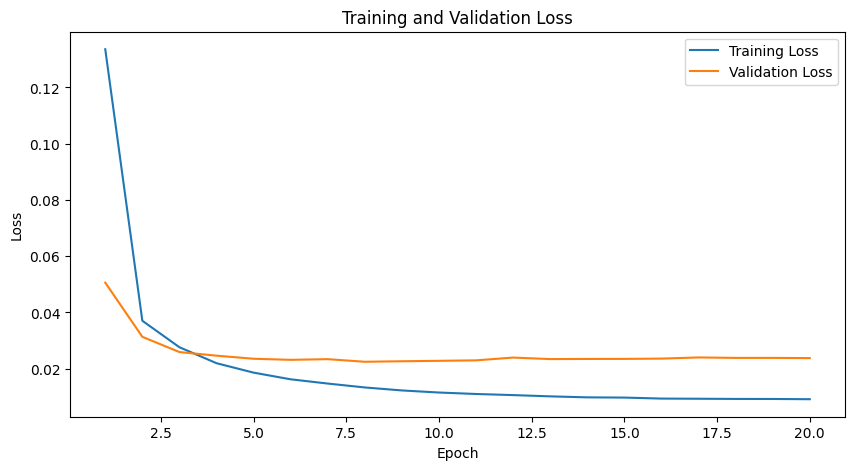

In [ ]:
# Define training and validation loops
def train_and_validate(model, train_dataloader, val_dataloader, criterion, optimizer, scheduler, num_epochs, accumulation_steps, device):
    train_losses = []
    val_losses = []
    best_val_loss = float('inf')
    best_model_wts = None

    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        optimizer.zero_grad()

        with tqdm(total=len(train_dataloader), desc=f"Epoch {epoch+1}/{num_epochs}", unit='batch') as pbar:
            for i, (images, index_labels) in enumerate(train_dataloader):
                images = images.to(device)
                index_labels = index_labels.to(device)

                # Forward Propagation
                outputs = model(images)
                loss = criterion(outputs, index_labels.long())
                loss.backward()

                # Gradient Accumulation
                if (i + 1) % accumulation_steps == 0:
                    optimizer.step()
                    optimizer.zero_grad()

                running_loss += loss.item()
                pbar.set_postfix({'loss': running_loss / (i + 1)})
                pbar.update(1)

        train_loss = running_loss / len(train_dataloader)
        train_losses.append(train_loss)

        # Validation
        model.eval()
        val_loss = 0.0
        with torch.no_grad():
            for images, index_labels in val_dataloader:
                images = images.to(device)
                index_labels = index_labels.to(device)

                outputs = model(images)
                loss = criterion(outputs, index_labels.long())
                val_loss += loss.item()

        val_loss /= len(val_dataloader)
        val_losses.append(val_loss)

        # Save the best model weights
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_model_wts = model.state_dict()

        print(f"Epoch [{epoch+1}/{num_epochs}], Training Loss: {train_loss:.4f}, Validation Loss: {val_loss:.4f}")
        scheduler.step()

    print("Training completed")

    # Plot the loss curves
    plt.figure(figsize=(10, 5))
    plt.plot(range(1, num_epochs + 1), train_losses, label='Training Loss')
    plt.plot(range(1, num_epochs + 1), val_losses, label='Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.title('Training and Validation Loss')
    plt.show()

    # Load the best model weights
    if best_model_wts is not None:
        model.load_state_dict(best_model_wts)

    return model

model = train_and_validate(model, train_dataloader, val_dataloader, criterion, optimizer, scheduler, num_epochs, accumulation_steps, device)

In [ ]:
# Original class names and indices
original_class_names = ["asphalt", "dirt", "mud", "water", "gravel", "other-terrain", "tree-trunk",
                        "tree-foliage", "bush", "fence", "structure", "pole", "vehicle", "rock",
                        "log", "other-object", "sky", "grass"]

# Class names and indices for evaluation after merging and excluding
class_names = ["bush", "dirt", "fence", "grass", "gravel", "log", "mud",
               "other-object", "other-terrain", "rock", "sky", "structure",
               "tree-foliage", "tree-trunk", "water"]

# Corresponding indices for classes to evaluate after merging and excluding
classes_to_evaluate = [8, 1, 9, 17, 4, 14, 2, 15, 5, 13, 16, 10, 7, 6, 3]

# Function to remap labels for mIoU calculation
def remap_labels(preds, labels):
    remapped_preds = preds.copy()
    remapped_labels = labels.copy()

    remapped_preds[preds == 0] = 5  # Merge "asphalt" into "other-terrain"
    remapped_labels[labels == 0] = 5

    remapped_preds[preds == 11] = 15  # Merge "pole" into "other-object"
    remapped_labels[labels == 11] = 15

    return remapped_preds, remapped_labels

# Function to compute mIoU for specified classes and return individual class IoUs
def compute_miou(preds, labels, classes_to_evaluate):
    iou_list = []
    class_ious = {}

    preds, labels = remap_labels(preds, labels)

    for class_id in classes_to_evaluate:
        intersection = np.logical_and(preds == class_id, labels == class_id).sum()
        union = np.logical_or(preds == class_id, labels == class_id).sum()
        if union == 0:
            class_ious[class_id] = float('nan')  # Assign nan if there is no union
            continue
        iou = intersection / union
        iou_list.append(iou)
        class_ious[class_id] = iou

    if len(iou_list) == 0:
        return 0, class_ious
    miou = np.nanmean(iou_list)  # Use nanmean to ignore nan values
    return miou, class_ious

# Function to evaluate mIoU on the test set
def evaluate_miou(model, dataloader, device, classes_to_evaluate):
    model.eval()
    total_miou = 0
    class_ious = {class_id: [] for class_id in classes_to_evaluate}
    with torch.no_grad():
        for images, labels in dataloader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            preds = torch.argmax(outputs, dim=1).cpu().numpy()
            labels = labels.cpu().numpy()

            miou, class_iou = compute_miou(preds, labels, classes_to_evaluate)
            total_miou += miou
            for class_id, iou in class_iou.items():
                class_ious[class_id].append(iou)

    avg_class_ious = {class_id: np.nanmean(iou_list) for class_id, iou_list in class_ious.items()}
    return total_miou / len(dataloader), avg_class_ious

# Evaluate mIoU on the test dataset
miou, class_ious = evaluate_miou(model, test_dataloader, device, classes_to_evaluate)
print(f"Mean IOU: {miou:.4f}")
for class_id, iou in class_ious.items():
    class_name = class_names[classes_to_evaluate.index(class_id)]
    print(f"Class {class_name} IOU: {iou}")


ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP O

<ipython-input-23-4008adb324c0>:67: RuntimeWarning: Mean of empty slice
  avg_class_ious = {class_id: np.nanmean(iou_list) for class_id, iou_list in class_ious.items()}


ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Combined Features Shape: torch.Size([10, 512, 16, 16])
ASPP Output Shapes: torch.Size([10, 256, 16, 16]), torch.Size([10, 256, 16, 16])
Adjusted ASPP O

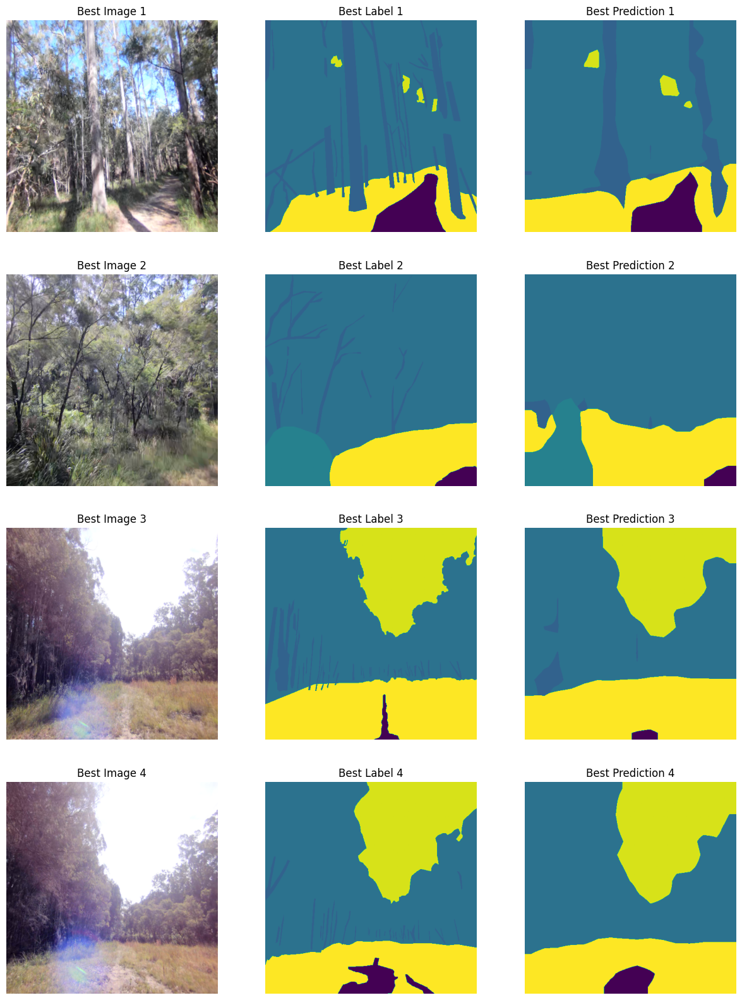

Worst Predictions:
-------- Worst 1 --------
Each class mIoU:
    Class dirt IoU: 0.3456
    Class fence IoU: nan
    Class grass IoU: 0.3315
    Class gravel IoU: nan
    Class log IoU: 0.0219
    Class bush IoU: 0.0000
    Class mud IoU: nan
    Class other-object IoU: nan
    Class other-terrain IoU: nan
    Class rock IoU: nan
    Class sky IoU: 0.0892
    Class structure IoU: nan
    Class tree-foliage IoU: 0.5511
    Class tree-trunk IoU: 0.1702
    Class water IoU: nan
-------- Worst 2 --------
Each class mIoU:
    Class bush IoU: 0.1123
    Class dirt IoU: 0.0000
    Class fence IoU: nan
    Class grass IoU: 0.1749
    Class gravel IoU: nan
    Class log IoU: nan
    Class mud IoU: nan
    Class other-object IoU: 0.3672
    Class other-terrain IoU: nan
    Class rock IoU: 0.0000
    Class sky IoU: 0.0000
    Class structure IoU: nan
    Class tree-foliage IoU: 0.8205
    Class tree-trunk IoU: 0.4623
    Class water IoU: nan
-------- Worst 3 --------
Each class mIoU:
    Class d

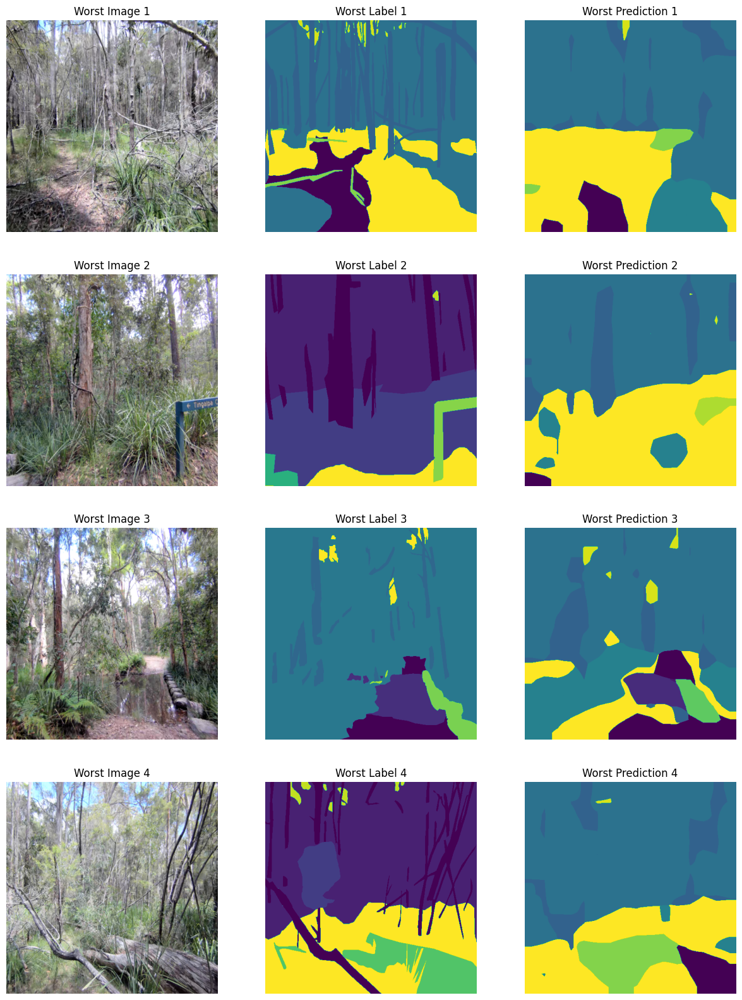

In [ ]:
# Function to get indices of best and worst images based on IoU
def get_best_worst_indices(preds, labels, num_images=4):
    iou_list = []
    image_class_ious = []
    for i in range(len(preds)):
        iou, class_iou = compute_miou(preds[i], labels[i], classes_to_evaluate)
        iou_list.append(iou)
        image_class_ious.append(class_iou)
    sorted_indices = np.argsort(iou_list)
    best_indices = sorted_indices[-num_images:]
    worst_indices = sorted_indices[:num_images]
    return best_indices, worst_indices, image_class_ious

# Visualization function with best and worst images
def visualize_predictions(model, dataloader, device, num_images=4):
    model.eval()
    images_batch, labels_batch, preds_batch, iou_batch = [], [], [], []

    with torch.no_grad():
        for images, labels in dataloader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            preds = torch.argmax(outputs, dim=1).cpu().numpy()
            labels = labels.cpu().numpy()
            images = images.cpu().numpy()

            for i in range(images.shape[0]):
                images_batch.append(images[i])
                labels_batch.append(labels[i])
                preds_batch.append(preds[i])

    best_indices, worst_indices, iou_batch = get_best_worst_indices(preds_batch, labels_batch, num_images)

    # Plot images, labels and predictions for best indices
    print("Best Predictions:")
    fig, axs = plt.subplots(num_images, 3, figsize=(15, 5 * num_images))
    for idx, i in enumerate(best_indices):
        img = np.transpose(images_batch[i], (1, 2, 0))
        label = labels_batch[i]
        pred = preds_batch[i]
        iou, class_iou = compute_miou(pred, label, classes_to_evaluate)

        axs[idx, 0].imshow(img)
        axs[idx, 0].set_title(f"Best Image {idx+1}")
        axs[idx, 0].axis('off')

        axs[idx, 1].imshow(label, cmap='viridis')
        axs[idx, 1].set_title(f"Best Label {idx+1}")
        axs[idx, 1].axis('off')

        axs[idx, 2].imshow(pred, cmap='viridis')
        axs[idx, 2].set_title(f"Best Prediction {idx+1}")
        axs[idx, 2].axis('off')

        # Print detailed information
        print(f"-------- Best {idx+1} --------")
        print("Each class mIoU:")
        sorted_class_iou = sorted(class_iou.items(), key=lambda x: x[1], reverse=True)
        for class_id, iou_value in sorted_class_iou:
            class_name = class_names[classes_to_evaluate.index(class_id)]
            print(f"    Class {class_name} IoU: {iou_value:.4f}")

    plt.show()

    # Plot images, labels and predictions for worst indices
    print("Worst Predictions:")
    fig, axs = plt.subplots(num_images, 3, figsize=(15, 5 * num_images))
    for idx, i in enumerate(worst_indices):
        img = np.transpose(images_batch[i], (1, 2, 0))
        label = labels_batch[i]
        pred = preds_batch[i]
        iou, class_iou = compute_miou(pred, label, classes_to_evaluate)

        axs[idx, 0].imshow(img)
        axs[idx, 0].set_title(f"Worst Image {idx+1}")
        axs[idx, 0].axis('off')

        axs[idx, 1].imshow(label, cmap='viridis')
        axs[idx, 1].set_title(f"Worst Label {idx+1}")
        axs[idx, 1].axis('off')

        axs[idx, 2].imshow(pred, cmap='viridis')
        axs[idx, 2].set_title(f"Worst Prediction {idx+1}")
        axs[idx, 2].axis('off')

        # Print detailed information
        print(f"-------- Worst {idx+1} --------")
        print("Each class mIoU:")
        sorted_class_iou = sorted(class_iou.items(), key=lambda x: x[1], reverse=True)
        for class_id, iou_value in sorted_class_iou:
            class_name = class_names[classes_to_evaluate.index(class_id)]
            print(f"    Class {class_name} IoU: {iou_value:.4f}")

    plt.show()

# Visualize predictions with best and worst images
visualize_predictions(model, test_dataloader, device)

# **Further ipmrovement we need: data enhancement**

We need to do more data enhance improvement in the future. First of all, scaling can enhance the effect of EfficientNet. I think we can do more research on scaling methods.

I did this data enhancement in the following code to make the truck clear:

1. Contrast Adjustment: Increase the contrast of the image to enhance the difference between the tree trunk and the background.
2. Brightness Adjustment: Adjust the brightness to make the tree trunk more prominent by increasing or decreasing the overall brightness.
3. Color Jitter: Randomly change the brightness, contrast, saturation, and hue of the image to enhance the model's robustness to color variations.
4. Gaussian Blur: Apply a slight Gaussian blur to the image to reduce noise and emphasize the main structures.
5. Crop and Resize: Randomly crop a portion of the image and resize it, simulating different perspectives and distances.

It's MIou drop. And I failed.


In [ ]:
import torchvision.transforms as transforms

# Defining data enhancement transform
transform = transforms.Compose([
    transforms.RandomApply([
        transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1)
    ], p=0.5),
    transforms.RandomApply([
        transforms.GaussianBlur(kernel_size=(5, 9), sigma=(0.1, 5))
    ], p=0.5),
    transforms.RandomAdjustSharpness(sharpness_factor=2),
    transforms.RandomResizedCrop(size=(512, 512), scale=(0.8, 1.0)),
    transforms.ToTensor()
])

label_transform = transforms.Compose([
    transforms.Resize((H, W), interpolation=Image.NEAREST),  # Resize with nearest neighbor interpolation to keep label values intact
    transforms.Lambda(lambda x: torch.from_numpy(np.array(x, dtype=np.int64)))  # Convert to tensor and keep as int64
])

####################
# Define paths
csv_train_path = '/content/drive/MyDrive/9517_project/splits/opt2d/train.csv'
data_root_dir = '/content/drive/MyDrive/9517_project/WildScenes'


# Variables to control the size of datasets
train_subset_size = 1400
val_subset_size = 300
test_subset_size = 300
####################

# Read the CSV file
data_frame = pd.read_csv(csv_train_path)

# Split the data into training and validation sets
train_df, val_df = train_test_split(data_frame, test_size=val_subset_size, random_state=42)

# Ensure the train subset size does not exceed the actual training data size
train_subset_size = min(train_subset_size, len(train_df))

# Sample the training data
train_df = train_df.sample(n=train_subset_size, random_state=42).reset_index(drop=True)

# Create datasets
train_dataset = WildScenes2dDataset(data_frame=train_df, root_dir=data_root_dir, transform=transform, label_transform=label_transform)
val_dataset = WildScenes2dDataset(data_frame=val_df, root_dir=data_root_dir, transform=transform, label_transform=label_transform)

####################
# Create dataloaders with adjusted batch size and workers
batch_size = 10
####################

n_cpu = os.cpu_count()

train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=n_cpu)
val_dataloader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=n_cpu)

# For test dataset
csv_test_path = '/content/drive/MyDrive/9517_project/splits/opt2d/pre/test.csv'
test_df = pd.read_csv(csv_test_path).sample(n=test_subset_size, random_state=42).reset_index(drop=True)
test_dataset = WildScenes2dDataset(data_frame=test_df, root_dir=data_root_dir, transform=transform, label_transform=label_transform)
test_dataloader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=n_cpu)


In [ ]:
# Example of iterating through the DataLoader
for images, labels in test_dataloader:
    print(images.shape)  # Should be [batch_size, 3, 512, 512]
    print(labels.shape)  # Should be [batch_size, 1, 512, 512]
    # Add your training code here
    break

torch.Size([10, 3, 512, 512])
torch.Size([10, 512, 512])


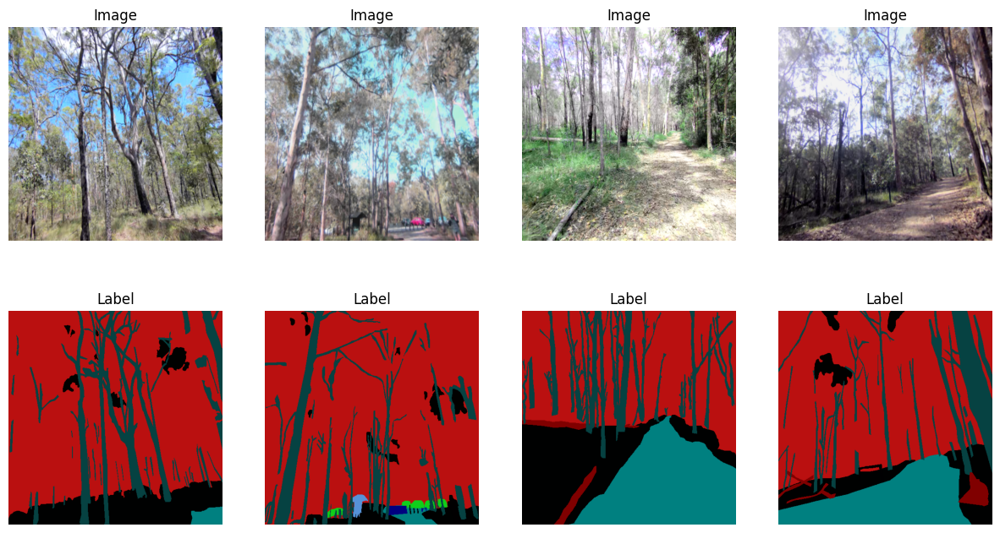

Batch size: 10
Image shape: (3, 512, 512)
Label shape: (512, 512)
Number of unique classes in first label: 5
Number of training samples: 1400
Number of validation samples: 300
Number of testing samples: 300


In [ ]:
# Custom color palette for labels (18 colors)
palette = [
    (60, 180, 75), (0, 128, 128), (128, 128, 128), (145, 30, 180),
    (128, 128, 0), (255, 225, 25), (250, 190, 190), (70, 240, 240),
    (170, 255, 195), (0, 0, 128), (170, 110, 40), (210, 245, 60),
    (240, 50, 230), (0, 130, 200), (128, 0, 0), (255, 0, 255),
    (255, 255, 0), (0, 255, 255)
]

# Create a colormap from the palette
cmap = mcolors.ListedColormap(palette)

# Function to decode the label tensor to a colored image
def decode_segmap(label_mask, colormap):
    label_colormap = np.zeros((label_mask.shape[0], label_mask.shape[1], 3), dtype=np.uint8)
    for label in range(0, len(colormap.colors)):
        label_colormap[label_mask == label] = np.array(colormap.colors[label]) * 255
    return label_colormap

# Debug function to show images and labels
def show_sample(dataloader):
    # Get a batch of samples
    images, labels = next(iter(dataloader))

    # Convert to numpy for display
    images = images.numpy()
    labels = labels.numpy()

    # Display the images and labels
    fig, axs = plt.subplots(2, 4, figsize=(15, 8))
    for i in range(4):
        axs[0, i].imshow(np.transpose(images[i], (1, 2, 0)))
        axs[0, i].set_title("Image")
        axs[0, i].axis('off')

        # Ensure the labels are displayed correctly by decoding the label
        label_img = decode_segmap(labels[i] if labels[i].ndim == 2 else labels[i][0], cmap)
        axs[1, i].imshow(label_img)
        axs[1, i].set_title("Label")
        axs[1, i].axis('off')
    plt.show()

    # Print additional information
    print(f"Batch size: {len(images)}")
    print(f"Image shape: {images[0].shape}")
    print(f"Label shape: {labels[0].shape}")
    print(f"Number of unique classes in first label: {len(np.unique(labels[0]))}")

# Show a sample from the training dataloader
show_sample(train_dataloader)

# Print the number of samples in each dataset
print(f"Number of training samples: {len(train_dataset)}")
print(f"Number of validation samples: {len(val_dataset)}")
print(f"Number of testing samples: {len(test_dataset)}")

In [ ]:
# Define the ASPP Class
class ASPP(nn.Module):
    def __init__(self, in_channels, out_channels, atrous_rates, dropout_rate=0.5):
        super(ASPP, self).__init__()
        modules = []
        for rate in atrous_rates:
            modules.append(nn.Sequential(
                nn.Conv2d(in_channels, out_channels, kernel_size=3, stride=1, padding=rate, dilation=rate, bias=False),
                nn.BatchNorm2d(out_channels),
                nn.ReLU(inplace=True),
                nn.Dropout(p=dropout_rate)  # Add Dropout layer
            ))
        self.convs = nn.ModuleList(modules)

        self.project = nn.Sequential(
            nn.Conv2d(len(atrous_rates) * out_channels, out_channels, kernel_size=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Dropout(p=dropout_rate)  # Add Dropout layer
        )

    def forward(self, x):
        res = []
        for conv in self.convs:
            res.append(conv(x))
        res = torch.cat(res, dim=1)
        return self.project(res)

# Defining the DualEncoderDeepLabV3 class
class DualEncoderDeepLabV3(nn.Module):
    def __init__(self, encoder1, encoder2, aspp_out_channels=256, num_classes=18, dropout_rate=0.5):
        super(DualEncoderDeepLabV3, self).__init__()
        self.encoder1 = encoder1
        self.encoder2 = encoder2

        self.aspp1 = ASPP(
            in_channels=self.encoder1.out_channels[-1],
            out_channels=aspp_out_channels,
            atrous_rates=[12, 24, 36],
            dropout_rate=dropout_rate  # Pass dropout rate to ASPP
        )

        self.aspp2 = ASPP(
            in_channels=self.encoder2.out_channels[-1],
            out_channels=aspp_out_channels,
            atrous_rates=[12, 24, 36],
            dropout_rate=dropout_rate  # Pass dropout rate to ASPP
        )

        self.conv1 = nn.Conv2d(aspp_out_channels, aspp_out_channels, kernel_size=1)
        self.conv2 = nn.Conv2d(aspp_out_channels, aspp_out_channels, kernel_size=1)

        self.classifier = nn.Sequential(
            nn.Conv2d(aspp_out_channels * 2, num_classes, kernel_size=1)
        )

        self.upsample = nn.Upsample(scale_factor=32, mode='bilinear', align_corners=False)

    def forward(self, x):
        features1 = self.encoder1(x)
        features2 = self.encoder2(x)

        aspp_out1 = self.aspp1(features1[-1])
        aspp_out2 = self.aspp2(features2[-1])

        aspp_out1 = self.conv1(aspp_out1)
        aspp_out2 = self.conv2(aspp_out2)

        combined_features = torch.cat([aspp_out1, aspp_out2], dim=1)

        output = self.classifier(combined_features)
        output = self.upsample(output)

        return output


In [ ]:
# Select ResNet-101 and EfficientNet-B3 as encoders
encoder1 = smp.encoders.get_encoder("resnet101", in_channels=3, weights="imagenet")
encoder2 = smp.encoders.get_encoder("efficientnet-b3", in_channels=3, weights="imagenet")

# Creating a dual encoder model
model = DualEncoderDeepLabV3(encoder1, encoder2, aspp_out_channels=256, num_classes=18)

# If a GPU is available, move the model to the GPU
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = model.to(device)

In [ ]:
num_epochs = 20
accumulation_steps = 4

In [ ]:
import torch.nn.functional as F

class FocalLoss(nn.Module):
    def __init__(self, alpha=0.2, gamma=4 , ignore_index=255):
        super(FocalLoss, self).__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.ignore_index = ignore_index

    def forward(self, inputs, targets):
        inputs = inputs.permute(0, 2, 3, 1).reshape(-1, inputs.size(1))
        targets = targets.view(-1)

        # Filter out ignored targets
        valid_mask = targets != self.ignore_index
        inputs = inputs[valid_mask]
        targets = targets[valid_mask]

        # Compute log probabilities
        logpt = F.log_softmax(inputs, dim=1)
        logpt = logpt.gather(1, targets.unsqueeze(1))
        logpt = logpt.view(-1)
        pt = logpt.exp()

        # Compute the focal loss
        loss = -1 * self.alpha * (1 - pt) ** self.gamma * logpt
        return loss.mean()

In [ ]:
# Instantiate the loss function
criterion = FocalLoss(alpha=0.2, gamma=4 , ignore_index=255)
# Defining the optimizer with L2 regularization
optimizer = optim.Adam(model.parameters(), lr=1e-4, weight_decay=1e-5)

# Defining a learning rate scheduler
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=1e-6)

Epoch 1/20: 100%|██████████| 140/140 [01:36<00:00,  1.45batch/s, loss=0.152]


Epoch [1/20], Training Loss: 0.1523, Validation Loss: 0.0569


Epoch 2/20: 100%|██████████| 140/140 [01:36<00:00,  1.45batch/s, loss=0.0458]


Epoch [2/20], Training Loss: 0.0458, Validation Loss: 0.0358


Epoch 3/20: 100%|██████████| 140/140 [01:37<00:00,  1.44batch/s, loss=0.0353]


Epoch [3/20], Training Loss: 0.0353, Validation Loss: 0.0304


Epoch 4/20: 100%|██████████| 140/140 [01:36<00:00,  1.45batch/s, loss=0.0311]


Epoch [4/20], Training Loss: 0.0311, Validation Loss: 0.0279


Epoch 5/20: 100%|██████████| 140/140 [01:38<00:00,  1.43batch/s, loss=0.0286]


Epoch [5/20], Training Loss: 0.0286, Validation Loss: 0.0267


Epoch 6/20: 100%|██████████| 140/140 [01:37<00:00,  1.44batch/s, loss=0.0259]


Epoch [6/20], Training Loss: 0.0259, Validation Loss: 0.0257


Epoch 7/20: 100%|██████████| 140/140 [01:39<00:00,  1.41batch/s, loss=0.0246]


Epoch [7/20], Training Loss: 0.0246, Validation Loss: 0.0258


Epoch 8/20: 100%|██████████| 140/140 [01:35<00:00,  1.47batch/s, loss=0.0234]


Epoch [8/20], Training Loss: 0.0234, Validation Loss: 0.0246


Epoch 9/20: 100%|██████████| 140/140 [01:37<00:00,  1.43batch/s, loss=0.022]


Epoch [9/20], Training Loss: 0.0220, Validation Loss: 0.0251


Epoch 10/20: 100%|██████████| 140/140 [01:40<00:00,  1.40batch/s, loss=0.0212]


Epoch [10/20], Training Loss: 0.0212, Validation Loss: 0.0250


Epoch 11/20: 100%|██████████| 140/140 [01:37<00:00,  1.43batch/s, loss=0.0207]


Epoch [11/20], Training Loss: 0.0207, Validation Loss: 0.0245


Epoch 12/20: 100%|██████████| 140/140 [01:37<00:00,  1.44batch/s, loss=0.02]


Epoch [12/20], Training Loss: 0.0200, Validation Loss: 0.0242


Epoch 13/20: 100%|██████████| 140/140 [01:35<00:00,  1.47batch/s, loss=0.0192]


Epoch [13/20], Training Loss: 0.0192, Validation Loss: 0.0245


Epoch 14/20: 100%|██████████| 140/140 [01:35<00:00,  1.47batch/s, loss=0.0188]


Epoch [14/20], Training Loss: 0.0188, Validation Loss: 0.0245


Epoch 15/20: 100%|██████████| 140/140 [01:34<00:00,  1.48batch/s, loss=0.0186]


Epoch [15/20], Training Loss: 0.0186, Validation Loss: 0.0246


Epoch 16/20: 100%|██████████| 140/140 [01:34<00:00,  1.49batch/s, loss=0.0183]


Epoch [16/20], Training Loss: 0.0183, Validation Loss: 0.0247


Epoch 17/20: 100%|██████████| 140/140 [01:35<00:00,  1.47batch/s, loss=0.0178]


Epoch [17/20], Training Loss: 0.0178, Validation Loss: 0.0245


Epoch 18/20: 100%|██████████| 140/140 [01:38<00:00,  1.42batch/s, loss=0.0179]


Epoch [18/20], Training Loss: 0.0179, Validation Loss: 0.0247


Epoch 19/20: 100%|██████████| 140/140 [01:36<00:00,  1.45batch/s, loss=0.0178]


Epoch [19/20], Training Loss: 0.0178, Validation Loss: 0.0245


Epoch 20/20: 100%|██████████| 140/140 [01:35<00:00,  1.47batch/s, loss=0.0178]


Epoch [20/20], Training Loss: 0.0178, Validation Loss: 0.0248
Training completed


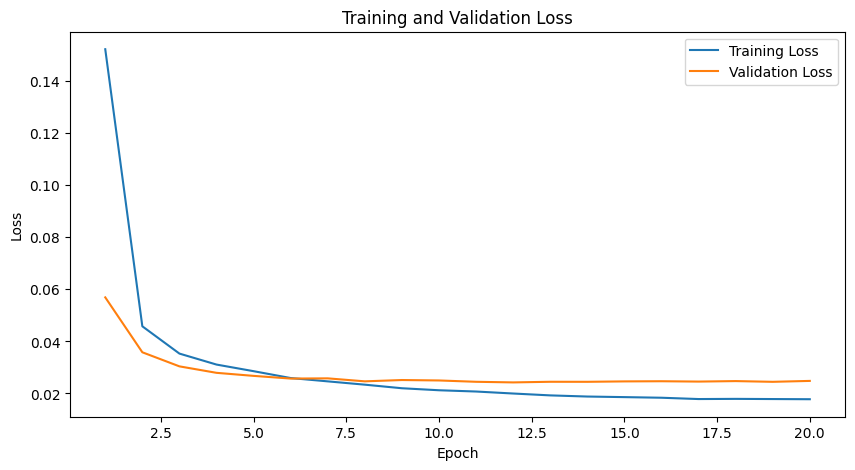

In [ ]:
# Define training and validation loops
def train_and_validate(model, train_dataloader, val_dataloader, criterion, optimizer, scheduler, num_epochs, accumulation_steps, device):
    train_losses = []
    val_losses = []
    best_val_loss = float('inf')
    best_model_wts = None

    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        optimizer.zero_grad()

        with tqdm(total=len(train_dataloader), desc=f"Epoch {epoch+1}/{num_epochs}", unit='batch') as pbar:
            for i, (images, index_labels) in enumerate(train_dataloader):
                images = images.to(device)
                index_labels = index_labels.to(device)

                # Forward Propagation
                outputs = model(images)
                loss = criterion(outputs, index_labels.long())
                loss.backward()

                # Gradient Accumulation
                if (i + 1) % accumulation_steps == 0:
                    optimizer.step()
                    optimizer.zero_grad()

                running_loss += loss.item()
                pbar.set_postfix({'loss': running_loss / (i + 1)})
                pbar.update(1)

        train_loss = running_loss / len(train_dataloader)
        train_losses.append(train_loss)

        # Validation
        model.eval()
        val_loss = 0.0
        with torch.no_grad():
            for images, index_labels in val_dataloader:
                images = images.to(device)
                index_labels = index_labels.to(device)

                outputs = model(images)
                loss = criterion(outputs, index_labels.long())
                val_loss += loss.item()

        val_loss /= len(val_dataloader)
        val_losses.append(val_loss)

        # Save the best model weights
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_model_wts = model.state_dict()

        print(f"Epoch [{epoch+1}/{num_epochs}], Training Loss: {train_loss:.4f}, Validation Loss: {val_loss:.4f}")
        scheduler.step()

    print("Training completed")

    # Plot the loss curves
    plt.figure(figsize=(10, 5))
    plt.plot(range(1, num_epochs + 1), train_losses, label='Training Loss')
    plt.plot(range(1, num_epochs + 1), val_losses, label='Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.title('Training and Validation Loss')
    plt.show()

    # Load the best model weights
    if best_model_wts is not None:
        model.load_state_dict(best_model_wts)

    return model

model = train_and_validate(model, train_dataloader, val_dataloader, criterion, optimizer, scheduler, num_epochs, accumulation_steps, device)

In [ ]:
# Original class names and indices
original_class_names = ["asphalt", "dirt", "mud", "water", "gravel", "other-terrain", "tree-trunk",
                        "tree-foliage", "bush", "fence", "structure", "pole", "vehicle", "rock",
                        "log", "other-object", "sky", "grass"]

# Class names and indices for evaluation after merging and excluding
class_names = ["bush", "dirt", "fence", "grass", "gravel", "log", "mud",
               "other-object", "other-terrain", "rock", "sky", "structure",
               "tree-foliage", "tree-trunk", "water"]

# Corresponding indices for classes to evaluate after merging and excluding
classes_to_evaluate = [8, 1, 9, 17, 4, 14, 2, 15, 5, 13, 16, 10, 7, 6, 3]

# Function to remap labels for mIoU calculation
def remap_labels(preds, labels):
    remapped_preds = preds.copy()
    remapped_labels = labels.copy()

    remapped_preds[preds == 0] = 5  # Merge "asphalt" into "other-terrain"
    remapped_labels[labels == 0] = 5

    remapped_preds[preds == 11] = 15  # Merge "pole" into "other-object"
    remapped_labels[labels == 11] = 15

    return remapped_preds, remapped_labels

# Function to compute mIoU for specified classes and return individual class IoUs
def compute_miou(preds, labels, classes_to_evaluate):
    iou_list = []
    class_ious = {}

    preds, labels = remap_labels(preds, labels)

    for class_id in classes_to_evaluate:
        intersection = np.logical_and(preds == class_id, labels == class_id).sum()
        union = np.logical_or(preds == class_id, labels == class_id).sum()
        if union == 0:
            class_ious[class_id] = float('nan')  # Assign nan if there is no union
            continue
        iou = intersection / union
        iou_list.append(iou)
        class_ious[class_id] = iou

    if len(iou_list) == 0:
        return 0, class_ious
    miou = np.nanmean(iou_list)  # Use nanmean to ignore nan values
    return miou, class_ious

# Function to evaluate mIoU on the test set
def evaluate_miou(model, dataloader, device, classes_to_evaluate):
    model.eval()
    total_miou = 0
    class_ious = {class_id: [] for class_id in classes_to_evaluate}
    with torch.no_grad():
        for images, labels in dataloader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            preds = torch.argmax(outputs, dim=1).cpu().numpy()
            labels = labels.cpu().numpy()

            miou, class_iou = compute_miou(preds, labels, classes_to_evaluate)
            total_miou += miou
            for class_id, iou in class_iou.items():
                class_ious[class_id].append(iou)

    avg_class_ious = {class_id: np.nanmean(iou_list) for class_id, iou_list in class_ious.items()}
    return total_miou / len(dataloader), avg_class_ious

# Evaluate mIoU on the test dataset
miou, class_ious = evaluate_miou(model, test_dataloader, device, classes_to_evaluate)
print(f"Mean IOU: {miou:.4f}")
for class_id, iou in class_ious.items():
    class_name = class_names[classes_to_evaluate.index(class_id)]
    print(f"Class {class_name} IOU: {iou}")


Mean IOU: 0.3804
Class bush IOU: 0.1945051185803721
Class dirt IOU: 0.7129133354524401
Class fence IOU: nan
Class grass IOU: 0.578003810222828
Class gravel IOU: 0.0
Class log IOU: 0.1938027771954453
Class mud IOU: 0.0
Class other-object IOU: 0.0381577726093233
Class other-terrain IOU: nan
Class rock IOU: 0.19783357796395265
Class sky IOU: 0.5364967126215958
Class structure IOU: 0.0
Class tree-foliage IOU: 0.7500317878645226
Class tree-trunk IOU: 0.15406071869092822
Class water IOU: 0.5844666196598121


<ipython-input-49-4008adb324c0>:67: RuntimeWarning: Mean of empty slice
  avg_class_ious = {class_id: np.nanmean(iou_list) for class_id, iou_list in class_ious.items()}


Best Predictions:
-------- Best 1 --------
Each class mIoU:
    Class bush IoU: nan
    Class dirt IoU: nan
    Class fence IoU: nan
    Class grass IoU: 0.7729
    Class gravel IoU: nan
    Class log IoU: nan
    Class mud IoU: nan
    Class other-object IoU: nan
    Class other-terrain IoU: nan
    Class rock IoU: nan
    Class sky IoU: 0.7061
    Class structure IoU: nan
    Class tree-foliage IoU: 0.7923
    Class tree-trunk IoU: 0.0324
    Class water IoU: nan
-------- Best 2 --------
Each class mIoU:
    Class bush IoU: nan
    Class dirt IoU: 0.6015
    Class fence IoU: nan
    Class grass IoU: 0.8010
    Class gravel IoU: nan
    Class log IoU: nan
    Class mud IoU: nan
    Class other-object IoU: nan
    Class other-terrain IoU: nan
    Class rock IoU: nan
    Class sky IoU: 0.8853
    Class structure IoU: nan
    Class tree-foliage IoU: 0.8786
    Class tree-trunk IoU: 0.0000
    Class water IoU: nan
-------- Best 3 --------
Each class mIoU:
    Class bush IoU: 0.0000
    Cl

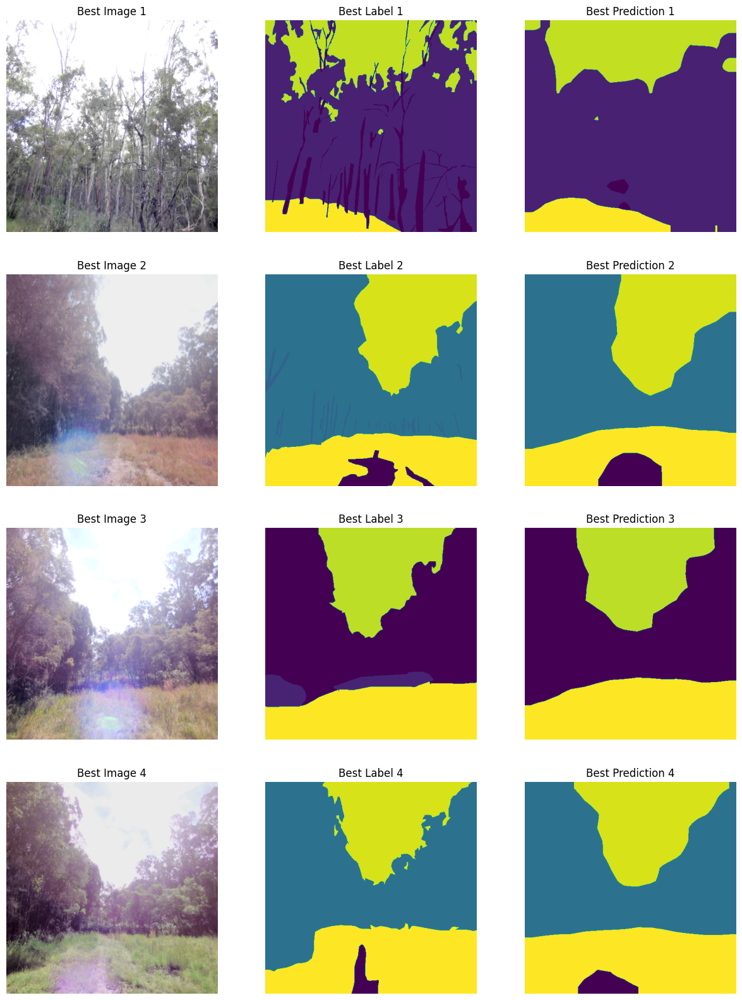

Worst Predictions:
-------- Worst 1 --------
Each class mIoU:
    Class dirt IoU: 0.0804
    Class fence IoU: nan
    Class grass IoU: 0.3543
    Class gravel IoU: nan
    Class log IoU: 0.1049
    Class bush IoU: 0.0000
    Class mud IoU: nan
    Class other-object IoU: nan
    Class other-terrain IoU: nan
    Class rock IoU: nan
    Class sky IoU: 0.0000
    Class structure IoU: nan
    Class tree-foliage IoU: 0.5324
    Class tree-trunk IoU: 0.0475
    Class water IoU: nan
-------- Worst 2 --------
Each class mIoU:
    Class bush IoU: 0.0000
    Class dirt IoU: nan
    Class fence IoU: nan
    Class grass IoU: 0.0523
    Class gravel IoU: nan
    Class log IoU: nan
    Class mud IoU: nan
    Class other-object IoU: nan
    Class other-terrain IoU: nan
    Class rock IoU: nan
    Class sky IoU: 0.0599
    Class structure IoU: nan
    Class tree-foliage IoU: 0.6709
    Class tree-trunk IoU: 0.1631
    Class water IoU: nan
-------- Worst 3 --------
Each class mIoU:
    Class bush IoU: 

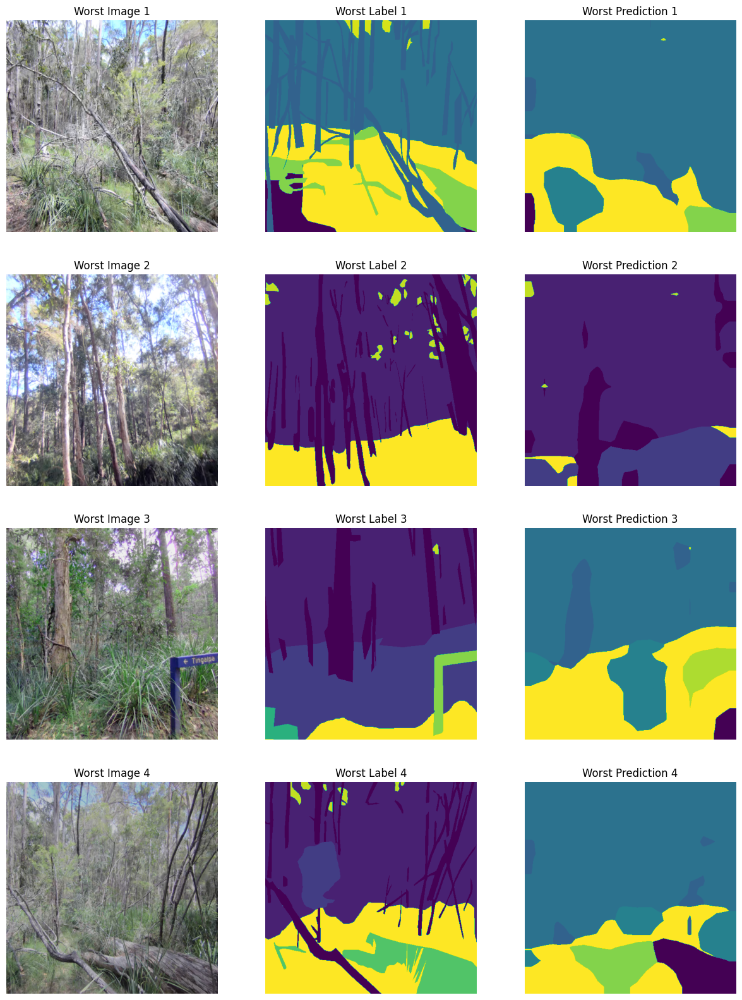

In [ ]:
# Function to get indices of best and worst images based on IoU
def get_best_worst_indices(preds, labels, num_images=4):
    iou_list = []
    image_class_ious = []
    for i in range(len(preds)):
        iou, class_iou = compute_miou(preds[i], labels[i], classes_to_evaluate)
        iou_list.append(iou)
        image_class_ious.append(class_iou)
    sorted_indices = np.argsort(iou_list)
    best_indices = sorted_indices[-num_images:]
    worst_indices = sorted_indices[:num_images]
    return best_indices, worst_indices, image_class_ious

# Visualization function with best and worst images
def visualize_predictions(model, dataloader, device, num_images=4):
    model.eval()
    images_batch, labels_batch, preds_batch, iou_batch = [], [], [], []

    with torch.no_grad():
        for images, labels in dataloader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            preds = torch.argmax(outputs, dim=1).cpu().numpy()
            labels = labels.cpu().numpy()
            images = images.cpu().numpy()

            for i in range(images.shape[0]):
                images_batch.append(images[i])
                labels_batch.append(labels[i])
                preds_batch.append(preds[i])

    best_indices, worst_indices, iou_batch = get_best_worst_indices(preds_batch, labels_batch, num_images)

    # Plot images, labels and predictions for best indices
    print("Best Predictions:")
    fig, axs = plt.subplots(num_images, 3, figsize=(15, 5 * num_images))
    for idx, i in enumerate(best_indices):
        img = np.transpose(images_batch[i], (1, 2, 0))
        label = labels_batch[i]
        pred = preds_batch[i]
        iou, class_iou = compute_miou(pred, label, classes_to_evaluate)

        axs[idx, 0].imshow(img)
        axs[idx, 0].set_title(f"Best Image {idx+1}")
        axs[idx, 0].axis('off')

        axs[idx, 1].imshow(label, cmap='viridis')
        axs[idx, 1].set_title(f"Best Label {idx+1}")
        axs[idx, 1].axis('off')

        axs[idx, 2].imshow(pred, cmap='viridis')
        axs[idx, 2].set_title(f"Best Prediction {idx+1}")
        axs[idx, 2].axis('off')

        # Print detailed information
        print(f"-------- Best {idx+1} --------")
        print("Each class mIoU:")
        sorted_class_iou = sorted(class_iou.items(), key=lambda x: x[1], reverse=True)
        for class_id, iou_value in sorted_class_iou:
            class_name = class_names[classes_to_evaluate.index(class_id)]
            print(f"    Class {class_name} IoU: {iou_value:.4f}")

    plt.show()

    # Plot images, labels and predictions for worst indices
    print("Worst Predictions:")
    fig, axs = plt.subplots(num_images, 3, figsize=(15, 5 * num_images))
    for idx, i in enumerate(worst_indices):
        img = np.transpose(images_batch[i], (1, 2, 0))
        label = labels_batch[i]
        pred = preds_batch[i]
        iou, class_iou = compute_miou(pred, label, classes_to_evaluate)

        axs[idx, 0].imshow(img)
        axs[idx, 0].set_title(f"Worst Image {idx+1}")
        axs[idx, 0].axis('off')

        axs[idx, 1].imshow(label, cmap='viridis')
        axs[idx, 1].set_title(f"Worst Label {idx+1}")
        axs[idx, 1].axis('off')

        axs[idx, 2].imshow(pred, cmap='viridis')
        axs[idx, 2].set_title(f"Worst Prediction {idx+1}")
        axs[idx, 2].axis('off')

        # Print detailed information
        print(f"-------- Worst {idx+1} --------")
        print("Each class mIoU:")
        sorted_class_iou = sorted(class_iou.items(), key=lambda x: x[1], reverse=True)
        for class_id, iou_value in sorted_class_iou:
            class_name = class_names[classes_to_evaluate.index(class_id)]
            print(f"    Class {class_name} IoU: {iou_value:.4f}")

    plt.show()

# Visualize predictions with best and worst images
visualize_predictions(model, test_dataloader, device)